In [176]:
import json
import numpy as np
import pandas as pd
from pathlib import Path
import os
import sys
import warnings
from utils import *
import matplotlib.pyplot as plt
import seaborn as sns

warnings.simplefilter('ignore')

sys.path.append('../../utilities')
sys.path.append('../../models/grt123')
sys.path.append('../../models/grt123/training')
sys.path.append('../../models/grt123/preprocessing/')

# from layers import nms,iou
from summit_utils import SummitScan, xyz2irc
from evaluation import noduleCADEvaluation

workspace_path = Path(os.getcwd()).parent.parent


In [177]:
flavour = 'test_balanced'

# Scan Metadata

In [178]:

def set_is_actionable(row):
    if row['radiology_report_management_plan_final'] in ['3_MONTH_FOLLOW_UP_SCAN','URGENT_REFERRAL', 'ALWAYS_SCAN_AT_YEAR_1']:
        return 'Actonable'
    else:
        return 'Non-Actionable'

def set_smoking_pack_years_cats(df):
    df[df['smoking_pack_years'] < 0] = np.nan
    return pd.qcut(df['smoking_pack_years'], 3, labels=['Low (15-35)', 'Medium (35-50)', 'High (50+)'])

person_data = pd.read_csv(
    f'{workspace_path}/data/summit/data/person_data.csv',
    usecols=['LDCT_RADIOLOGY_REPORT_main_participant_id', 'lung_health_check_clinical_smoking_pack_years', 'ocd_DeprivationScore_IMDRank']
).rename(columns={
    'lung_health_check_clinical_smoking_pack_years':'smoking_pack_years',
    'ocd_DeprivationScore_IMDRank':'deprivation_score'
}).assign(
    smoking_pack_years_cats=lambda df: set_smoking_pack_years_cats(df),
    IMDRank_tertile=lambda df: pd.qcut(df['deprivation_score'], 3, labels=['Low', 'Medium', 'High']),
    IMDRank_quintile=lambda df: pd.qcut(df['deprivation_score'], 5, labels=['Low', 'Low-Medium', 'Medium', 'Medium-High', 'High']),
)
                          
scan_metadata = (
    pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/test_scans_metadata.csv')
    .assign(name=lambda df: df['LDCT_RADIOLOGY_REPORT_main_participant_id'] + '_Y0_BASELINE_A')
    .assign(is_actionable=lambda df: df.apply(set_is_actionable, axis=1))
    .assign(gender_is_actionable=lambda df: df.apply(set_gender_is_actionable, axis=1))    
    .assign(gender_is_not_actionable=lambda df: df.apply(set_gender_is_not_actionable, axis=1))    
    .assign(ethnic_group_is_actionable=lambda df: df.apply(set_ethnic_group_is_actionable, axis=1))    
    .assign(ethnic_group_is_not_actionable=lambda df: df.apply(set_ethnic_group_is_not_actionable, axis=1))    
    .rename(columns={
        'participant_details_gender':'gender',
        'lung_health_check_demographics_race_ethnicgroup':'ethnic_group'
    })
).merge(person_data, on='LDCT_RADIOLOGY_REPORT_main_participant_id')
scan_metadata = (
    scan_metadata
    .assign(smoking_pack_years_is_actionable=lambda df: df.apply(set_smoking_pack_years_is_actionable, axis=1))
    .assign(imdrank_is_actionable=lambda df: df.apply(set_imdrank_is_actionable, axis=1))    
)

In [179]:

for col in scan_metadata.columns:
    if col.lower().find('age')>-1:
        print(col)

radiology_report_management_plan_algorithm_recommendation
radiology_report_management_plan_final
radiology_report_management_plan_recommendation_comment
participant_details_age
lung_health_check_smoking_cigarillos_start_age
lung_health_check_smoking_cigarillos_stop_age
lung_health_check_smoking_cigars_start_age
lung_health_check_smoking_cigars_stop_age
lung_health_check_smoking_history_age_started_smoking
lung_health_check_smoking_history_age_stopped_smoking
lung_health_check_smoking_marijuana_start_age
lung_health_check_smoking_marijuana_stop_age
lung_health_check_smoking_pipe_start_age
lung_health_check_smoking_pipe_stop_age
lung_health_check_smoking_waterpipe_start_age
lung_health_check_smoking_waterpipe_stop_age
participant_age_at_consent
participant_age_at_consent_cats


## GRT123

NOT-UPPER       290
UPPER           258
NOT_ANSWERED    151
Name: nodule_site_combined, dtype: int64

/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/test_balanced/test_balanced_metadata.csv
Total number of included nodule annotations: 699
Total number of nodule annotations: 699
Cases: 595
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: 380


100%|██████████| 1000/1000 [00:16<00:00, 62.34it/s]


,0,159,476,1111,2381,4920,9999
0,0.151 (0.118 - 0.19),0.208 (0.17 - 0.25),0.292 (0.245 - 0.342),0.419 (0.37 - 0.468),0.56 (0.509 - 0.613),0.722 (0.683 - 0.764),0.819 (0.787 - 0.852)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.151,0.118,0.190
159,0.250,0.208,0.170,0.250
476,0.500,0.292,0.245,0.342
1111,1.000,0.419,0.370,0.468
2381,2.000,0.560,0.509,0.613
4920,4.000,0.722,0.683,0.764
9999,8.000,0.819,0.787,0.852


Mean Sensitivity: 0.45 Low Sensitivity: 0.41 High Sensitivity: 0.497


,True positives,622
0,False positives,12548.000
1,False negatives,77.000
2,True negatives,0.000
3,Total number of candidates,13189.000
4,Total number of nodules,699.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,20.000
7,Sensitivity,0.890
8,Average number of candidates per scan,22.166


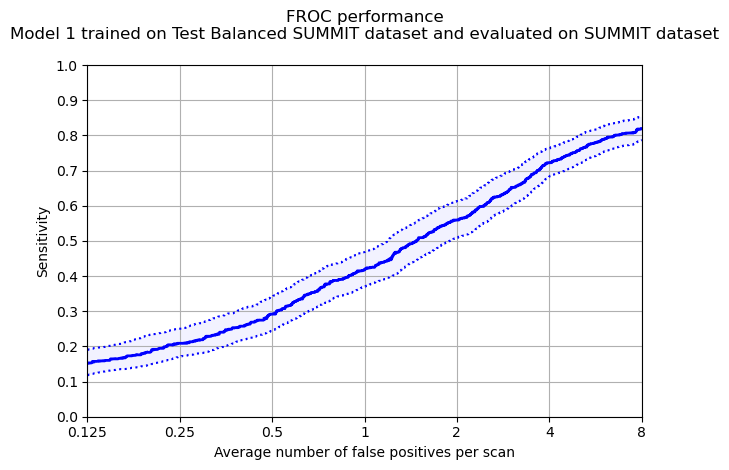

In [180]:
# Add in diameter cuts for later analysis
def combine_site(nodule_site):
    if nodule_site.find('UPPER') > -1:
        return 'UPPER'
    elif nodule_site.find('NOT') > -1:
        return 'NOT_ANSWERED'
    else:
        return 'NOT-UPPER'
    
def combine_site2(nodule_site):
    if nodule_site.find('RIGHT') > -1:
        return 'RIGHT'
    elif nodule_site.find('LEFT') > -1:
        return 'LEFT'
    else:
        return 'NOT_ANSWERED'

diameter_cats = [0, 4, 8, 15, 20, 30, 40, 999]
diameter_lbs = [
    '0-4mm',
    '4-8mm',
    '8-15mm',
    '15-20mm',
    '20-30mm',
    '30-40mm',
    '40+mm'
]

annotations = (
    pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')
    .assign(diameter_cats=lambda df: 
        pd.cut(
            df['nodule_diameter_mm'], 
            bins=diameter_cats,
            labels=diameter_lbs
        )            
    )
    .assign(nodule_site_combined=lambda df: df['nodule_site'].apply(combine_site))
    .assign(nodule_site_combined2=lambda df: df['nodule_site'].apply(combine_site2))
)

display(annotations.nodule_site_combined.value_counts())

# save back to the metadata file
annotations.to_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv', index=False)
grt123_summit_summit = noduleCADEvaluation(
    annotations_filename=f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv',
    annotations_excluded_filename=f'{workspace_path}/data/summit/metadata/grt123_annotations_excluded_empty.csv',
    seriesuids_filename=f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv',
    results_filename=f"{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_predictions.csv",    
    filter='\nModel 1 trained on Test Balanced SUMMIT dataset and evaluated on SUMMIT dataset\n',
    outputDir=f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}',
)
caluclate_cpm_from_bootstrapping(f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/froc_{flavour}_predictions_bootstrapping.csv')
show_metrics(f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/CADAnalysis.txt')

### Gender analysis

Protected Group: MALE


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,56.0,2.0,7.0,4.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp6mpkkhzd/annotations.csv
Total number of included nodule annotations: 396
Total number of nodule annotations: 396
Cases: 342


100%|██████████| 1000/1000 [00:08<00:00, 113.91it/s]


,0,159,476,1111,2381,4920,9999
0,0.129 (0.084 - 0.182),0.192 (0.137 - 0.256),0.263 (0.208 - 0.328),0.394 (0.328 - 0.469),0.528 (0.457 - 0.607),0.704 (0.633 - 0.769),0.823 (0.781 - 0.864)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.129,0.084,0.182
159,0.250,0.192,0.137,0.256
476,0.500,0.263,0.208,0.328
1111,1.000,0.394,0.328,0.469
2381,2.000,0.528,0.457,0.607
4920,4.000,0.704,0.633,0.769
9999,8.000,0.823,0.781,0.864


Mean Sensitivity: 0.43 Low Sensitivity: 0.38 High Sensitivity: 0.496


,True positives,356
0,False positives,7888.000
1,False negatives,40.000
2,True negatives,0.000
3,Total number of candidates,8256.000
4,Total number of nodules,396.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,12.000
7,Sensitivity,0.899
8,Average number of candidates per scan,24.140


Protected Group: FEMALE


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,27.0,52.0,5.0,7.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpuqnudnlt/annotations.csv
Total number of included nodule annotations: 299
Total number of nodule annotations: 299
Cases: 251
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: 380


100%|██████████| 1000/1000 [00:05<00:00, 194.45it/s]


,0,159,476,1111,2381,4920,9999
0,0.176 (0.125 - 0.235),0.232 (0.175 - 0.295),0.339 (0.279 - 0.405),0.451 (0.383 - 0.526),0.604 (0.528 - 0.68),0.732 (0.677 - 0.794),0.816 (0.767 - 0.863)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.176,0.125,0.235
159,0.250,0.232,0.175,0.295
476,0.500,0.339,0.279,0.405
1111,1.000,0.451,0.383,0.526
2381,2.000,0.604,0.528,0.680
4920,4.000,0.732,0.677,0.794
9999,8.000,0.816,0.767,0.863


Mean Sensitivity: 0.48 Low Sensitivity: 0.42 High Sensitivity: 0.543


,True positives,262
0,False positives,4626.000
1,False negatives,37.000
2,True negatives,0.000
3,Total number of candidates,4895.000
4,Total number of nodules,299.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,8.000
7,Sensitivity,0.876
8,Average number of candidates per scan,19.502


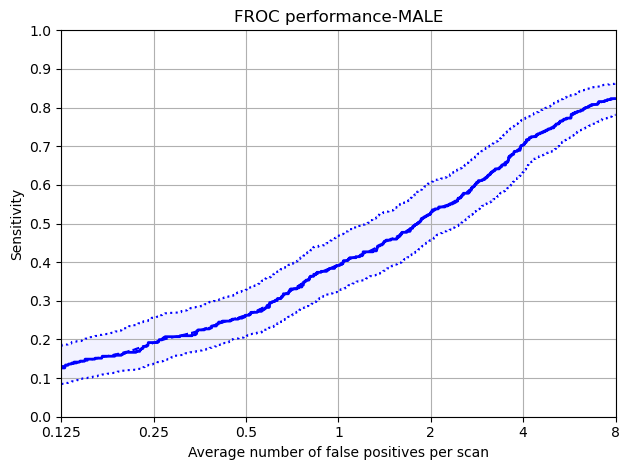

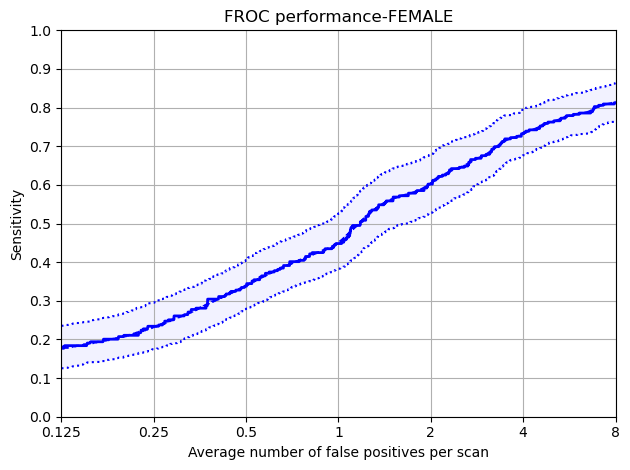

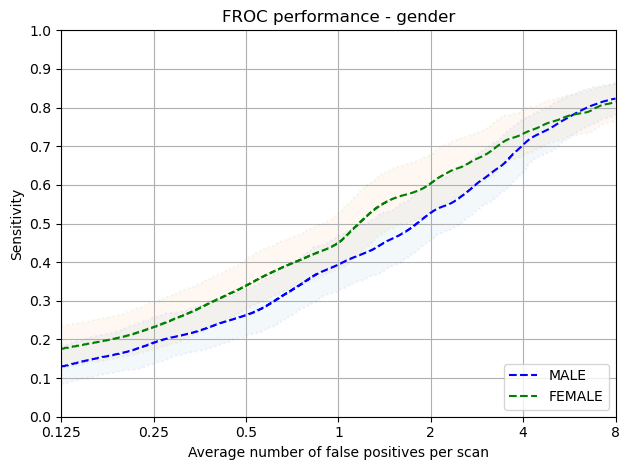

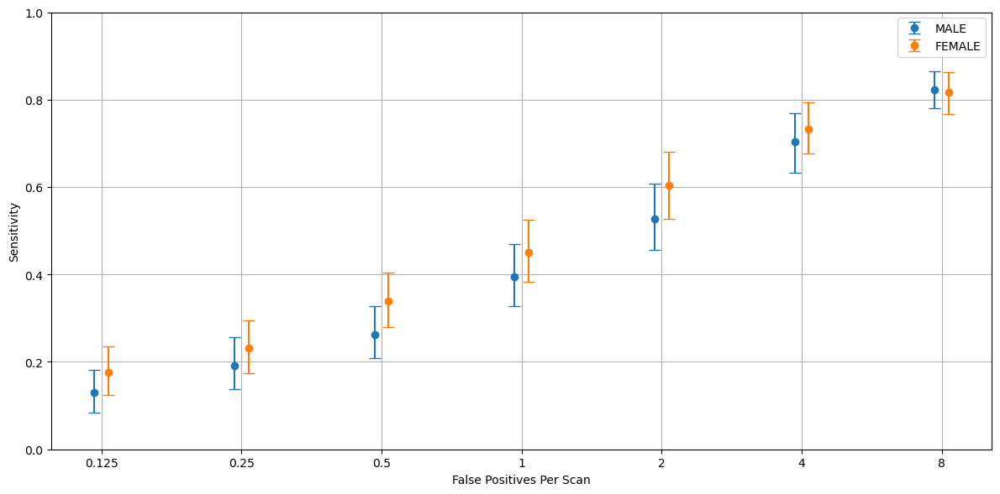

In [181]:

annotations_excluded = pd.read_csv(f'{workspace_path}/data/summit/metadata/grt123_annotations_excluded_empty.csv')

annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')

predictions = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_predictions.csv')

protected_group = 'gender'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour, 'Gender', data_dict)

### Age Analysis

Protected Group: 65-69


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,24.0,61.0,2.0,7.0,5.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpewcs_phr/annotations.csv
Total number of included nodule annotations: 168
Total number of nodule annotations: 168
Cases: 166


100%|██████████| 1000/1000 [00:03<00:00, 262.83it/s]


,0,159,476,1111,2381,4920,9999
0,0.144 (0.083 - 0.219),0.198 (0.127 - 0.284),0.281 (0.195 - 0.38),0.43 (0.351 - 0.518),0.589 (0.503 - 0.675),0.753 (0.674 - 0.826),0.851 (0.792 - 0.904)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.144,0.083,0.219
159,0.250,0.198,0.127,0.284
476,0.500,0.281,0.195,0.380
1111,1.000,0.430,0.351,0.518
2381,2.000,0.589,0.503,0.675
4920,4.000,0.753,0.674,0.826
9999,8.000,0.851,0.792,0.904


Mean Sensitivity: 0.46 Low Sensitivity: 0.39 High Sensitivity: 0.544


,True positives,149
0,False positives,3497.000
1,False negatives,19.000
2,True negatives,0.000
3,Total number of candidates,3649.000
4,Total number of nodules,168.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,3.000
7,Sensitivity,0.887
8,Average number of candidates per scan,21.982


Protected Group: 60-64


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,53.0,4.0,8.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp8r391l03/annotations.csv
Total number of included nodule annotations: 200
Total number of nodule annotations: 200
Cases: 148


100%|██████████| 1000/1000 [00:03<00:00, 285.84it/s]


,0,159,476,1111,2381,4920,9999
0,0.144 (0.087 - 0.221),0.196 (0.124 - 0.28),0.27 (0.179 - 0.371),0.401 (0.309 - 0.504),0.526 (0.424 - 0.643),0.702 (0.619 - 0.802),0.795 (0.734 - 0.859)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.144,0.087,0.221
159,0.250,0.196,0.124,0.280
476,0.500,0.270,0.179,0.371
1111,1.000,0.401,0.309,0.504
2381,2.000,0.526,0.424,0.643
4920,4.000,0.702,0.619,0.802
9999,8.000,0.795,0.734,0.859


Mean Sensitivity: 0.43 Low Sensitivity: 0.35 High Sensitivity: 0.526


,True positives,179
0,False positives,3217.000
1,False negatives,21.000
2,True negatives,0.000
3,Total number of candidates,3404.000
4,Total number of nodules,200.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,8.000
7,Sensitivity,0.895
8,Average number of candidates per scan,23.000


Protected Group: 70-75


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,34.0,48.0,4.0,6.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpek1ak7e4/annotations.csv
Total number of included nodule annotations: 140
Total number of nodule annotations: 140
Cases: 115
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: 380


100%|██████████| 1000/1000 [00:02<00:00, 357.89it/s]


,0,159,476,1111,2381,4920,9999
0,0.189 (0.109 - 0.273),0.26 (0.169 - 0.361),0.367 (0.291 - 0.472),0.483 (0.399 - 0.573),0.639 (0.541 - 0.737),0.777 (0.688 - 0.854),0.867 (0.789 - 0.937)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.189,0.109,0.273
159,0.250,0.260,0.169,0.361
476,0.500,0.367,0.291,0.472
1111,1.000,0.483,0.399,0.573
2381,2.000,0.639,0.541,0.737
4920,4.000,0.777,0.688,0.854
9999,8.000,0.867,0.789,0.937


Mean Sensitivity: 0.51 Low Sensitivity: 0.43 High Sensitivity: 0.601


,True positives,126
0,False positives,2419.000
1,False negatives,14.000
2,True negatives,0.000
3,Total number of candidates,2544.000
4,Total number of nodules,140.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.900
8,Average number of candidates per scan,22.122


Protected Group: 55-59


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,55.0,3.0,5.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpdu2f_q9b/annotations.csv
Total number of included nodule annotations: 144
Total number of nodule annotations: 144
Cases: 134


100%|██████████| 1000/1000 [00:03<00:00, 329.61it/s]


,0,159,476,1111,2381,4920,9999
0,0.163 (0.083 - 0.258),0.216 (0.132 - 0.312),0.298 (0.202 - 0.409),0.421 (0.299 - 0.558),0.539 (0.44 - 0.653),0.702 (0.614 - 0.785),0.801 (0.739 - 0.864)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.163,0.083,0.258
159,0.250,0.216,0.132,0.312
476,0.500,0.298,0.202,0.409
1111,1.000,0.421,0.299,0.558
2381,2.000,0.539,0.440,0.653
4920,4.000,0.702,0.614,0.785
9999,8.000,0.801,0.739,0.864


Mean Sensitivity: 0.45 Low Sensitivity: 0.36 High Sensitivity: 0.548


,True positives,129
0,False positives,2705.000
1,False negatives,15.000
2,True negatives,0.000
3,Total number of candidates,2842.000
4,Total number of nodules,144.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,8.000
7,Sensitivity,0.896
8,Average number of candidates per scan,21.209


Protected Group: 75+


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,23.0,51.0,9.0,14.0,2.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpwyhvmspy/annotations.csv
Total number of included nodule annotations: 43
Total number of nodule annotations: 43
Cases: 33


100%|██████████| 1000/1000 [00:01<00:00, 857.55it/s]


,0,159,476,1111,2381,4920,9999
0,0.131 (0.021 - 0.303),0.164 (0.027 - 0.344),0.267 (0.091 - 0.49),0.359 (0.182 - 0.576),0.495 (0.268 - 0.742),0.618 (0.4 - 0.818),0.725 (0.526 - 0.897)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.131,0.021,0.303
159,0.250,0.164,0.027,0.344
476,0.500,0.267,0.091,0.490
1111,1.000,0.359,0.182,0.576
2381,2.000,0.495,0.268,0.742
4920,4.000,0.618,0.400,0.818
9999,8.000,0.725,0.526,0.897


Mean Sensitivity: 0.39 Low Sensitivity: 0.22 High Sensitivity: 0.596


,True positives,35
0,False positives,676.000
1,False negatives,8.000
2,True negatives,0.000
3,Total number of candidates,712.000
4,Total number of nodules,43.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.814
8,Average number of candidates per scan,21.576


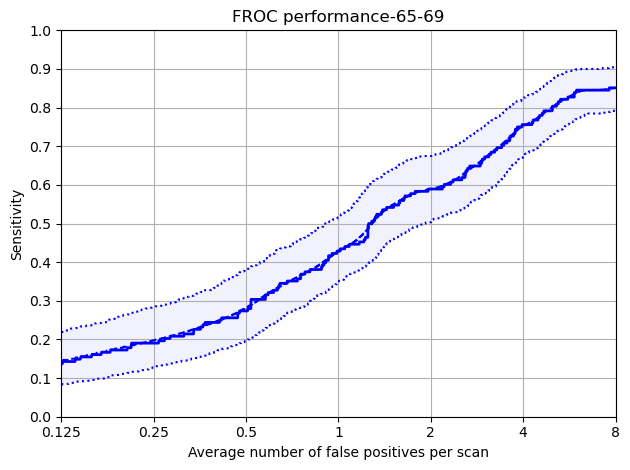

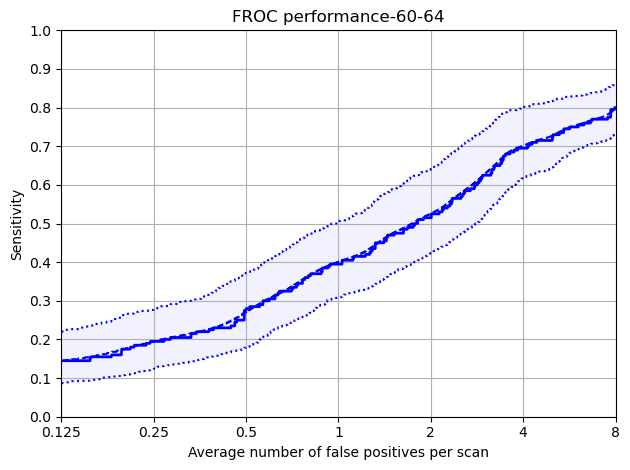

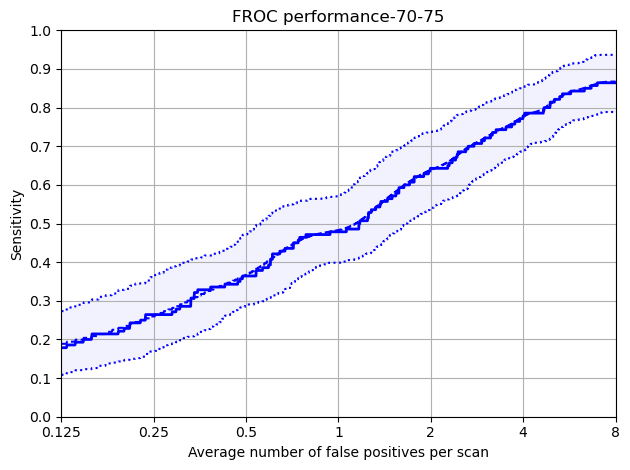

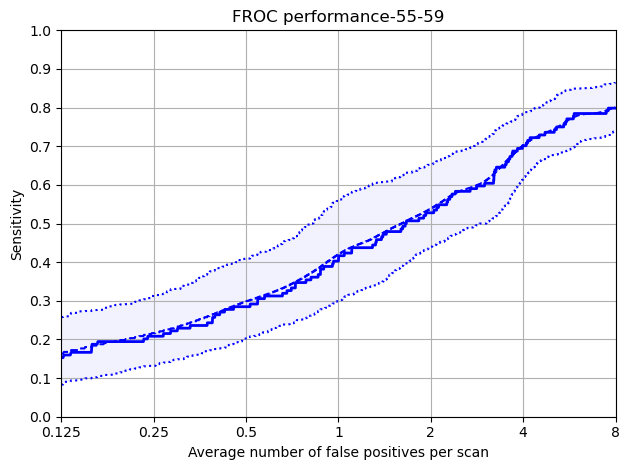

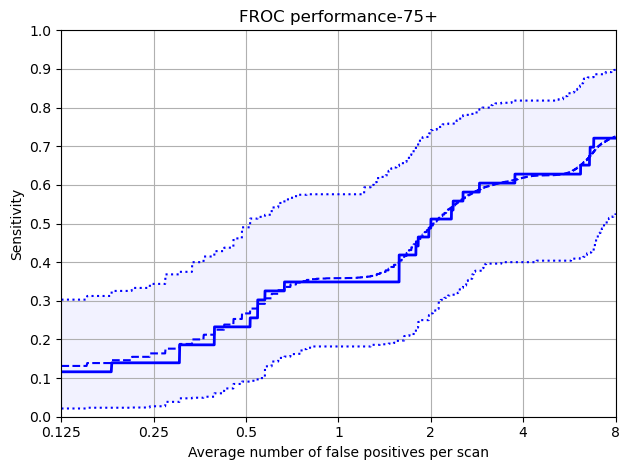

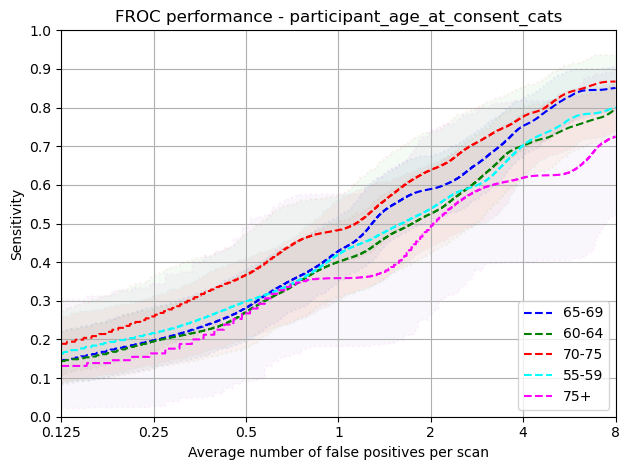

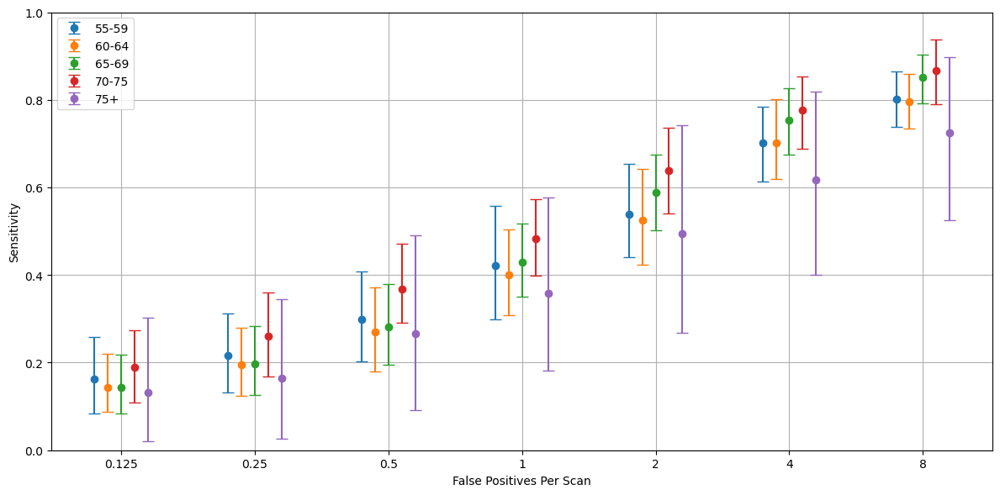

In [182]:
protected_group = 'participant_age_at_consent_cats'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour, 'Age', data_dict, ['55-59','60-64','65-69','70-75','75+'])

In [183]:
data_dict

{'65-69':        mean_sens  low_sens  high_sens
 fps                                  
 0.125      0.144     0.083      0.219
 0.250      0.198     0.127      0.284
 0.500      0.281     0.195      0.380
 1.000      0.430     0.351      0.518
 2.000      0.589     0.503      0.675
 4.000      0.753     0.674      0.826
 8.000      0.851     0.792      0.904,
 '60-64':        mean_sens  low_sens  high_sens
 fps                                  
 0.125      0.144     0.087      0.221
 0.250      0.196     0.124      0.280
 0.500      0.270     0.179      0.371
 1.000      0.401     0.309      0.504
 2.000      0.526     0.424      0.643
 4.000      0.702     0.619      0.802
 8.000      0.795     0.734      0.859,
 '70-75':        mean_sens  low_sens  high_sens
 fps                                  
 0.125      0.189     0.109      0.273
 0.250      0.260     0.169      0.361
 0.500      0.367     0.291      0.472
 1.000      0.483     0.399      0.573
 2.000      0.639     0.541      0.

### Ethnicity analysis

Protected Group: Black


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,26.0,63.0,2.0,5.0,4.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpjrt3xv5t/annotations.csv
Total number of included nodule annotations: 250
Total number of nodule annotations: 250
Cases: 199


100%|██████████| 1000/1000 [00:05<00:00, 194.89it/s]


,0,159,476,1111,2381,4920,9999
0,0.117 (0.069 - 0.186),0.173 (0.119 - 0.249),0.256 (0.192 - 0.342),0.382 (0.3 - 0.479),0.499 (0.415 - 0.597),0.69 (0.615 - 0.778),0.82 (0.765 - 0.874)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.117,0.069,0.186
159,0.250,0.173,0.119,0.249
476,0.500,0.256,0.192,0.342
1111,1.000,0.382,0.300,0.479
2381,2.000,0.499,0.415,0.597
4920,4.000,0.690,0.615,0.778
9999,8.000,0.820,0.765,0.874


Mean Sensitivity: 0.42 Low Sensitivity: 0.35 High Sensitivity: 0.501


,True positives,224
0,False positives,4395.000
1,False negatives,26.000
2,True negatives,0.000
3,Total number of candidates,4626.000
4,Total number of nodules,250.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,7.000
7,Sensitivity,0.896
8,Average number of candidates per scan,23.246


Protected Group: Asian or Asian British


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,52.0,3.0,10.0,5.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpm7fi_ny0/annotations.csv
Total number of included nodule annotations: 203
Total number of nodule annotations: 203
Cases: 196


100%|██████████| 1000/1000 [00:05<00:00, 198.96it/s]


,0,159,476,1111,2381,4920,9999
0,0.105 (0.057 - 0.172),0.186 (0.116 - 0.256),0.247 (0.176 - 0.328),0.366 (0.288 - 0.452),0.533 (0.451 - 0.612),0.7 (0.628 - 0.766),0.783 (0.709 - 0.845)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.105,0.057,0.172
159,0.250,0.186,0.116,0.256
476,0.500,0.247,0.176,0.328
1111,1.000,0.366,0.288,0.452
2381,2.000,0.533,0.451,0.612
4920,4.000,0.700,0.628,0.766
9999,8.000,0.783,0.709,0.845


Mean Sensitivity: 0.42 Low Sensitivity: 0.35 High Sensitivity: 0.49


,True positives,175
0,False positives,3882.000
1,False negatives,28.000
2,True negatives,0.000
3,Total number of candidates,4061.000
4,Total number of nodules,203.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,4.000
7,Sensitivity,0.862
8,Average number of candidates per scan,20.719


Protected Group: White


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,32.0,47.0,6.0,6.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp3vd371qh/annotations.csv
Total number of included nodule annotations: 242
Total number of nodule annotations: 242
Cases: 199
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: 380


100%|██████████| 1000/1000 [00:05<00:00, 191.49it/s]


,0,159,476,1111,2381,4920,9999
0,0.219 (0.161 - 0.282),0.261 (0.19 - 0.338),0.373 (0.294 - 0.448),0.497 (0.423 - 0.572),0.648 (0.573 - 0.712),0.768 (0.703 - 0.83),0.843 (0.792 - 0.891)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.219,0.161,0.282
159,0.250,0.261,0.190,0.338
476,0.500,0.373,0.294,0.448
1111,1.000,0.497,0.423,0.572
2381,2.000,0.648,0.573,0.712
4920,4.000,0.768,0.703,0.830
9999,8.000,0.843,0.792,0.891


Mean Sensitivity: 0.52 Low Sensitivity: 0.45 High Sensitivity: 0.582


,True positives,219
0,False positives,4237.000
1,False negatives,23.000
2,True negatives,0.000
3,Total number of candidates,4464.000
4,Total number of nodules,242.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,9.000
7,Sensitivity,0.905
8,Average number of candidates per scan,22.432


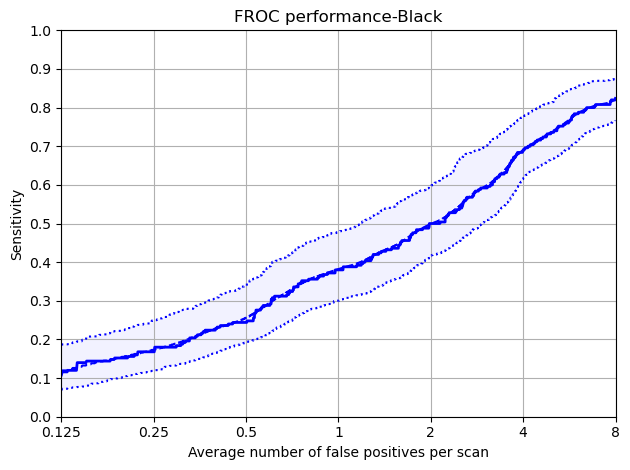

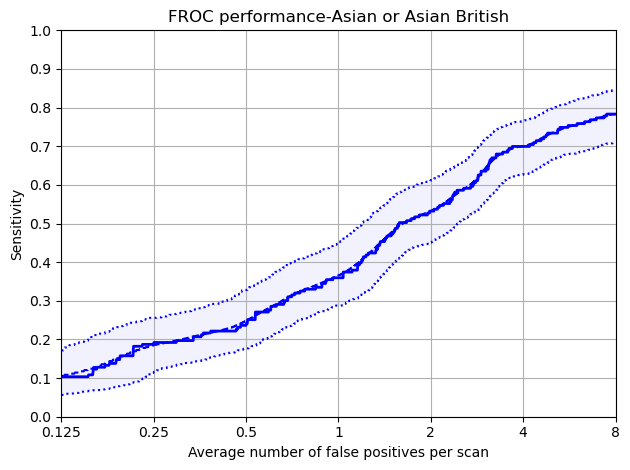

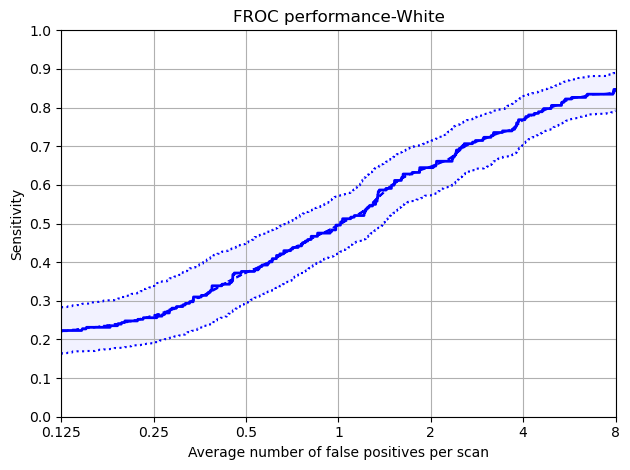

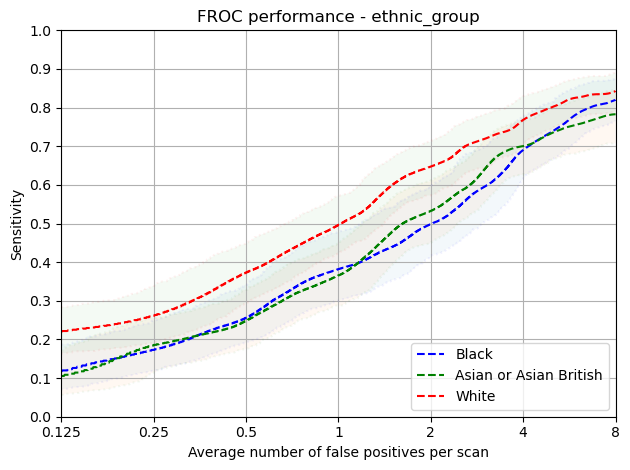

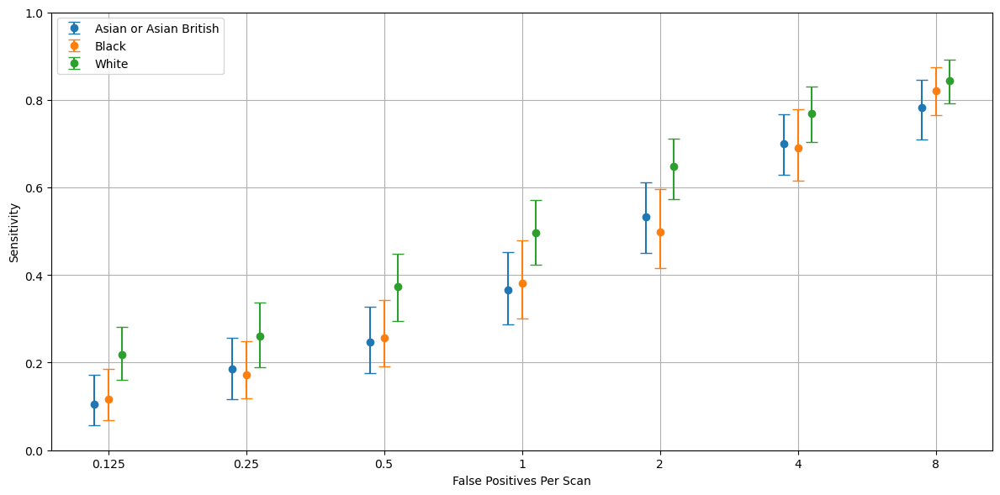

In [184]:
protected_group = 'ethnic_group'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour,'Ethnic Group', data_dict, order=['Asian or Asian British','Black','White'])

### IMDRank_tertile

Protected Group: Medium


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,24.0,63.0,3.0,7.0,3.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpnw0chxo4/annotations.csv
Total number of included nodule annotations: 235
Total number of nodule annotations: 235
Cases: 192
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: 380


100%|██████████| 1000/1000 [00:05<00:00, 181.67it/s]


,0,159,476,1111,2381,4920,9999
0,0.149 (0.097 - 0.222),0.209 (0.152 - 0.276),0.302 (0.224 - 0.387),0.424 (0.345 - 0.51),0.598 (0.52 - 0.675),0.736 (0.676 - 0.793),0.827 (0.769 - 0.88)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.149,0.097,0.222
159,0.250,0.209,0.152,0.276
476,0.500,0.302,0.224,0.387
1111,1.000,0.424,0.345,0.510
2381,2.000,0.598,0.520,0.675
4920,4.000,0.736,0.676,0.793
9999,8.000,0.827,0.769,0.880


Mean Sensitivity: 0.46 Low Sensitivity: 0.4 High Sensitivity: 0.535


,True positives,216
0,False positives,3860.000
1,False negatives,19.000
2,True negatives,0.000
3,Total number of candidates,4083.000
4,Total number of nodules,235.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,8.000
7,Sensitivity,0.919
8,Average number of candidates per scan,21.266


Protected Group: Low


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,55.0,4.0,5.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp6wv8_q1j/annotations.csv
Total number of included nodule annotations: 281
Total number of nodule annotations: 281
Cases: 246


100%|██████████| 1000/1000 [00:06<00:00, 155.04it/s]


,0,159,476,1111,2381,4920,9999
0,0.155 (0.103 - 0.22),0.216 (0.153 - 0.292),0.287 (0.217 - 0.37),0.419 (0.33 - 0.514),0.528 (0.44 - 0.623),0.698 (0.628 - 0.777),0.818 (0.77 - 0.865)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.155,0.103,0.220
159,0.250,0.216,0.153,0.292
476,0.500,0.287,0.217,0.370
1111,1.000,0.419,0.330,0.514
2381,2.000,0.528,0.440,0.623
4920,4.000,0.698,0.628,0.777
9999,8.000,0.818,0.770,0.865


Mean Sensitivity: 0.45 Low Sensitivity: 0.38 High Sensitivity: 0.523


,True positives,250
0,False positives,5162.000
1,False negatives,31.000
2,True negatives,0.000
3,Total number of candidates,5421.000
4,Total number of nodules,281.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,9.000
7,Sensitivity,0.890
8,Average number of candidates per scan,22.037


Protected Group: High


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,34.0,43.0,3.0,10.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp699w957w/annotations.csv
Total number of included nodule annotations: 175
Total number of nodule annotations: 175
Cases: 150


100%|██████████| 1000/1000 [00:04<00:00, 247.78it/s]


,0,159,476,1111,2381,4920,9999
0,0.152 (0.088 - 0.228),0.212 (0.136 - 0.293),0.292 (0.211 - 0.384),0.429 (0.35 - 0.51),0.559 (0.468 - 0.648),0.738 (0.663 - 0.814),0.818 (0.755 - 0.884)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.152,0.088,0.228
159,0.250,0.212,0.136,0.293
476,0.500,0.292,0.211,0.384
1111,1.000,0.429,0.350,0.510
2381,2.000,0.559,0.468,0.648
4920,4.000,0.738,0.663,0.814
9999,8.000,0.818,0.755,0.884


Mean Sensitivity: 0.46 Low Sensitivity: 0.38 High Sensitivity: 0.537


,True positives,150
0,False positives,3363.000
1,False negatives,25.000
2,True negatives,0.000
3,Total number of candidates,3516.000
4,Total number of nodules,175.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,3.000
7,Sensitivity,0.857
8,Average number of candidates per scan,23.440


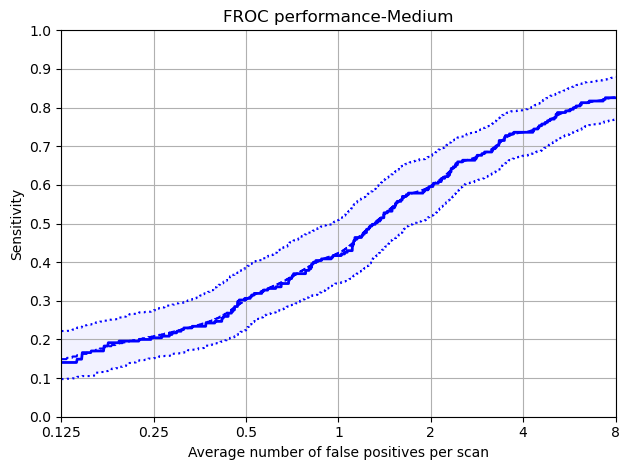

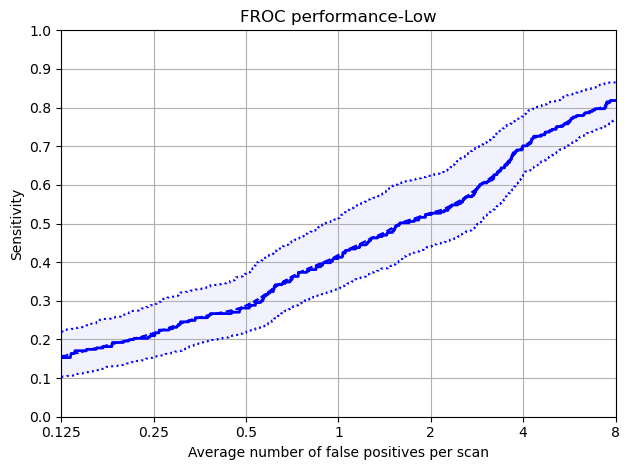

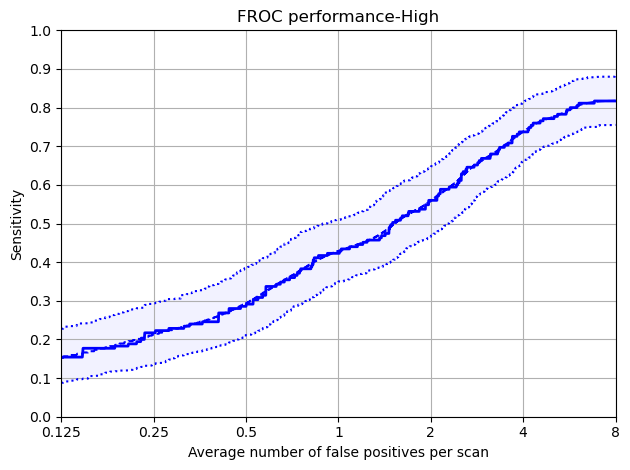

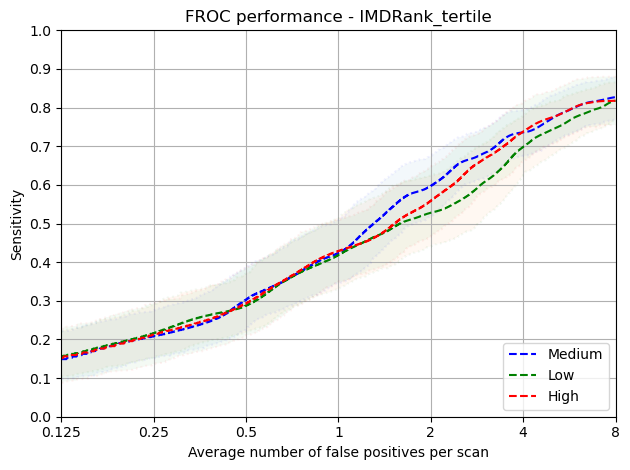

In [185]:
protected_group = 'IMDRank_tertile'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Smoking Pack Years


Protected Group: Low (15-35)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,54.0,2.0,6.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpsyk4n9jz/annotations.csv
Total number of included nodule annotations: 291
Total number of nodule annotations: 291
Cases: 250


100%|██████████| 1000/1000 [00:06<00:00, 155.30it/s]


,0,159,476,1111,2381,4920,9999
0,0.156 (0.107 - 0.221),0.204 (0.151 - 0.272),0.304 (0.24 - 0.373),0.399 (0.33 - 0.478),0.55 (0.47 - 0.639),0.722 (0.658 - 0.787),0.815 (0.77 - 0.859)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.156,0.107,0.221
159,0.250,0.204,0.151,0.272
476,0.500,0.304,0.240,0.373
1111,1.000,0.399,0.330,0.478
2381,2.000,0.550,0.470,0.639
4920,4.000,0.722,0.658,0.787
9999,8.000,0.815,0.770,0.859


Mean Sensitivity: 0.45 Low Sensitivity: 0.39 High Sensitivity: 0.518


,True positives,260
0,False positives,5241.000
1,False negatives,31.000
2,True negatives,0.000
3,Total number of candidates,5505.000
4,Total number of nodules,291.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,4.000
7,Sensitivity,0.893
8,Average number of candidates per scan,22.020


Protected Group: Medium (35-50)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,29.0,55.0,3.0,6.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpoytii7zv/annotations.csv
Total number of included nodule annotations: 217
Total number of nodule annotations: 217
Cases: 193
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: 380


100%|██████████| 1000/1000 [00:04<00:00, 206.98it/s]


,0,159,476,1111,2381,4920,9999
0,0.164 (0.099 - 0.242),0.224 (0.148 - 0.309),0.302 (0.214 - 0.41),0.446 (0.357 - 0.547),0.596 (0.51 - 0.687),0.719 (0.632 - 0.796),0.828 (0.76 - 0.892)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.164,0.099,0.242
159,0.250,0.224,0.148,0.309
476,0.500,0.302,0.214,0.410
1111,1.000,0.446,0.357,0.547
2381,2.000,0.596,0.510,0.687
4920,4.000,0.719,0.632,0.796
9999,8.000,0.828,0.760,0.892


Mean Sensitivity: 0.47 Low Sensitivity: 0.39 High Sensitivity: 0.555


,True positives,193
0,False positives,4058.000
1,False negatives,24.000
2,True negatives,0.000
3,Total number of candidates,4265.000
4,Total number of nodules,217.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,15.000
7,Sensitivity,0.889
8,Average number of candidates per scan,22.098


Protected Group: High (50+)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,28.0,53.0,6.0,9.0,4.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp0vrjazaa/annotations.csv
Total number of included nodule annotations: 187
Total number of nodule annotations: 187
Cases: 151


100%|██████████| 1000/1000 [00:03<00:00, 255.66it/s]


,0,159,476,1111,2381,4920,9999
0,0.129 (0.071 - 0.197),0.194 (0.116 - 0.29),0.274 (0.186 - 0.372),0.426 (0.327 - 0.542),0.553 (0.464 - 0.656),0.729 (0.657 - 0.803),0.809 (0.746 - 0.869)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.129,0.071,0.197
159,0.250,0.194,0.116,0.290
476,0.500,0.274,0.186,0.372
1111,1.000,0.426,0.327,0.542
2381,2.000,0.553,0.464,0.656
4920,4.000,0.729,0.657,0.803
9999,8.000,0.809,0.746,0.869


Mean Sensitivity: 0.44 Low Sensitivity: 0.37 High Sensitivity: 0.533


,True positives,165
0,False positives,3215.000
1,False negatives,22.000
2,True negatives,0.000
3,Total number of candidates,3381.000
4,Total number of nodules,187.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.882
8,Average number of candidates per scan,22.391


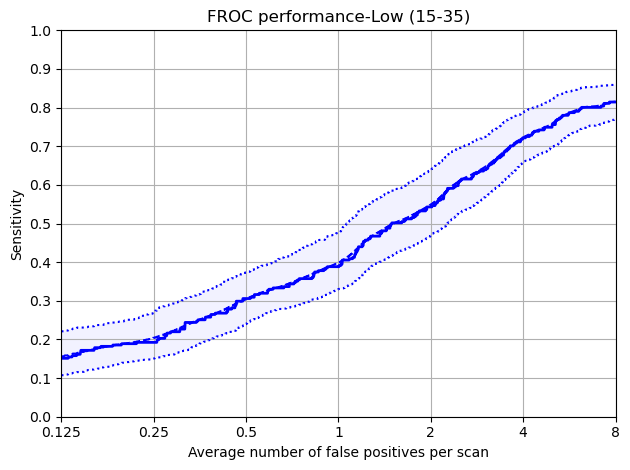

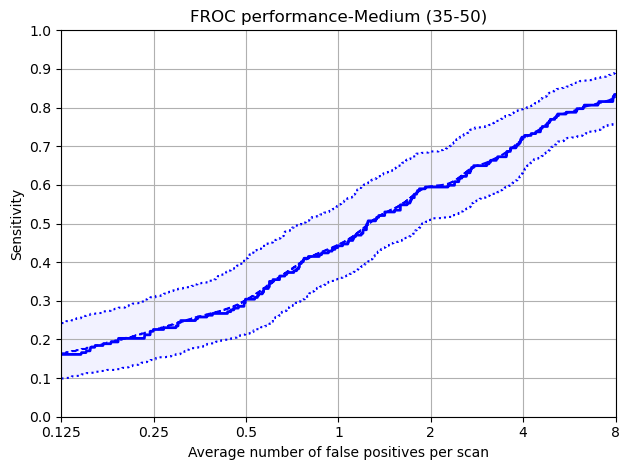

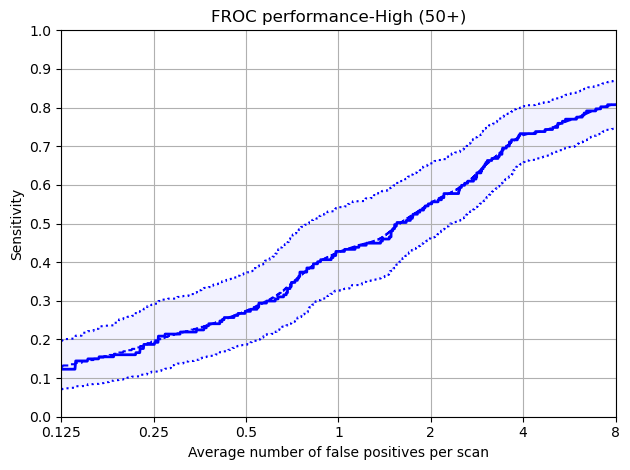

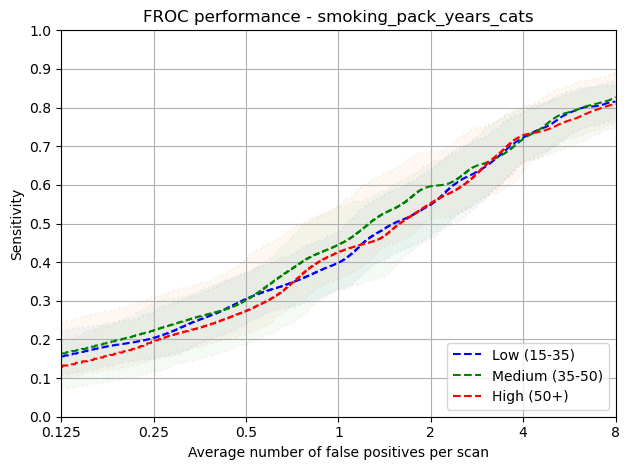

In [186]:
protected_group = 'smoking_pack_years_cats'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Vs Non-Actionable

Protected Group: Non-Actionable


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,17.0,81.0,2.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp83rbiylm/annotations.csv
Total number of included nodule annotations: 254
Total number of nodule annotations: 254
Cases: 421
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: 380


100%|██████████| 1000/1000 [00:10<00:00, 95.57it/s]


,0,159,476,1111,2381,4920,9999
0,0.156 (0.104 - 0.21),0.22 (0.163 - 0.277),0.316 (0.252 - 0.386),0.492 (0.426 - 0.557),0.673 (0.605 - 0.732),0.801 (0.742 - 0.852),0.889 (0.847 - 0.926)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.156,0.104,0.210
159,0.250,0.220,0.163,0.277
476,0.500,0.316,0.252,0.386
1111,1.000,0.492,0.426,0.557
2381,2.000,0.673,0.605,0.732
4920,4.000,0.801,0.742,0.852
9999,8.000,0.889,0.847,0.926


Mean Sensitivity: 0.51 Low Sensitivity: 0.45 High Sensitivity: 0.563


,True positives,238
0,False positives,8630.000
1,False negatives,16.000
2,True negatives,0.000
3,Total number of candidates,8867.000
4,Total number of nodules,254.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.937
8,Average number of candidates per scan,21.062


Protected Group: Actonable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,36.0,39.0,6.0,10.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp4izuaouu/annotations.csv
Total number of included nodule annotations: 441
Total number of nodule annotations: 441
Cases: 172


100%|██████████| 1000/1000 [00:04<00:00, 206.58it/s]


,0,159,476,1111,2381,4920,9999
0,0.139 (0.095 - 0.194),0.187 (0.132 - 0.246),0.267 (0.205 - 0.338),0.366 (0.306 - 0.435),0.491 (0.425 - 0.563),0.655 (0.587 - 0.721),0.766 (0.721 - 0.812)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.139,0.095,0.194
159,0.250,0.187,0.132,0.246
476,0.500,0.267,0.205,0.338
1111,1.000,0.366,0.306,0.435
2381,2.000,0.491,0.425,0.563
4920,4.000,0.655,0.587,0.721
9999,8.000,0.766,0.721,0.812


Mean Sensitivity: 0.41 Low Sensitivity: 0.35 High Sensitivity: 0.473


,True positives,380
0,False positives,3884.000
1,False negatives,61.000
2,True negatives,0.000
3,Total number of candidates,4284.000
4,Total number of nodules,441.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,20.000
7,Sensitivity,0.862
8,Average number of candidates per scan,24.907


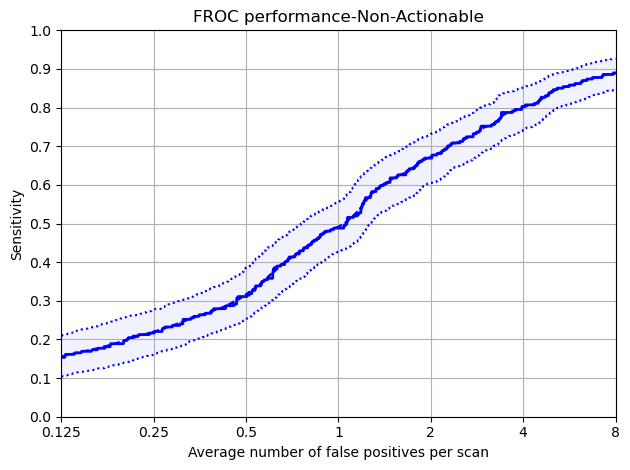

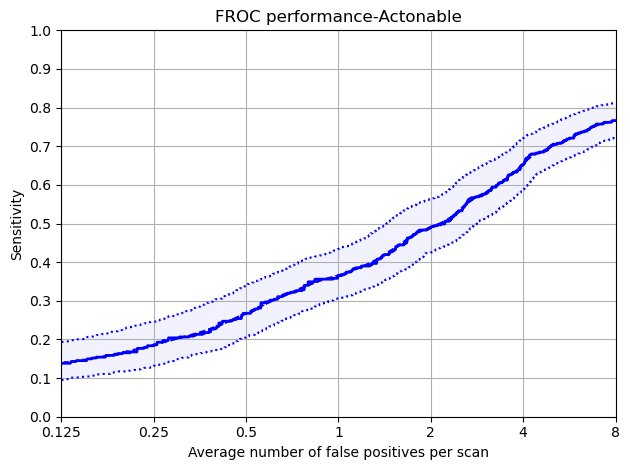

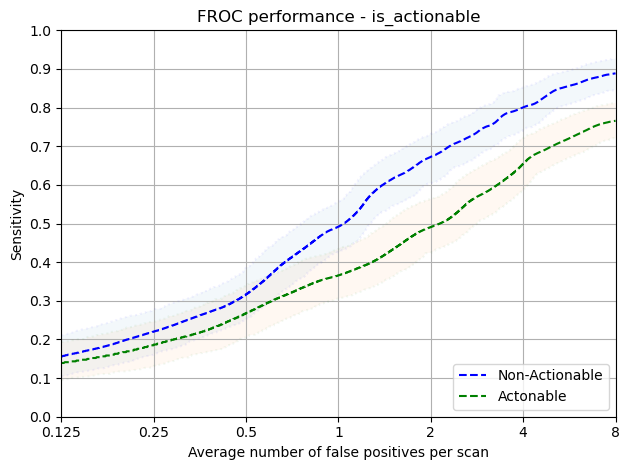

In [187]:
protected_group = 'is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable-Gender Splits

Protected Group: Male


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,37.0,43.0,3.0,10.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp5vsjoj2j/annotations.csv
Total number of included nodule annotations: 263
Total number of nodule annotations: 263
Cases: 92


100%|██████████| 1000/1000 [00:02<00:00, 345.53it/s]


,0,159,476,1111,2381,4920,9999
0,0.121 (0.065 - 0.189),0.167 (0.103 - 0.256),0.232 (0.161 - 0.322),0.319 (0.245 - 0.407),0.434 (0.338 - 0.529),0.605 (0.5 - 0.698),0.77 (0.701 - 0.829)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.121,0.065,0.189
159,0.250,0.167,0.103,0.256
476,0.500,0.232,0.161,0.322
1111,1.000,0.319,0.245,0.407
2381,2.000,0.434,0.338,0.529
4920,4.000,0.605,0.500,0.698
9999,8.000,0.770,0.701,0.829


Mean Sensitivity: 0.38 Low Sensitivity: 0.3 High Sensitivity: 0.461


,True positives,230
0,False positives,2342.000
1,False negatives,33.000
2,True negatives,0.000
3,Total number of candidates,2584.000
4,Total number of nodules,263.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,12.000
7,Sensitivity,0.875
8,Average number of candidates per scan,28.087


Protected Group: Female


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,35.0,32.0,9.0,10.0,14.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpl30g7mz_/annotations.csv
Total number of included nodule annotations: 178
Total number of nodule annotations: 178
Cases: 81


100%|██████████| 1000/1000 [00:02<00:00, 467.34it/s]


,0,159,476,1111,2381,4920,9999
0,0.175 (0.112 - 0.25),0.224 (0.149 - 0.312),0.333 (0.242 - 0.432),0.451 (0.359 - 0.55),0.582 (0.484 - 0.683),0.705 (0.633 - 0.779),0.773 (0.711 - 0.834)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.175,0.112,0.250
159,0.250,0.224,0.149,0.312
476,0.500,0.333,0.242,0.432
1111,1.000,0.451,0.359,0.550
2381,2.000,0.582,0.484,0.683
4920,4.000,0.705,0.633,0.779
9999,8.000,0.773,0.711,0.834


Mean Sensitivity: 0.46 Low Sensitivity: 0.38 High Sensitivity: 0.549


,True positives,150
0,False positives,1542.000
1,False negatives,28.000
2,True negatives,0.000
3,Total number of candidates,1700.000
4,Total number of nodules,178.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,8.000
7,Sensitivity,0.843
8,Average number of candidates per scan,20.988


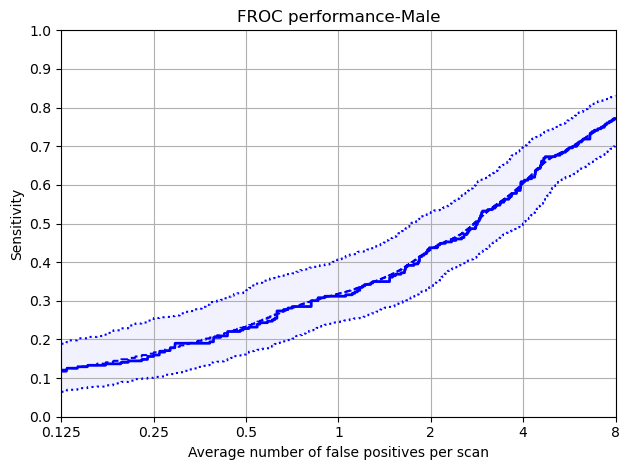

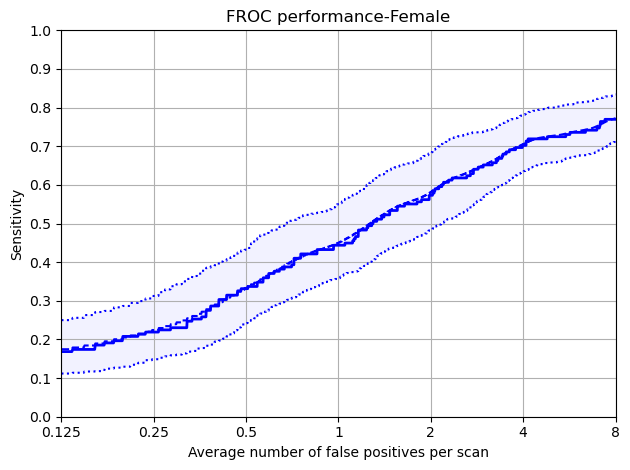

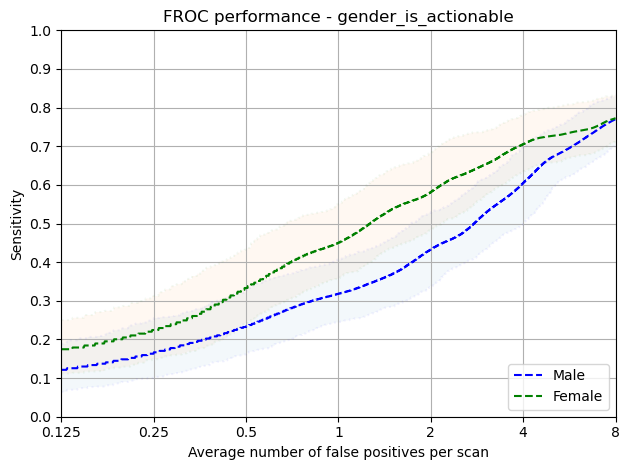

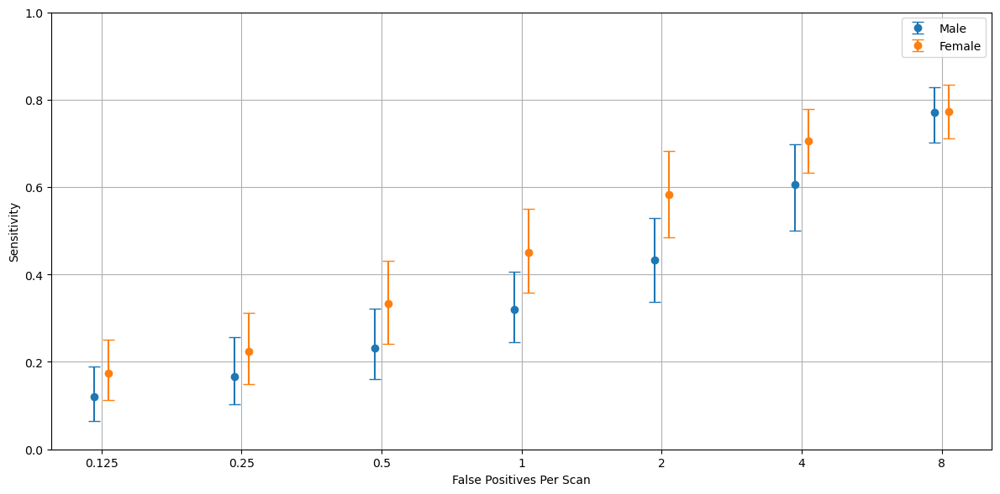

In [188]:
protected_group = 'gender_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour, 'Actionable, Gender', data_dict)

### NonActionable-Gender

Protected Group: Male


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,18.0,81.0,1.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpz6a73mfx/annotations.csv
Total number of included nodule annotations: 133
Total number of nodule annotations: 133
Cases: 251


100%|██████████| 1000/1000 [00:06<00:00, 156.39it/s]


,0,159,476,1111,2381,4920,9999
0,0.143 (0.075 - 0.233),0.223 (0.143 - 0.315),0.313 (0.239 - 0.392),0.539 (0.451 - 0.628),0.707 (0.619 - 0.786),0.829 (0.757 - 0.9),0.908 (0.862 - 0.954)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.143,0.075,0.233
159,0.250,0.223,0.143,0.315
476,0.500,0.313,0.239,0.392
1111,1.000,0.539,0.451,0.628
2381,2.000,0.707,0.619,0.786
4920,4.000,0.829,0.757,0.900
9999,8.000,0.908,0.862,0.954


Mean Sensitivity: 0.52 Low Sensitivity: 0.45 High Sensitivity: 0.601


,True positives,126
0,False positives,5546.000
1,False negatives,7.000
2,True negatives,0.000
3,Total number of candidates,5672.000
4,Total number of nodules,133.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.947
8,Average number of candidates per scan,22.598


Protected Group: Female


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,16.0,82.0,2.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpepf_ykd9/annotations.csv
Total number of included nodule annotations: 121
Total number of nodule annotations: 121
Cases: 171
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: 380


100%|██████████| 1000/1000 [00:03<00:00, 265.87it/s]


,0,159,476,1111,2381,4920,9999
0,0.162 (0.092 - 0.245),0.223 (0.14 - 0.314),0.335 (0.248 - 0.422),0.463 (0.36 - 0.573),0.637 (0.539 - 0.736),0.766 (0.677 - 0.855),0.873 (0.802 - 0.936)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.162,0.092,0.245
159,0.250,0.223,0.140,0.314
476,0.500,0.335,0.248,0.422
1111,1.000,0.463,0.360,0.573
2381,2.000,0.637,0.539,0.736
4920,4.000,0.766,0.677,0.855
9999,8.000,0.873,0.802,0.936


Mean Sensitivity: 0.49 Low Sensitivity: 0.41 High Sensitivity: 0.583


,True positives,112
0,False positives,3084.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,3195.000
4,Total number of nodules,121.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.926
8,Average number of candidates per scan,18.684


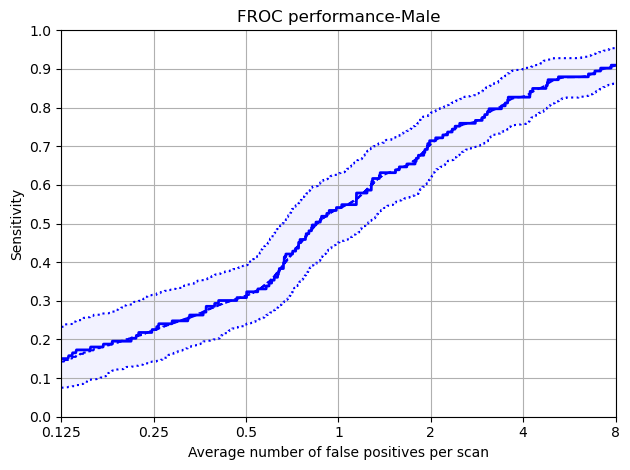

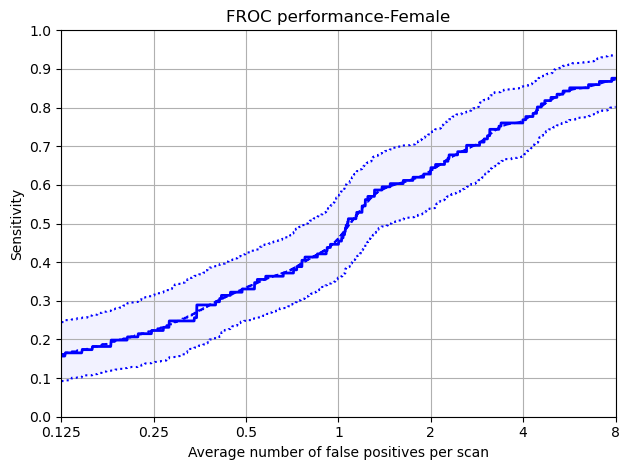

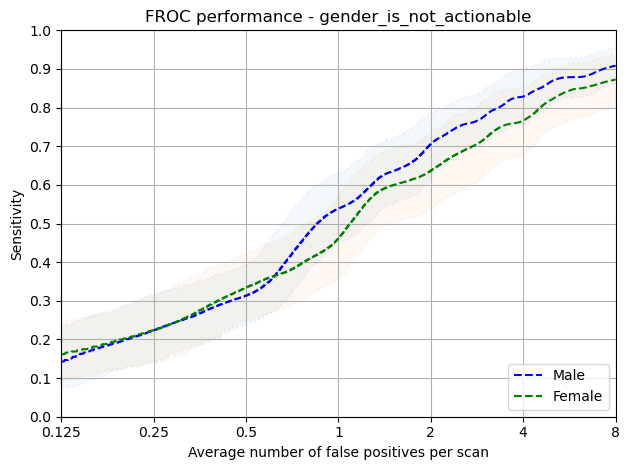

In [189]:
protected_group = 'gender_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Ethnic Group

Protected Group: Asian or Asian British


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,33.0,39.0,5.0,15.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpiql2kao3/annotations.csv
Total number of included nodule annotations: 130
Total number of nodule annotations: 130
Cases: 59


100%|██████████| 1000/1000 [00:02<00:00, 498.80it/s]


,0,159,476,1111,2381,4920,9999
0,0.101 (0.04 - 0.178),0.129 (0.056 - 0.243),0.211 (0.107 - 0.327),0.31 (0.215 - 0.426),0.45 (0.352 - 0.561),0.624 (0.518 - 0.713),0.719 (0.604 - 0.804)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.101,0.040,0.178
159,0.250,0.129,0.056,0.243
476,0.500,0.211,0.107,0.327
1111,1.000,0.310,0.215,0.426
2381,2.000,0.450,0.352,0.561
4920,4.000,0.624,0.518,0.713
9999,8.000,0.719,0.604,0.804


Mean Sensitivity: 0.36 Low Sensitivity: 0.27 High Sensitivity: 0.465


,True positives,104
0,False positives,1399.000
1,False negatives,26.000
2,True negatives,0.000
3,Total number of candidates,1507.000
4,Total number of nodules,130.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,4.000
7,Sensitivity,0.800
8,Average number of candidates per scan,25.542


Protected Group: Black


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,34.0,50.0,2.0,7.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp96wdyt5k/annotations.csv
Total number of included nodule annotations: 161
Total number of nodule annotations: 161
Cases: 52


100%|██████████| 1000/1000 [00:01<00:00, 546.83it/s]


,0,159,476,1111,2381,4920,9999
0,0.106 (0.061 - 0.17),0.145 (0.084 - 0.239),0.216 (0.135 - 0.338),0.3 (0.215 - 0.42),0.404 (0.298 - 0.535),0.617 (0.475 - 0.754),0.77 (0.685 - 0.861)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.106,0.061,0.170
159,0.250,0.145,0.084,0.239
476,0.500,0.216,0.135,0.338
1111,1.000,0.300,0.215,0.420
2381,2.000,0.404,0.298,0.535
4920,4.000,0.617,0.475,0.754
9999,8.000,0.770,0.685,0.861


Mean Sensitivity: 0.37 Low Sensitivity: 0.28 High Sensitivity: 0.474


,True positives,143
0,False positives,1144.000
1,False negatives,18.000
2,True negatives,0.000
3,Total number of candidates,1294.000
4,Total number of nodules,161.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,7.000
7,Sensitivity,0.888
8,Average number of candidates per scan,24.885


Protected Group: White


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,42.0,25.0,10.0,9.0,14.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpnxf3oc66/annotations.csv
Total number of included nodule annotations: 150
Total number of nodule annotations: 150
Cases: 63


100%|██████████| 1000/1000 [00:01<00:00, 522.97it/s]


,0,159,476,1111,2381,4920,9999
0,0.251 (0.161 - 0.348),0.307 (0.207 - 0.42),0.391 (0.285 - 0.497),0.507 (0.415 - 0.611),0.635 (0.545 - 0.73),0.742 (0.656 - 0.819),0.811 (0.746 - 0.87)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.251,0.161,0.348
159,0.250,0.307,0.207,0.420
476,0.500,0.391,0.285,0.497
1111,1.000,0.507,0.415,0.611
2381,2.000,0.635,0.545,0.730
4920,4.000,0.742,0.656,0.819
9999,8.000,0.811,0.746,0.870


Mean Sensitivity: 0.52 Low Sensitivity: 0.43 High Sensitivity: 0.614


,True positives,133
0,False positives,1341.000
1,False negatives,17.000
2,True negatives,0.000
3,Total number of candidates,1483.000
4,Total number of nodules,150.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,9.000
7,Sensitivity,0.887
8,Average number of candidates per scan,23.540


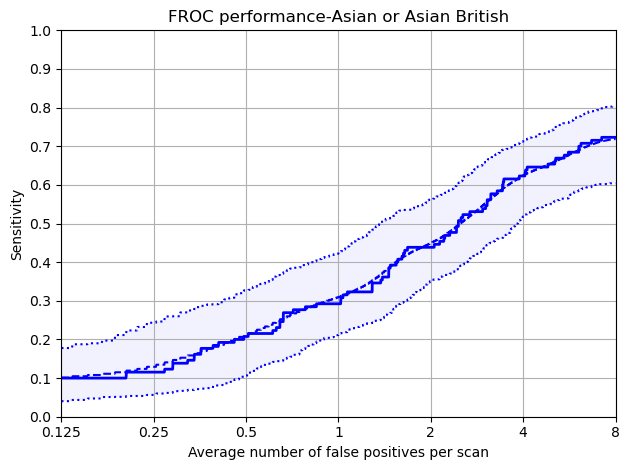

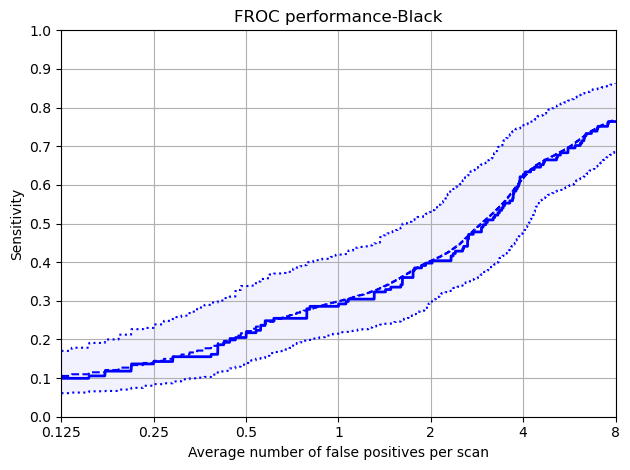

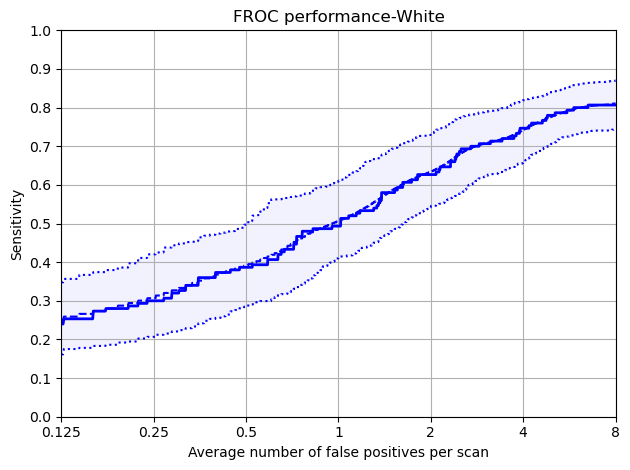

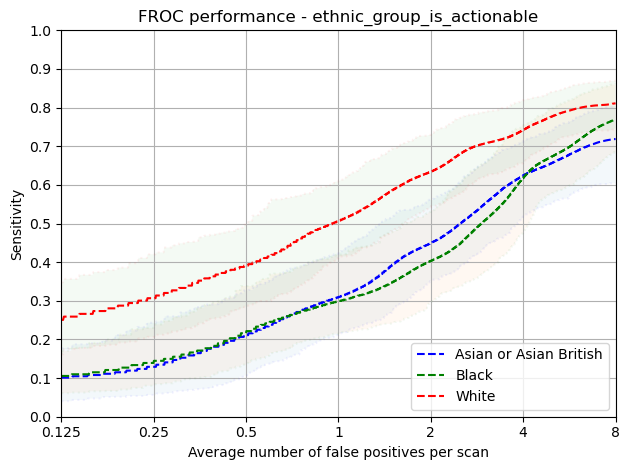

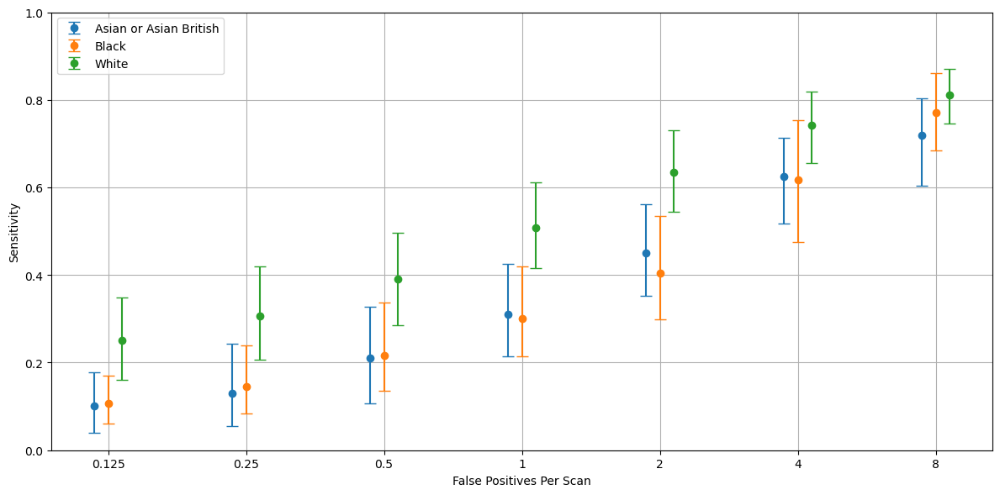

In [190]:
protected_group = 'ethnic_group_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('grt123', flavour, 'Actionable, Ethnic Group', data_dict, order=['Asian or Asian British','Black','White'])

### NonActionable Ethnic Group

Protected Group: Black


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,13.0,85.0,1.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpe9tos8cv/annotations.csv
Total number of included nodule annotations: 89
Total number of nodule annotations: 89
Cases: 148


100%|██████████| 1000/1000 [00:03<00:00, 261.30it/s]


,0,159,476,1111,2381,4920,9999
0,0.151 (0.04 - 0.283),0.238 (0.13 - 0.353),0.319 (0.198 - 0.463),0.538 (0.421 - 0.66),0.676 (0.578 - 0.771),0.793 (0.699 - 0.889),0.888 (0.826 - 0.944)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.151,0.040,0.283
159,0.250,0.238,0.130,0.353
476,0.500,0.319,0.198,0.463
1111,1.000,0.538,0.421,0.660
2381,2.000,0.676,0.578,0.771
4920,4.000,0.793,0.699,0.889
9999,8.000,0.888,0.826,0.944


Mean Sensitivity: 0.51 Low Sensitivity: 0.41 High Sensitivity: 0.623


,True positives,81
0,False positives,3251.000
1,False negatives,8.000
2,True negatives,0.000
3,Total number of candidates,3332.000
4,Total number of nodules,89.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.910
8,Average number of candidates per scan,22.514


Protected Group: Asian or Asian British


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,23.0,75.0,1.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpx83kmgk3/annotations.csv
Total number of included nodule annotations: 73
Total number of nodule annotations: 73
Cases: 138


100%|██████████| 1000/1000 [00:03<00:00, 328.67it/s]


,0,159,476,1111,2381,4920,9999
0,0.144 (0.043 - 0.263),0.204 (0.116 - 0.299),0.28 (0.179 - 0.4),0.467 (0.341 - 0.607),0.681 (0.552 - 0.8),0.799 (0.676 - 0.906),0.883 (0.786 - 0.963)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.144,0.043,0.263
159,0.250,0.204,0.116,0.299
476,0.500,0.280,0.179,0.400
1111,1.000,0.467,0.341,0.607
2381,2.000,0.681,0.552,0.800
4920,4.000,0.799,0.676,0.906
9999,8.000,0.883,0.786,0.963


Mean Sensitivity: 0.49 Low Sensitivity: 0.38 High Sensitivity: 0.605


,True positives,71
0,False positives,2483.000
1,False negatives,2.000
2,True negatives,0.000
3,Total number of candidates,2554.000
4,Total number of nodules,73.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.973
8,Average number of candidates per scan,18.507


Protected Group: White


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,15.0,83.0,2.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpuxfms1ja/annotations.csv
Total number of included nodule annotations: 92
Total number of nodule annotations: 92
Cases: 137
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: 380


100%|██████████| 1000/1000 [00:03<00:00, 277.36it/s]


,0,159,476,1111,2381,4920,9999
0,0.187 (0.114 - 0.267),0.216 (0.136 - 0.314),0.356 (0.235 - 0.467),0.487 (0.392 - 0.584),0.676 (0.571 - 0.777),0.807 (0.716 - 0.892),0.892 (0.825 - 0.953)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.187,0.114,0.267
159,0.250,0.216,0.136,0.314
476,0.500,0.356,0.235,0.467
1111,1.000,0.487,0.392,0.584
2381,2.000,0.676,0.571,0.777
4920,4.000,0.807,0.716,0.892
9999,8.000,0.892,0.825,0.953


Mean Sensitivity: 0.52 Low Sensitivity: 0.43 High Sensitivity: 0.608


,True positives,86
0,False positives,2896.000
1,False negatives,6.000
2,True negatives,0.000
3,Total number of candidates,2981.000
4,Total number of nodules,92.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.935
8,Average number of candidates per scan,21.759


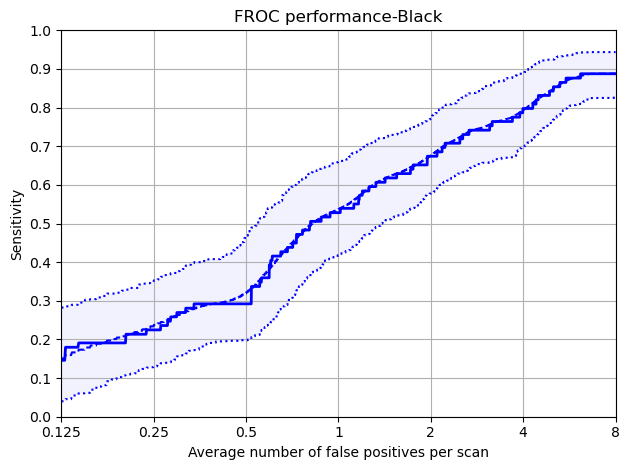

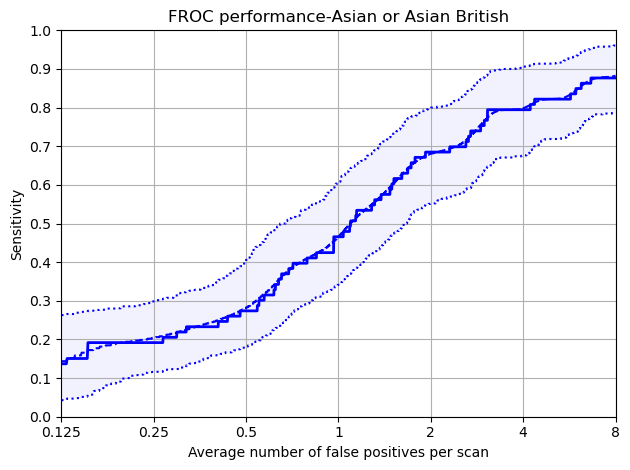

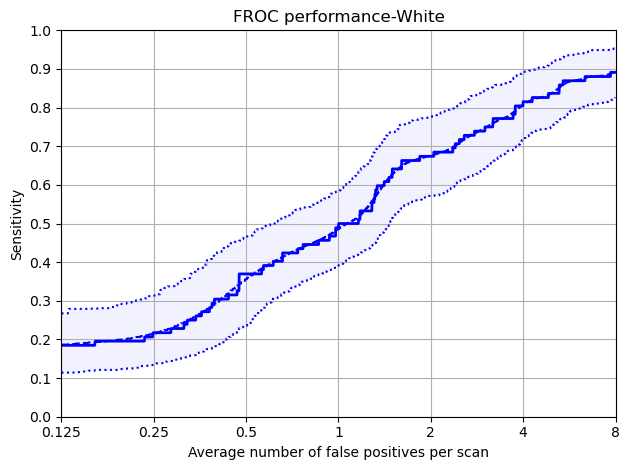

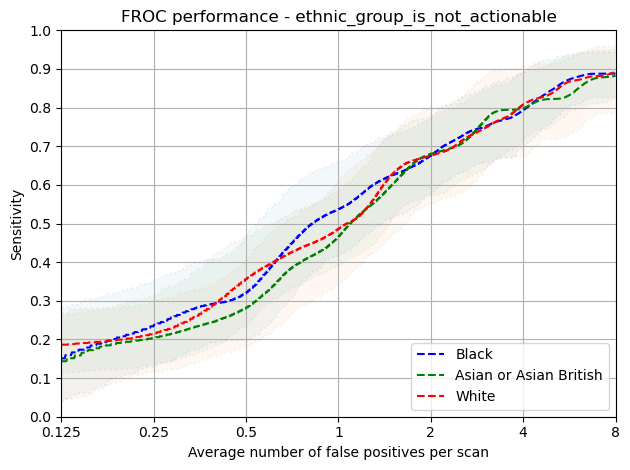

In [191]:
protected_group = 'ethnic_group_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable IMDRank

Protected Group: High_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,43.0,22.0,5.0,15.0,14.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpq1yib1_p/annotations.csv
Total number of included nodule annotations: 111
Total number of nodule annotations: 111
Cases: 54


100%|██████████| 1000/1000 [00:01<00:00, 508.31it/s]


,0,159,476,1111,2381,4920,9999
0,0.175 (0.08 - 0.294),0.235 (0.13 - 0.35),0.304 (0.191 - 0.413),0.384 (0.278 - 0.488),0.502 (0.363 - 0.64),0.668 (0.553 - 0.769),0.764 (0.663 - 0.856)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.175,0.080,0.294
159,0.250,0.235,0.130,0.350
476,0.500,0.304,0.191,0.413
1111,1.000,0.384,0.278,0.488
2381,2.000,0.502,0.363,0.640
4920,4.000,0.668,0.553,0.769
9999,8.000,0.764,0.663,0.856


Mean Sensitivity: 0.43 Low Sensitivity: 0.32 High Sensitivity: 0.544


,True positives,90
0,False positives,1343.000
1,False negatives,21.000
2,True negatives,0.000
3,Total number of candidates,1436.000
4,Total number of nodules,111.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,3.000
7,Sensitivity,0.811
8,Average number of candidates per scan,26.593


Protected Group: Medium_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,32.0,43.0,7.0,12.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpikjh60_m/annotations.csv
Total number of included nodule annotations: 121
Total number of nodule annotations: 121
Cases: 49


100%|██████████| 1000/1000 [00:01<00:00, 634.27it/s]


,0,159,476,1111,2381,4920,9999
0,0.124 (0.05 - 0.239),0.179 (0.084 - 0.3),0.255 (0.145 - 0.402),0.376 (0.265 - 0.516),0.527 (0.425 - 0.644),0.693 (0.609 - 0.771),0.768 (0.682 - 0.845)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.124,0.050,0.239
159,0.250,0.179,0.084,0.300
476,0.500,0.255,0.145,0.402
1111,1.000,0.376,0.265,0.516
2381,2.000,0.527,0.425,0.644
4920,4.000,0.693,0.609,0.771
9999,8.000,0.768,0.682,0.845


Mean Sensitivity: 0.42 Low Sensitivity: 0.32 High Sensitivity: 0.531


,True positives,108
0,False positives,1042.000
1,False negatives,13.000
2,True negatives,0.000
3,Total number of candidates,1158.000
4,Total number of nodules,121.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,8.000
7,Sensitivity,0.893
8,Average number of candidates per scan,23.633


Protected Group: Low_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,35.0,46.0,5.0,5.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmphe0l05wf/annotations.csv
Total number of included nodule annotations: 206
Total number of nodule annotations: 206
Cases: 69


100%|██████████| 1000/1000 [00:02<00:00, 468.33it/s]


,0,159,476,1111,2381,4920,9999
0,0.144 (0.088 - 0.215),0.188 (0.114 - 0.282),0.282 (0.187 - 0.394),0.384 (0.292 - 0.497),0.477 (0.378 - 0.593),0.651 (0.531 - 0.759),0.782 (0.716 - 0.852)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.144,0.088,0.215
159,0.250,0.188,0.114,0.282
476,0.500,0.282,0.187,0.394
1111,1.000,0.384,0.292,0.497
2381,2.000,0.477,0.378,0.593
4920,4.000,0.651,0.531,0.759
9999,8.000,0.782,0.716,0.852


Mean Sensitivity: 0.42 Low Sensitivity: 0.33 High Sensitivity: 0.513


,True positives,181
0,False positives,1456.000
1,False negatives,25.000
2,True negatives,0.000
3,Total number of candidates,1646.000
4,Total number of nodules,206.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,9.000
7,Sensitivity,0.879
8,Average number of candidates per scan,23.855


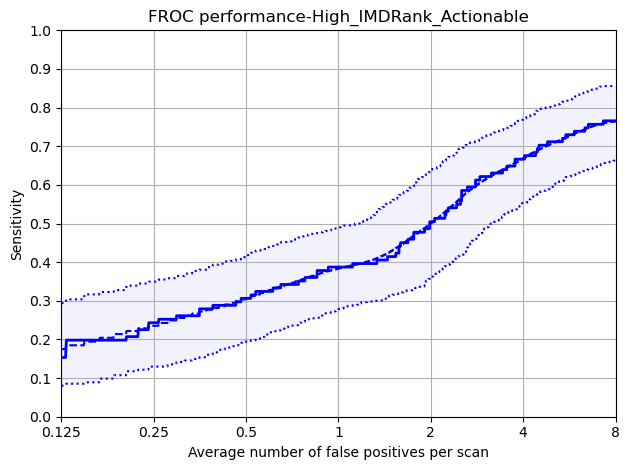

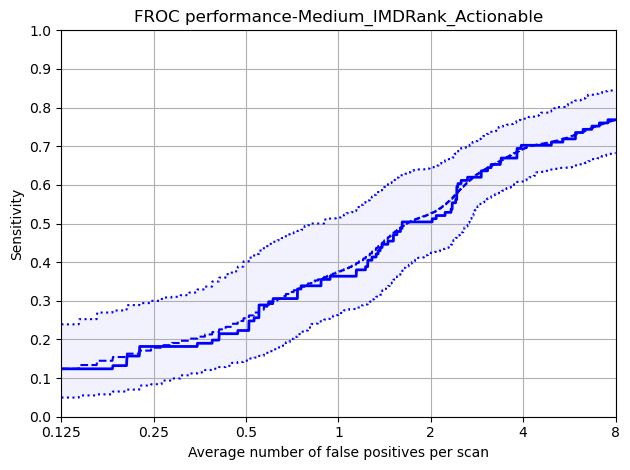

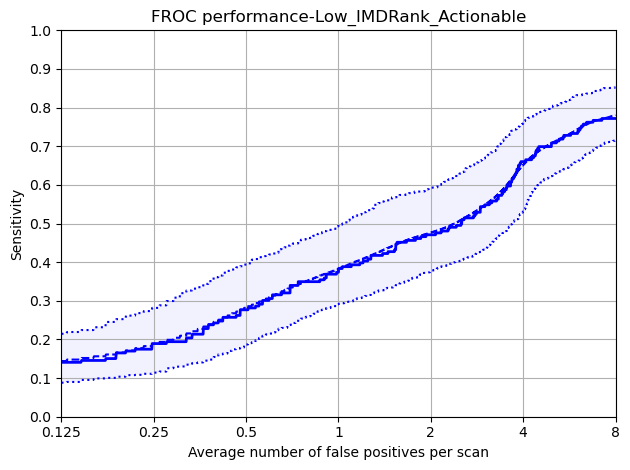

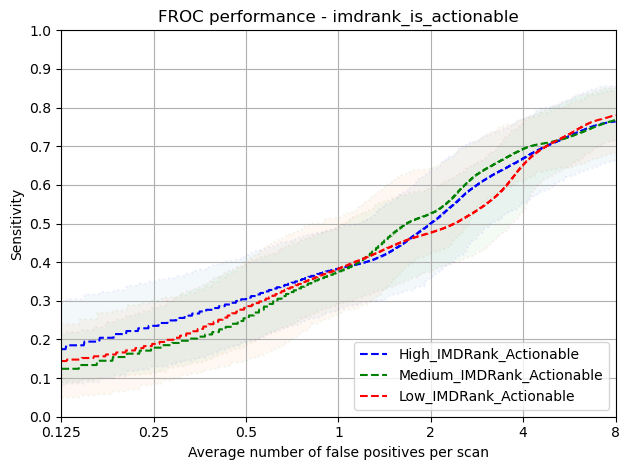

In [192]:
protected_group = 'imdrank_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Smoking Status

Protected Group: Low_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,38.0,38.0,4.0,9.0,11.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpcpnsshsu/annotations.csv
Total number of included nodule annotations: 181
Total number of nodule annotations: 181
Cases: 71


100%|██████████| 1000/1000 [00:02<00:00, 474.30it/s]


,0,159,476,1111,2381,4920,9999
0,0.136 (0.081 - 0.211),0.171 (0.105 - 0.265),0.278 (0.165 - 0.395),0.349 (0.264 - 0.453),0.476 (0.364 - 0.605),0.645 (0.544 - 0.742),0.753 (0.688 - 0.82)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.136,0.081,0.211
159,0.250,0.171,0.105,0.265
476,0.500,0.278,0.165,0.395
1111,1.000,0.349,0.264,0.453
2381,2.000,0.476,0.364,0.605
4920,4.000,0.645,0.544,0.742
9999,8.000,0.753,0.688,0.820


Mean Sensitivity: 0.4 Low Sensitivity: 0.32 High Sensitivity: 0.499


,True positives,158
0,False positives,1554.000
1,False negatives,23.000
2,True negatives,0.000
3,Total number of candidates,1716.000
4,Total number of nodules,181.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,4.000
7,Sensitivity,0.873
8,Average number of candidates per scan,24.169


Protected Group: High_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,34.0,39.0,9.0,13.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp8f7tqlux/annotations.csv
Total number of included nodule annotations: 127
Total number of nodule annotations: 127
Cases: 50


100%|██████████| 1000/1000 [00:01<00:00, 551.84it/s]


,0,159,476,1111,2381,4920,9999
0,0.173 (0.087 - 0.296),0.23 (0.129 - 0.369),0.301 (0.179 - 0.444),0.411 (0.286 - 0.542),0.509 (0.395 - 0.637),0.671 (0.566 - 0.769),0.76 (0.671 - 0.844)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.173,0.087,0.296
159,0.250,0.230,0.129,0.369
476,0.500,0.301,0.179,0.444
1111,1.000,0.411,0.286,0.542
2381,2.000,0.509,0.395,0.637
4920,4.000,0.671,0.566,0.769
9999,8.000,0.760,0.671,0.844


Mean Sensitivity: 0.44 Low Sensitivity: 0.33 High Sensitivity: 0.557


,True positives,107
0,False positives,1229.000
1,False negatives,20.000
2,True negatives,0.000
3,Total number of candidates,1337.000
4,Total number of nodules,127.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.843
8,Average number of candidates per scan,26.740


Protected Group: Medium_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,36.0,38.0,5.0,10.0,11.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpnh1__51m/annotations.csv
Total number of included nodule annotations: 133
Total number of nodule annotations: 133
Cases: 53


100%|██████████| 1000/1000 [00:01<00:00, 629.21it/s]


,0,159,476,1111,2381,4920,9999
0,0.13 (0.055 - 0.226),0.184 (0.093 - 0.294),0.258 (0.155 - 0.374),0.373 (0.261 - 0.5),0.517 (0.377 - 0.645),0.673 (0.532 - 0.776),0.802 (0.713 - 0.881)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.130,0.055,0.226
159,0.250,0.184,0.093,0.294
476,0.500,0.258,0.155,0.374
1111,1.000,0.373,0.261,0.500
2381,2.000,0.517,0.377,0.645
4920,4.000,0.673,0.532,0.776
9999,8.000,0.802,0.713,0.881


Mean Sensitivity: 0.42 Low Sensitivity: 0.31 High Sensitivity: 0.528


,True positives,115
0,False positives,1101.000
1,False negatives,18.000
2,True negatives,0.000
3,Total number of candidates,1231.000
4,Total number of nodules,133.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,15.000
7,Sensitivity,0.865
8,Average number of candidates per scan,23.226


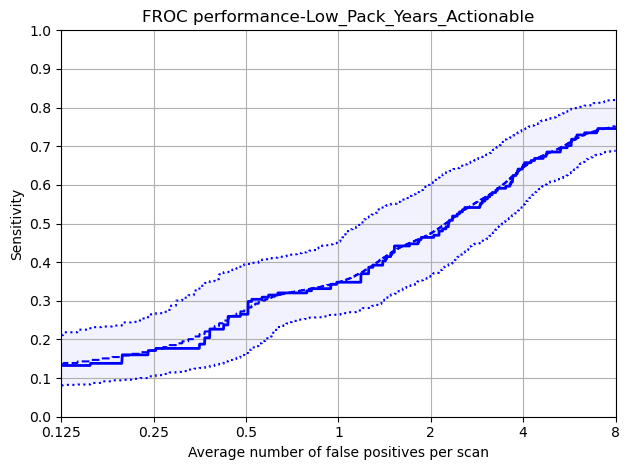

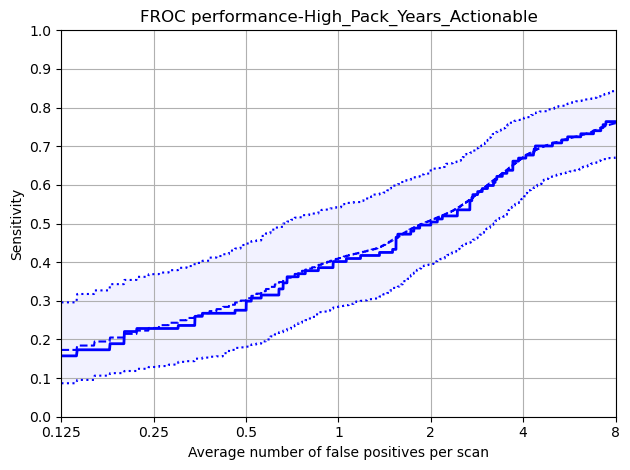

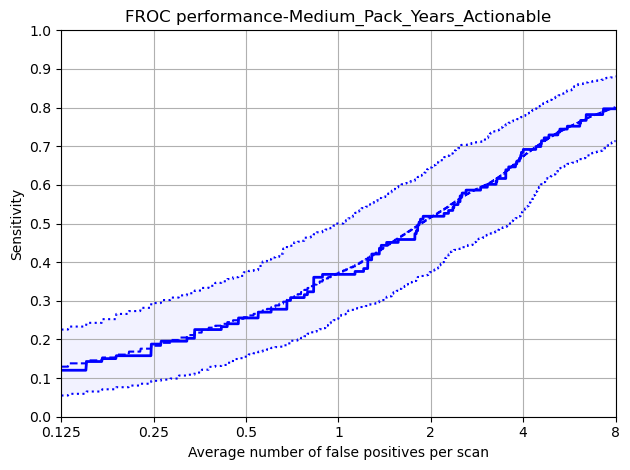

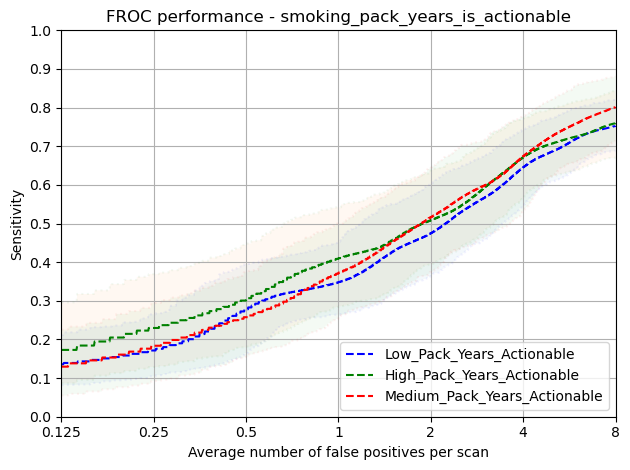

In [193]:
protected_group = 'smoking_pack_years_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/{flavour}/{protected_group}'
)

### False positive and Miss Investigations

In [231]:
import importlib
import utils

importlib.reload(utils)

<module 'utils' from '/Users/john/Projects/SOTAEvaluationNoduleDetection/notebooks/FairnessInNoduleDetectionAlgorithms/utils.py'>

In [232]:
thresholds = utils.get_thresholds(grt123_summit_summit)
missed_metadata = utils.miss_anaysis_at_fpps(
    model='grt123',
    scans_metadata=scan_metadata,
    scans_path=f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv',
    annotations_path=f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv',
    exclusions_path=f'{workspace_path}/data/summit/metadata/grt123_annotations_excluded_empty.csv',
    predictions_path=f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_predictions.csv',
    thresholds=thresholds
)


/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/test_balanced/test_balanced_metadata.csv
Total number of included nodule annotations: 699
Total number of nodule annotations: 699
Cases: 595
Missed Annotations at 7.2206535 FPPs: 594
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/test_balanced/test_balanced_metadata.csv
Total number of included nodule annotations: 699
Total number of nodule annotations: 699
Cases: 595
Missed Annotations at 6.7395515 FPPs: 554
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/test_balanced/test_balanced_metadata.csv
Total number of included nodule annotations: 699
Total number of nodule annotations: 699
Cases: 595
Missed Annotations at 6.1739454 FPPs: 496
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/test_balanced/test_balanced_metadata.csv
Total number o

#### Incremental FROC Scores - Gender/ Ethnic Group/ Nodule Type

In [233]:

hit_and_miss_dict = utils.get_protected_group_by_nodule_type(missed_metadata)


In [234]:


recode_dict = {}
for idx in range(7):
    hmm = {}
    for slice in ['all','actionable']:
        for protected_group in ['MALE','FEMALE','All', 'Asian or Asian British', 'Black', 'White']:
            for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:
            
                try:

                    group = 'gender' if protected_group in ['MALE','FEMALE','All'] else 'ethnic_group'

                    total = hit_and_miss_dict[idx][slice][group][(True,type)][protected_group] + hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    hits = hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    perc_hits = round(100 * (hits/total),0)

                    hmm[f'{slice}_{protected_group}_{type}_Hits%'] = perc_hits
                except:
                    print(f'Error: {idx}, {slice}, {protected_group}, {type}')
                    pass

    recode_dict[idx] = hmm

df = pd.DataFrame.from_dict(recode_dict, orient='index')

# Remove ".0" from each value in the dataframe
df = df.applymap(lambda x: str(x).replace('.0', ''))

# Collapse each column into comma-delimited values
collapsed_df = df.apply(lambda x: ', '.join(x), axis=0)

display(collapsed_df)

from scipy.stats import shapiro, ttest_ind, mannwhitneyu

def calculate_significant_differences(df, group1_name, group2_name):

    if group1_name not in df.columns or group2_name not in df.columns:
        print(f'Error: {group1_name} or {group2_name} not in dataframe')
        return

    group1 = df[group1_name].astype(int).values
    group2 = df[group2_name].astype(int).values

    shapiro_group1 = shapiro(group1)
    shapiro_group2 = shapiro(group2)

    print('*'*50)
    if shapiro_group1[1] > 0.05 and shapiro_group2[1] > 0.05:
        t_test = ttest_ind(group1, group2)
        print(f'Independent T-Test: {round(t_test.statistic,3)}, {round(t_test.pvalue,3)}')
    else:
        manwhitney = mannwhitneyu(group1, group2)
        print(f'Mann-Whitney U Test: {round(manwhitney.statistic,3)}, {round(manwhitney.pvalue,3)}')

for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:

    print(f'*** {type} ***')
    group1 = f'all_White_{type}_Hits%'
    group2 = f'all_Asian or Asian British_{type}_Hits%'
    calculate_significant_differences(df, group1, group2)

all_MALE_SOLID_Hits%                                     21, 33, 43, 57, 66, 81, 93
all_MALE_NON_SOLID_Hits%                                    4, 7, 7, 14, 21, 39, 46
all_MALE_PART_SOLID_Hits%                                11, 22, 22, 33, 33, 67, 78
all_MALE_PERIFISSURAL_Hits%                              13, 17, 24, 39, 55, 75, 85
all_MALE_CALCIFIED_Hits%                                   0, 6, 12, 12, 25, 38, 50
all_FEMALE_SOLID_Hits%                                   27, 33, 44, 54, 65, 73, 83
all_FEMALE_NON_SOLID_Hits%                                  0, 0, 0, 10, 19, 43, 52
all_FEMALE_PART_SOLID_Hits%                              31, 31, 44, 50, 50, 56, 69
all_FEMALE_PERIFISSURAL_Hits%                            11, 16, 26, 38, 59, 78, 86
all_FEMALE_CALCIFIED_Hits%                               16, 20, 32, 52, 64, 68, 68
all_All_SOLID_Hits%                                      24, 33, 43, 56, 66, 78, 89
all_All_NON_SOLID_Hits%                                     2, 4, 4, 12, 20,

*** SOLID ***
**************************************************
Independent T-Test: 0.291, 0.776
*** NON_SOLID ***
**************************************************
Independent T-Test: 0.459, 0.655
*** PART_SOLID ***
**************************************************
Independent T-Test: 1.757, 0.104
*** PERIFISSURAL ***
**************************************************
Independent T-Test: 0.701, 0.497
*** CALCIFIED ***
**************************************************
Independent T-Test: 2.603, 0.023


#### Nodule Characteristic Analysis

,0-4mm,4-8mm,8-15mm,15-20mm,20-30mm,30-40mm,40+mm
0.125,0.00,0.09,0.32,0.31,0.18,0.29,0.5
0.25,0.00,0.16,0.39,0.35,0.18,0.29,0.5
0.5,0.00,0.26,0.48,0.38,0.27,0.43,0.5
1,0.06,0.42,0.57,0.46,0.36,0.43,0.5
2,0.33,0.56,0.68,0.50,0.50,0.43,0.5
4,0.56,0.74,0.79,0.62,0.68,0.57,0.5
8,0.67,0.85,0.86,0.62,0.82,0.71,0.5
Total Annotations,5.00,66.00,100.00,26.00,22.00,7.00,2.0


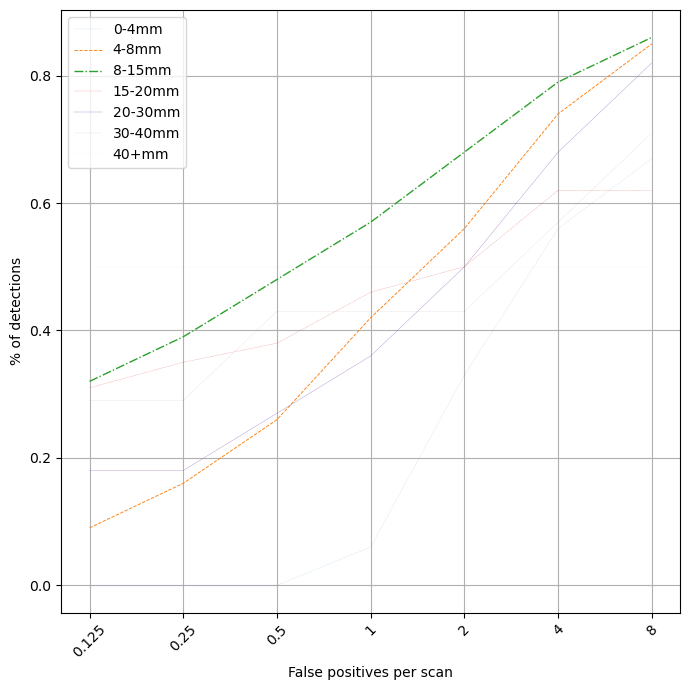

,SOLID,NON_SOLID,PART_SOLID
0.125,0.24,0.02,0.24
0.25,0.33,0.04,0.28
0.5,0.43,0.04,0.36
1,0.56,0.12,0.44
2,0.66,0.20,0.44
4,0.78,0.41,0.60
8,0.89,0.49,0.72
Total Annotations,121.00,43.00,25.00


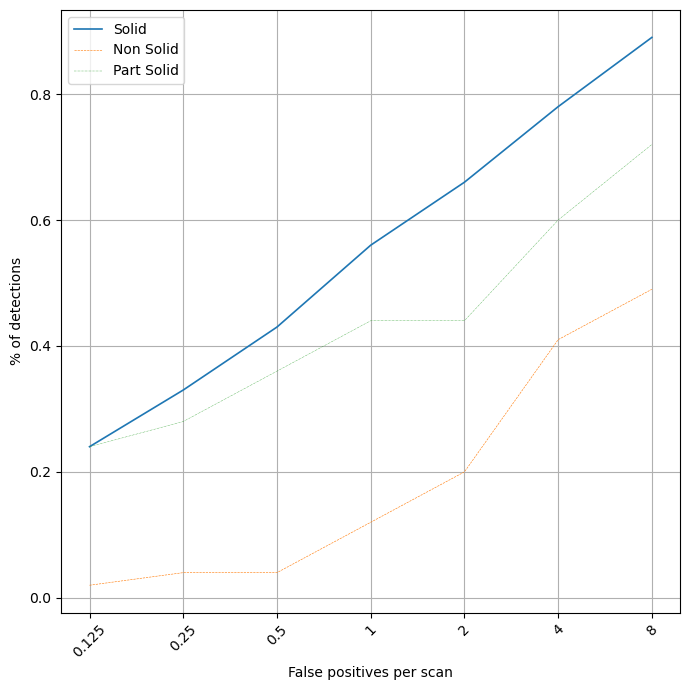

,LEFT_LOWER_LOBE,LEFT_UPPER_LOBE,RIGHT_UPPER_LOBE,RIGHT_LOWER_LOBE
0.125,0.13,0.10,0.11,0.22
0.25,0.19,0.14,0.17,0.27
0.5,0.28,0.20,0.26,0.34
1,0.44,0.28,0.38,0.49
2,0.58,0.41,0.51,0.65
4,0.73,0.60,0.69,0.80
8,0.83,0.74,0.78,0.86
Total Annotations,29.00,46.00,71.00,46.00


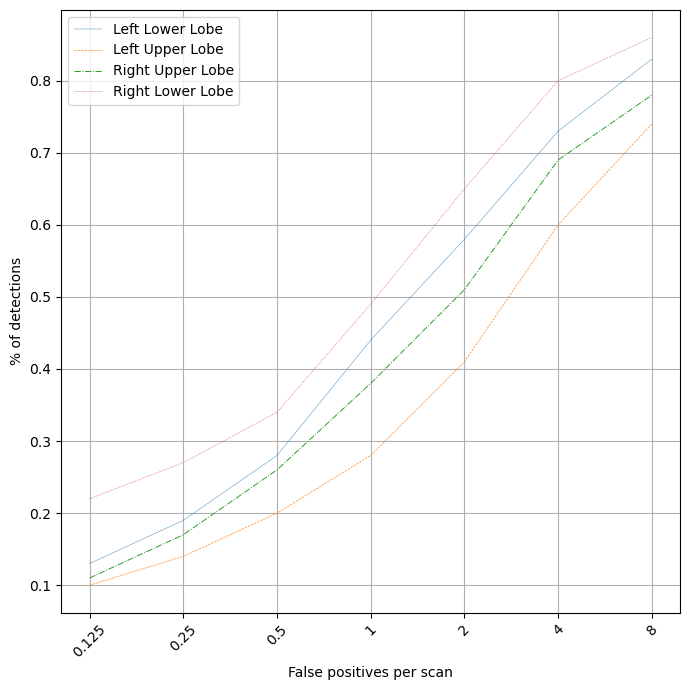

In [235]:

def cleanup(s):
    if s == 'CALCIFIED':
         return 'Inflamatory consolidation'
    
    s = s.replace('_', ' ')
    s = ' '.join(word.capitalize() for word in s.split())
    return s



nodule_characteristics = {
    'diameter_cats': diameter_lbs,
    'nodule_type': ['SOLID', 'NON_SOLID', 'PART_SOLID', 'CALCIFIED'],
    'nodule_site': [ 'LEFT_LOWER_LOBE', 'LEFT_MIDDLE_LOBE', 'LEFT_UPPER_LOBE', 'RIGHT_UPPER_LOBE', 'RIGHT_LOWER_LOBE']
}

for ivx, (var, order) in enumerate(nodule_characteristics.items()):
    annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')
    annotations = annotations[annotations['management_plan'] != 'RANDOMISATION_AT_YEAR_1']

    total_vc = annotations[var].value_counts().sort_index().rename('Total Annotations')

    operating_points = ['0.125', '0.25', '0.5', '1', '2', '4', '8']

    results = []

    for idx, metadata in enumerate(missed_metadata):
        results.append(
            pd.crosstab(
                metadata[var], 
                metadata['miss'],
                normalize='index'
            )[False]
            .rename(f'{operating_points[idx]}')
            .reindex(order)
            
        )

    df = pd.concat(results, axis=1).fillna(0).round(2).merge(total_vc.to_frame(), left_index=True, right_index=True)

    display(df.T)

    fig, ax = plt.subplots(1, 1, figsize=(7, 7))
    line_styles = ['-', '--', '-.', ':', '-', '--', '-.']
    weights = df.pop('Total Annotations')

    for isx, column in enumerate(df.T):    
            ax.plot(df.T[column], label=cleanup(column), linestyle=line_styles[isx], linewidth=weights[isx]/100)
    
    ax.set_xticklabels(labels=df.columns, rotation=45)
    ax.legend()
    ax.set_xlabel('False positives per scan')
    ax.set_ylabel('% of detections')
    ax.grid(visible=True, which='both')

    plt.tight_layout()
    plt.savefig(f'{workspace_path}/miccai_fair_ai/grt123_detected_nodule_characteristics_{var}.png')
    plt.show()

In [236]:
missed_at_lowest = missed_metadata[0]
hits = missed_at_lowest[missed_at_lowest['miss'] == False]

(
    pd.crosstab(
        [
            hits['diameter_cats'],
            hits['nodule_type']
        ], 
        hits['nodule_site_combined'],
        normalize='all'
    )[['UPPER','NOT-UPPER']]
    .apply(lambda x: round(100 * x, 1))
)

nodule_site_combined        UPPER  NOT-UPPER
diameter_cats nodule_type                   
15-20mm       CALCIFIED       0.0        1.0
              PART_SOLID      1.0        1.0
              SOLID           2.9        1.0
20-30mm       PART_SOLID      1.0        1.0
              SOLID           0.0        1.9
30-40mm       CALCIFIED       0.0        1.0
              SOLID           0.0        1.0
4-8mm         CALCIFIED       1.0        0.0
              PERIFISSURAL    1.0       13.3
              SOLID           2.9        9.5
40+mm         SOLID           1.0        0.0
8-15mm        CALCIFIED       0.0        1.0
              NON_SOLID       1.0        0.0
              PART_SOLID      0.0        1.0
              PERIFISSURAL    5.7        7.6
              SOLID           8.6       13.3

In [237]:
thresholds = get_thresholds(grt123_summit_summit)

scans = pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv')
predictions = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_predictions.csv')
annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')

false_positives_fpps = false_positive_analysis(
    thresholds=thresholds,    
    predictions=predictions,
    annotations=annotations
)

predictions: 178 at threshold: 7.2206535
distance false positives: 73 at threshold: 7.2206535
predictions: 290 at threshold: 6.7395515
distance false positives: 145 at threshold: 6.7395515
predictions: 495 at threshold: 6.1739454
distance false positives: 292 at threshold: 6.1739454
predictions: 886 at threshold: 5.448881
distance false positives: 594 at threshold: 5.448881
predictions: 1595 at threshold: 4.5769815
distance false positives: 1205 at threshold: 4.5769815
predictions: 2922 at threshold: 3.3151371
distance false positives: 2415 at threshold: 3.3151371
predictions: 5326 at threshold: 1.4922369
distance false positives: 4744 at threshold: 1.4922369


#### Examples of False Positives

summit-2477-ppd_Y0_BASELINE_A already exists
[[176.195       67.59        61.92         4.18984227]
 [ 99.015       51.19        31.24         5.00077949]
 [229.975      139.76        97.01        21.96288288]]
summit-2477-ppd_Y0_BASELINE_A - 241.58118 141.58931 93.29571 24.342207
False Positive: True
IoU False Positive: 0.2618061935096805


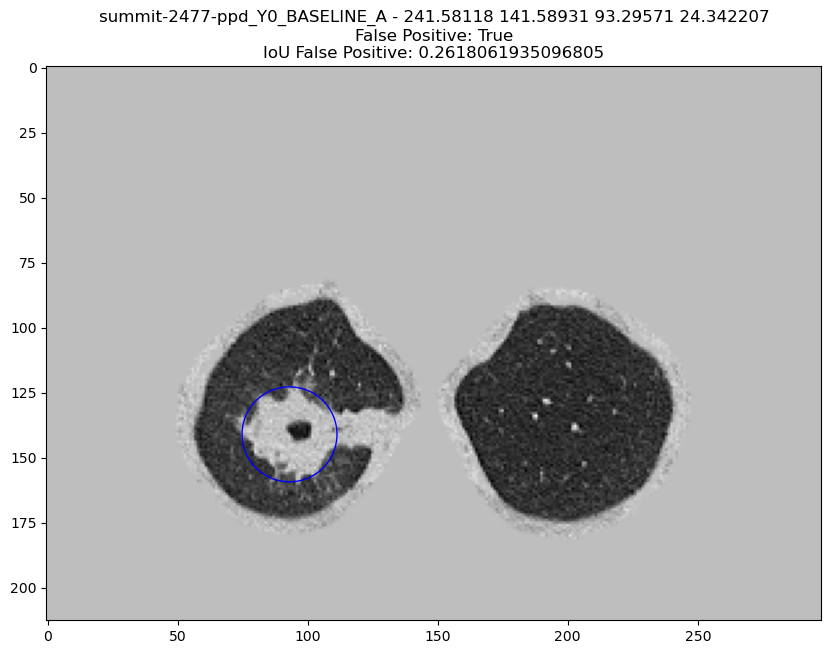

summit-4578-scm_Y0_BASELINE_A already exists
[[0 0 0 0]]
summit-4578-scm_Y0_BASELINE_A - 201.61537 209.58585 69.32576 24.454403
False Positive: True
IoU False Positive: nan


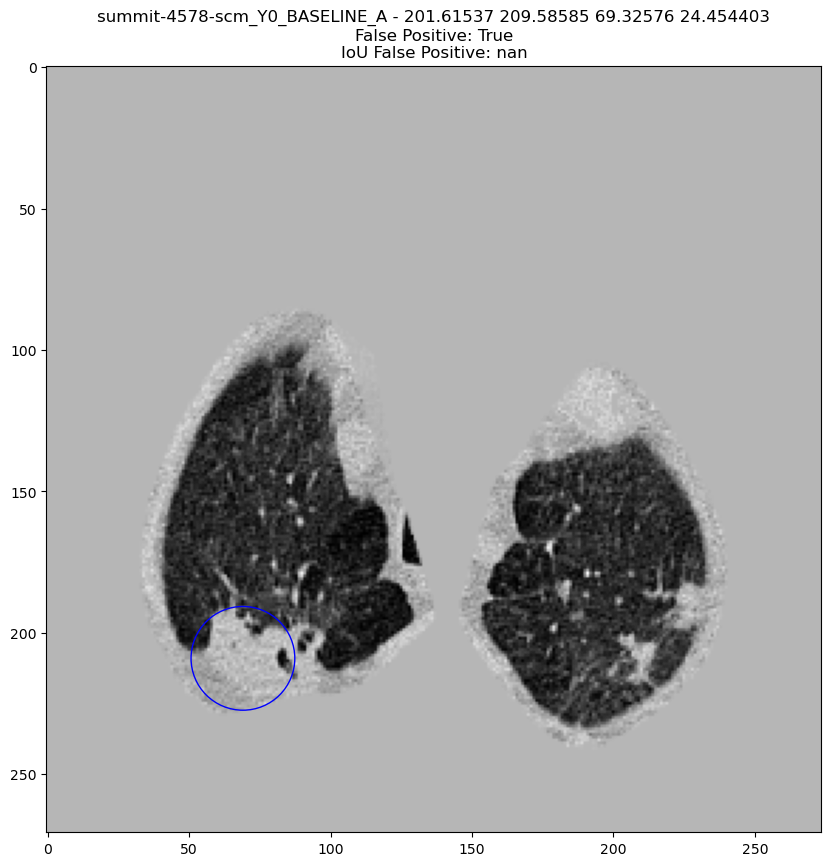

summit-4978-anz_Y0_BASELINE_A already exists
[[0 0 0 0]]
summit-4978-anz_Y0_BASELINE_A - 202.30933 73.39236 96.555664 8.925204
False Positive: True
IoU False Positive: nan


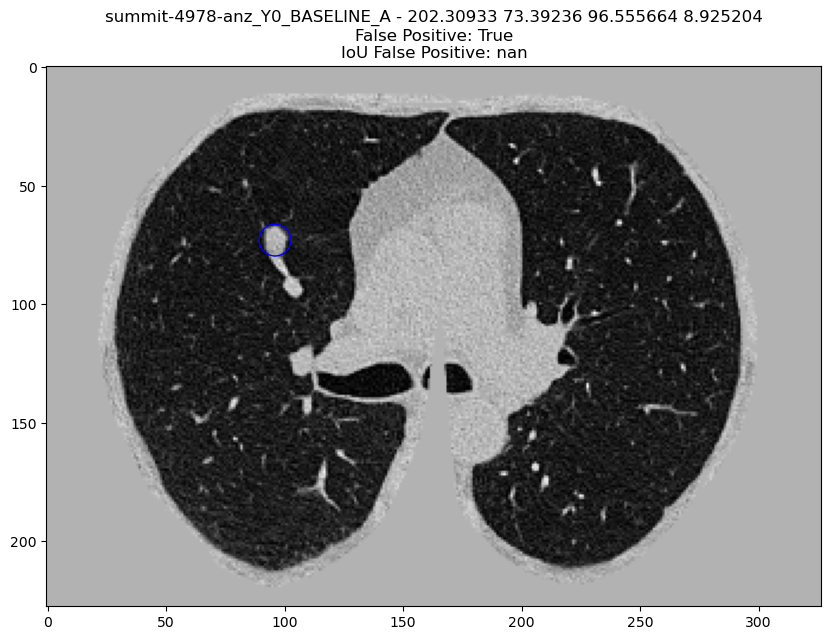

summit-9326-jcf_Y0_BASELINE_A already exists
[[156.21        80.37999695 266.2399939    2.553125  ]]
summit-9326-jcf_Y0_BASELINE_A - 57.027893 156.91324 17.563618 6.8193555
False Positive: True
IoU False Positive: 0.0


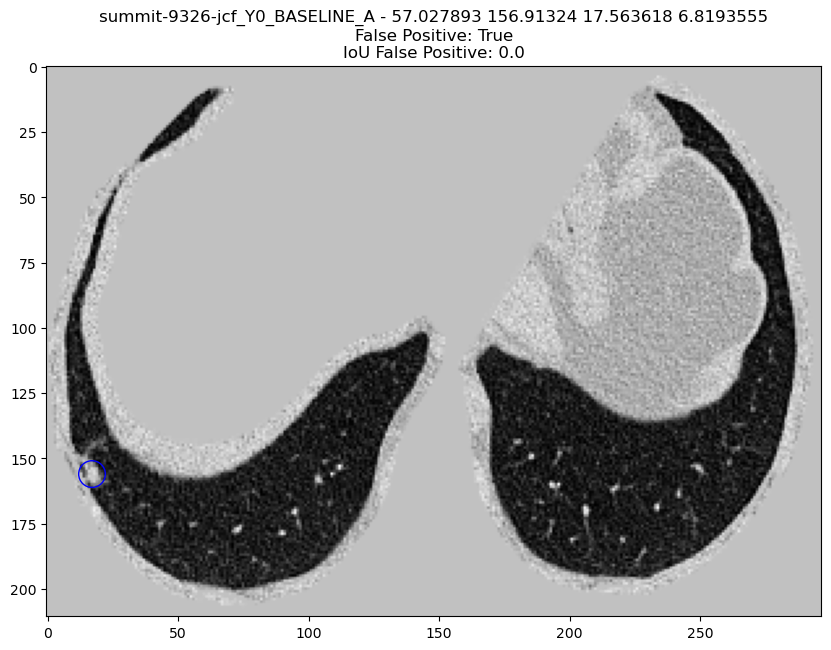

summit-3288-gfs_Y0_BASELINE_A already exists
[[0 0 0 0]]
summit-3288-gfs_Y0_BASELINE_A - 114.35067 176.82104 84.20917 8.196819
False Positive: True
IoU False Positive: nan


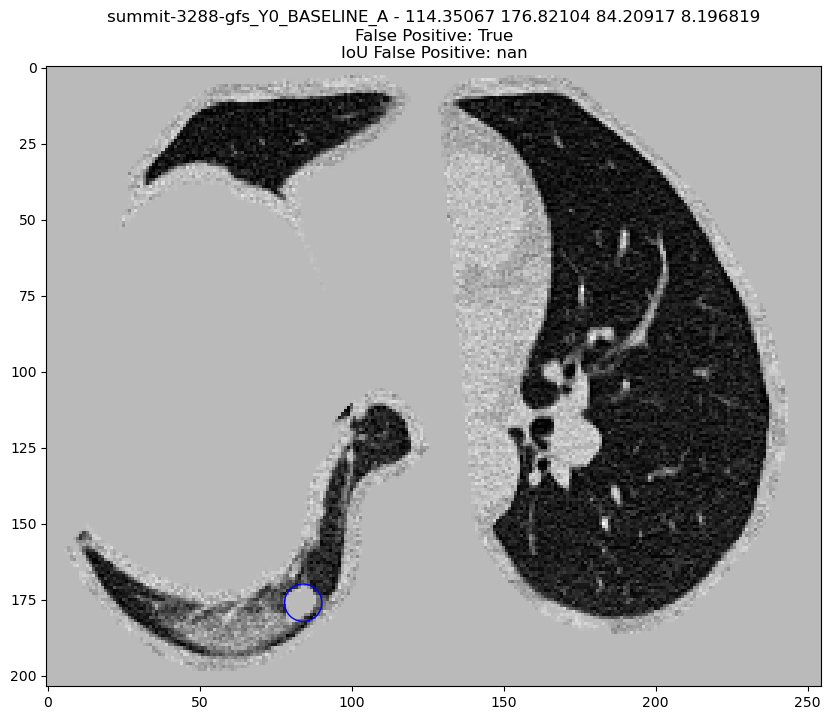

summit-3768-mgu_Y0_BASELINE_A already exists
[[131.88        92.94        92.2900061   19.00391288]]
summit-3768-mgu_Y0_BASELINE_A - 125.63948 77.64349 69.46979 26.383251
False Positive: True
IoU False Positive: 0.04573147508192739


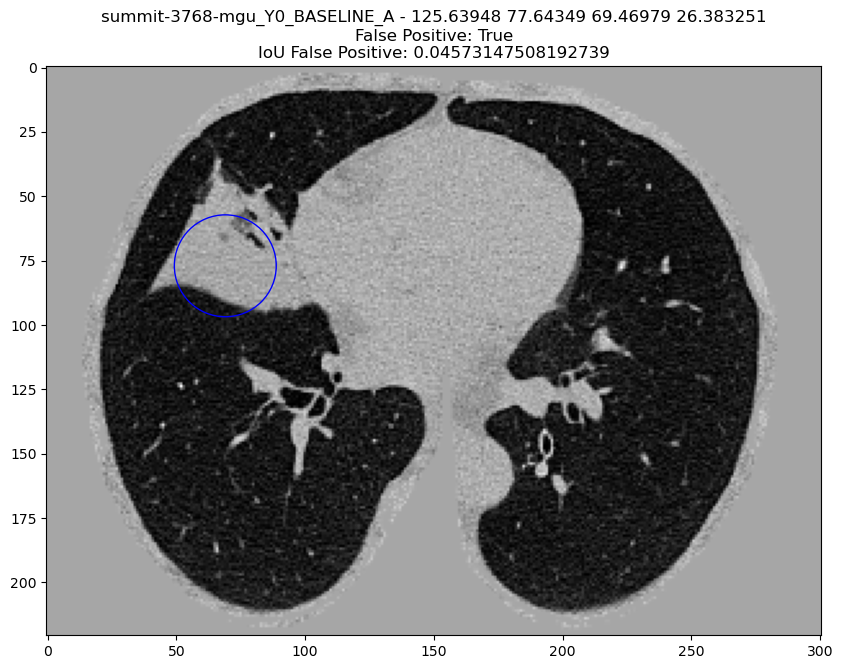

summit-9294-yyy_Y0_BASELINE_A already exists
[[0 0 0 0]]
summit-9294-yyy_Y0_BASELINE_A - 150.34537 101.987946 50.68444 5.7515306
False Positive: True
IoU False Positive: nan


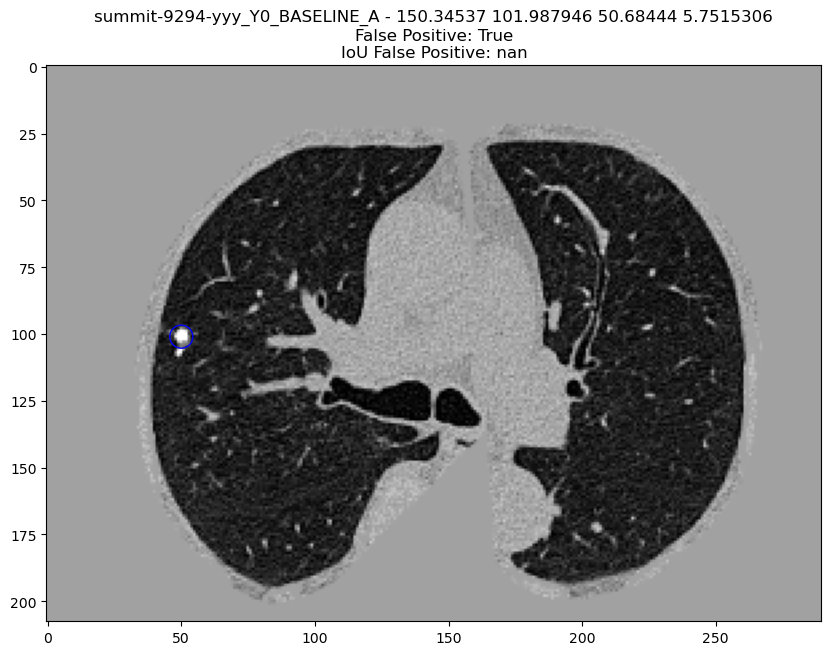

summit-9397-wse_Y0_BASELINE_A already exists
[[0 0 0 0]]
summit-9397-wse_Y0_BASELINE_A - 242.23856 49.40045 120.402115 10.403505
False Positive: True
IoU False Positive: nan


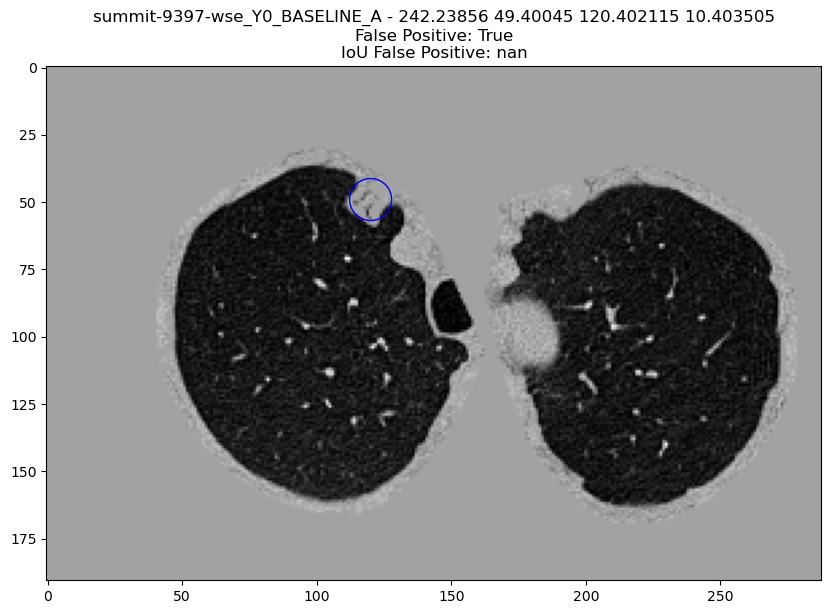

summit-3638-yab_Y0_BASELINE_A already exists
[[0 0 0 0]]
summit-3638-yab_Y0_BASELINE_A - 126.52324 34.375774 82.235794 5.4221
False Positive: True
IoU False Positive: nan


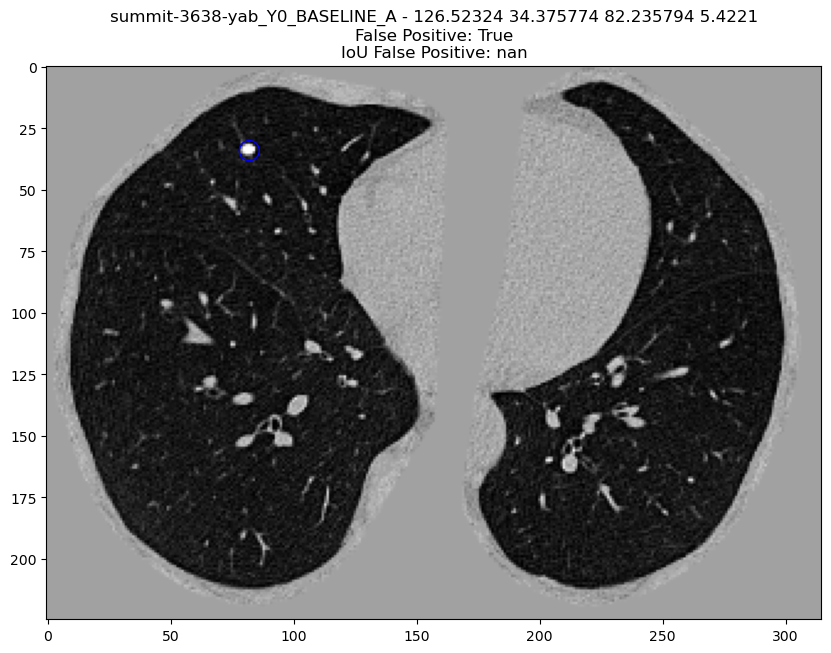

summit-7962-cga_Y0_BASELINE_A already exists
[[58.61       59.11       23.84999695  8.27734685]]
summit-7962-cga_Y0_BASELINE_A - 222.75877 65.44562 97.234245 6.424183
False Positive: True
IoU False Positive: 0.0


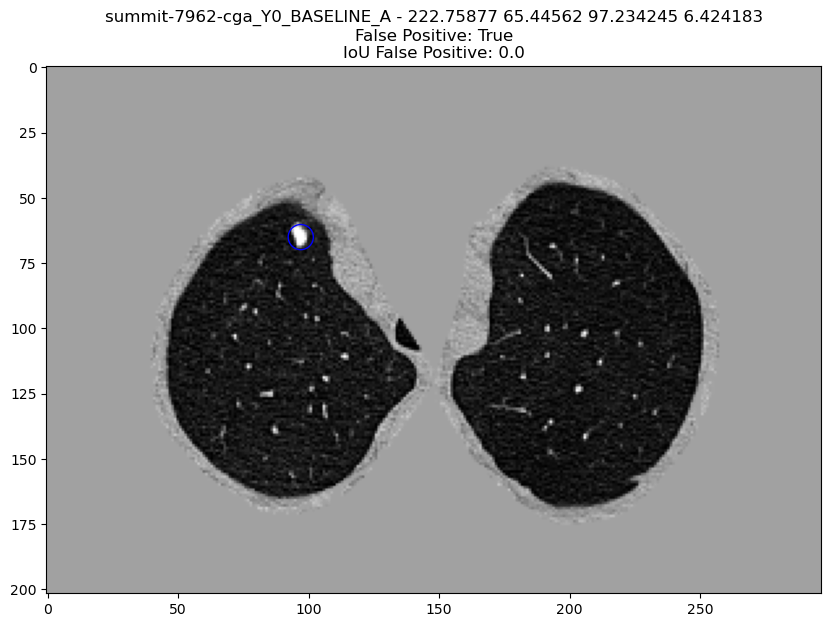

summit-8563-tkf_Y0_BASELINE_A already exists
[[191.805      181.65       104.0799939    4.66288898]
 [177.555      195.03        69.4099939    3.51406126]]
summit-8563-tkf_Y0_BASELINE_A - 100.78754 57.05622 277.118 6.998582
False Positive: True
IoU False Positive: 0.0


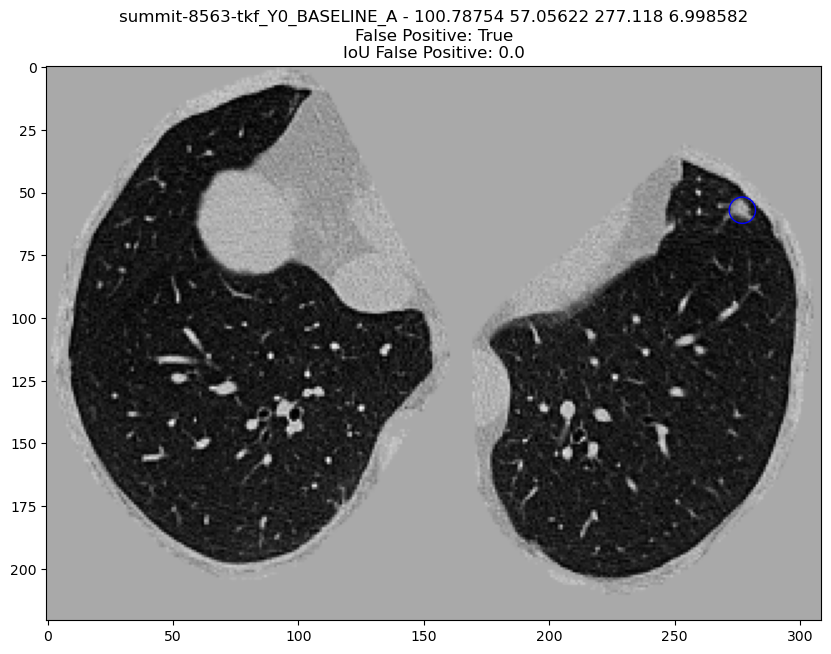

summit-8799-hac_Y0_BASELINE_A already exists
[[102.975     116.7        15.03        3.0234375]
 [119.235     122.65      281.93        2.53125  ]
 [162.955     184.76      191.36        4.1484375]
 [170.705     191.2       201.82        3.1640625]]
summit-8799-hac_Y0_BASELINE_A - 57.271576 164.68388 184.4122 6.879239
False Positive: True
IoU False Positive: 0.0


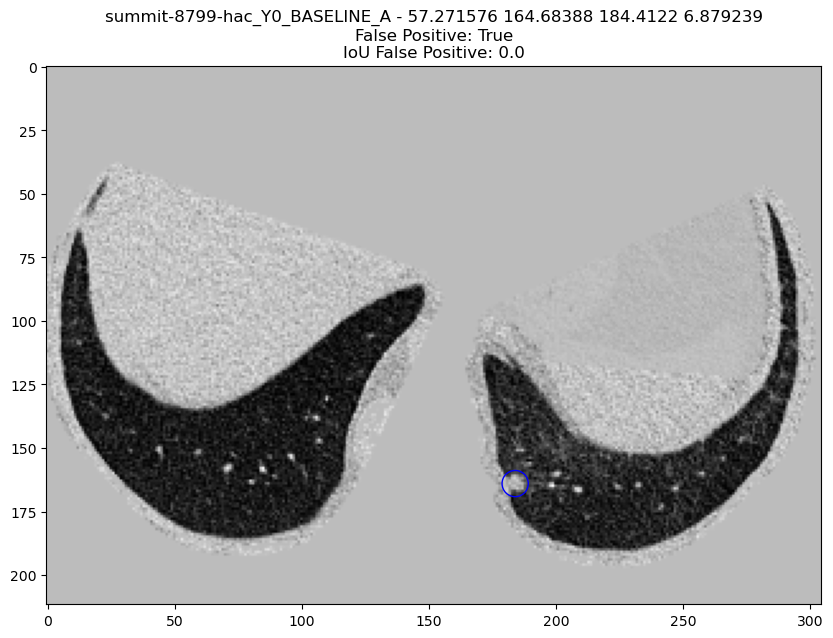

In [238]:
cnt = 0

df = false_positives_fpps['0.125']

for idx, row in df[df.distance_false_positive].sort_values(by='threshold', ascending=False).iterrows():
    study_id = row['name']
    x = row['row']
    y = row['col']
    z = row['index']
    diameter = row['diameter']
    

    copy_scan_from_cluster(study_id)
    show_numpy_candidate_location(study_id, x, y, z, diameter, row.distance_false_positive, row.iou_false_positive)
    cnt+=1
    if cnt == 12:
        break

## MONAI Detection

In [239]:

detection_predictions_path = combine_predictions(f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}', 'test')
detection_predictions = pd.read_csv(detection_predictions_path)

annotations = (
    pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/test_metadata.csv')
    .assign(name=lambda df: df.participant_id + '_Y0_BASELINE_A')
    .assign(row=lambda df: df['nodule_x_coordinate'])
    .assign(col=lambda df: df['nodule_y_coordinate'])
    .assign(index=lambda df: df['nodule_z_coordinate'])
    .assign(diameter=lambda df: df['nodule_diameter_mm'])
    .assign(diameter_cats=lambda df: pd.cut(
        df['nodule_diameter_mm'],
        bins=diameter_cats,
        labels=diameter_lbs
    ))
    .assign(nodule_site_combined=lambda df: df['nodule_site'].apply(combine_site))
    .assign(nodule_site_combined2=lambda df: df['nodule_site'].apply(combine_site2))
)

annotations.to_csv(f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv', index=False)

detection_summit_summit = noduleCADEvaluation(
    annotations_filename=f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv',
    annotations_excluded_filename=f'{workspace_path}/data/summit/metadata/annotations_excluded_empty.csv',
    seriesuids_filename=f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv',
    results_filename=detection_predictions_path,
    filter='\nModel 2 trained on SUMMIT dataset and evaluated on SUMMIT dataset\n',
    outputDir=f'{workspace_path}/results/detection/trained_summit/summit/{flavour}',
)
caluclate_cpm_from_bootstrapping(f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/froc_predictions_bootstrapping.csv')
show_metrics(f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/CADAnalysis.txt')


/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/test_balanced/result_test_balanced.json
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/test_balanced/annotations.csv
Total number of included nodule annotations: 699
Total number of nodule annotations: 699
Cases: 595
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None


 52%|█████▏    | 520/1000 [00:15<00:13, 34.40it/s]


Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "/Users/john/miniconda3/envs/summit/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3505, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/ipykernel_81319/100824613.py", line 22, in <module>
    detection_summit_summit = noduleCADEvaluation(
                              ^^^^^^^^^^^^^^^^^^^^
  File "/Users/john/Projects/SOTAEvaluationNoduleDetection/notebooks/FairnessInNoduleDetectionAlgorithms/../../utilities/evaluation.py", line 603, in noduleCADEvaluation
    (fps, sens, thresholds, fps_bs_itp, sens_bs_mean, sens_bs_lb, sens_bs_up, fps_itp, sens_itp) = evaluateCAD(seriesUIDs,
                                                                                                   ^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/john/Projects/SOTAEvaluationNoduleDetection/notebooks/FairnessInNoduleDetectionAlgorithms/../../utilities/evaluation.py", line 443, in eval

### Gender analysis

Protected Group: MALE


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,56.0,2.0,7.0,4.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp8d8n8tms/annotations.csv
Total number of included nodule annotations: 396
Total number of nodule annotations: 396
Cases: 342
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:14<00:00, 69.13it/s]


,0,159,476,1111,2381,4920,9999
0,0.189 (0.127 - 0.257),0.313 (0.245 - 0.393),0.464 (0.395 - 0.54),0.597 (0.531 - 0.669),0.717 (0.664 - 0.774),0.835 (0.788 - 0.884),0.914 (0.877 - 0.945)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.189,0.127,0.257
159,0.250,0.313,0.245,0.393
476,0.500,0.464,0.395,0.540
1111,1.000,0.597,0.531,0.669
2381,2.000,0.717,0.664,0.774
4920,4.000,0.835,0.788,0.884
9999,8.000,0.914,0.877,0.945


Mean Sensitivity: 0.58 Low Sensitivity: 0.52 High Sensitivity: 0.637


,True positives,383
0,False positives,13727.000
1,False negatives,13.000
2,True negatives,0.000
3,Total number of candidates,14466.000
4,Total number of nodules,396.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,358.000
7,Sensitivity,0.967
8,Average number of candidates per scan,42.298


Protected Group: FEMALE


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,27.0,52.0,5.0,7.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpjjzsiawk/annotations.csv
Total number of included nodule annotations: 299
Total number of nodule annotations: 299
Cases: 251
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:09<00:00, 100.57it/s]


,0,159,476,1111,2381,4920,9999
0,0.248 (0.184 - 0.345),0.367 (0.294 - 0.439),0.494 (0.407 - 0.58),0.62 (0.548 - 0.692),0.748 (0.689 - 0.806),0.855 (0.812 - 0.9),0.91 (0.878 - 0.943)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.248,0.184,0.345
159,0.250,0.367,0.294,0.439
476,0.500,0.494,0.407,0.580
1111,1.000,0.620,0.548,0.692
2381,2.000,0.748,0.689,0.806
4920,4.000,0.855,0.812,0.900
9999,8.000,0.910,0.878,0.943


Mean Sensitivity: 0.61 Low Sensitivity: 0.54 High Sensitivity: 0.672


,True positives,285
0,False positives,9607.000
1,False negatives,14.000
2,True negatives,0.000
3,Total number of candidates,10226.000
4,Total number of nodules,299.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,337.000
7,Sensitivity,0.953
8,Average number of candidates per scan,40.741


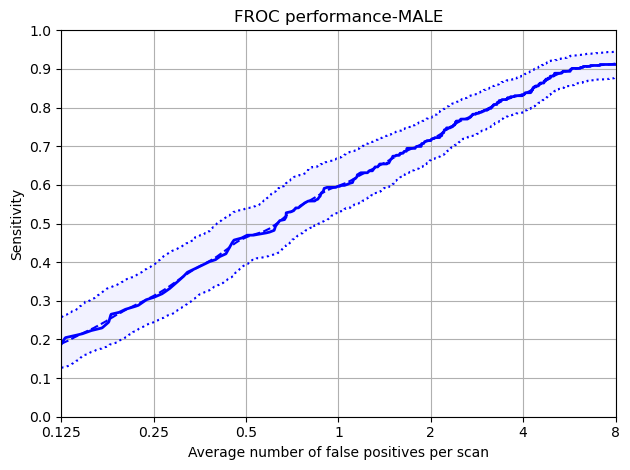

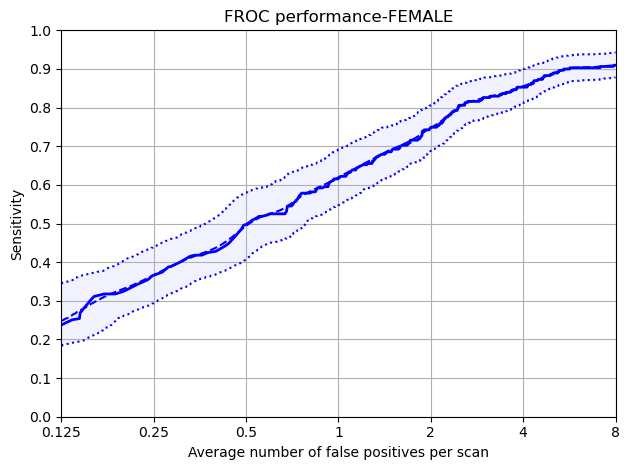

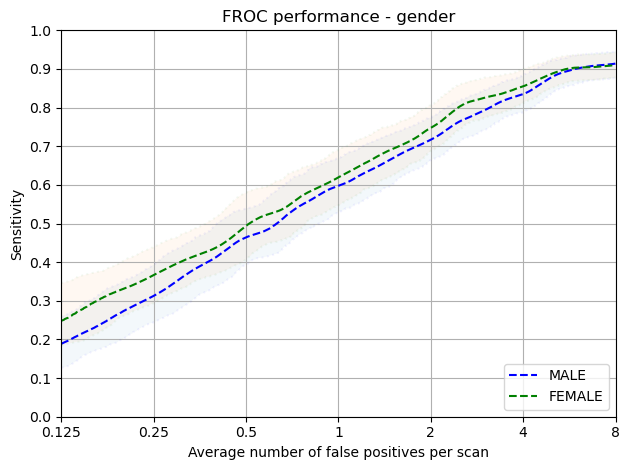

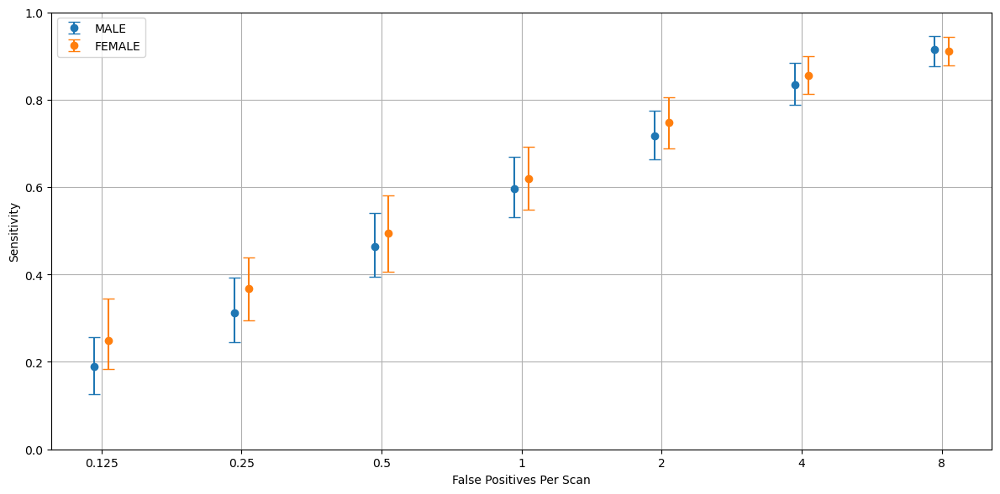

In [ ]:


annotations = pd.read_csv(f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv')

predictions = pd.read_csv(detection_predictions_path)

protected_group = 'gender'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour, 'Gender', data_dict)

### Age analysis

Protected Group: 65-69


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,24.0,61.0,2.0,7.0,5.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp6o7h1ifk/annotations.csv
Total number of included nodule annotations: 168
Total number of nodule annotations: 168
Cases: 166


100%|██████████| 1000/1000 [00:06<00:00, 145.81it/s]


,0,159,476,1111,2381,4920,9999
0,0.263 (0.181 - 0.374),0.4 (0.298 - 0.502),0.531 (0.429 - 0.639),0.654 (0.558 - 0.745),0.763 (0.687 - 0.837),0.894 (0.84 - 0.943),0.931 (0.89 - 0.968)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.263,0.181,0.374
159,0.250,0.400,0.298,0.502
476,0.500,0.531,0.429,0.639
1111,1.000,0.654,0.558,0.745
2381,2.000,0.763,0.687,0.837
4920,4.000,0.894,0.840,0.943
9999,8.000,0.931,0.890,0.968


Mean Sensitivity: 0.63 Low Sensitivity: 0.55 High Sensitivity: 0.715


,True positives,164
0,False positives,6682.000
1,False negatives,4.000
2,True negatives,0.000
3,Total number of candidates,6998.000
4,Total number of nodules,168.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,152.000
7,Sensitivity,0.976
8,Average number of candidates per scan,42.157


Protected Group: 60-64


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,53.0,4.0,8.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpacy6trip/annotations.csv
Total number of included nodule annotations: 200
Total number of nodule annotations: 200
Cases: 148


100%|██████████| 1000/1000 [00:05<00:00, 178.28it/s]


,0,159,476,1111,2381,4920,9999
0,0.208 (0.136 - 0.296),0.288 (0.2 - 0.394),0.422 (0.325 - 0.529),0.551 (0.453 - 0.667),0.708 (0.624 - 0.789),0.818 (0.754 - 0.881),0.911 (0.864 - 0.957)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.208,0.136,0.296
159,0.250,0.288,0.200,0.394
476,0.500,0.422,0.325,0.529
1111,1.000,0.551,0.453,0.667
2381,2.000,0.708,0.624,0.789
4920,4.000,0.818,0.754,0.881
9999,8.000,0.911,0.864,0.957


Mean Sensitivity: 0.56 Low Sensitivity: 0.48 High Sensitivity: 0.645


,True positives,189
0,False positives,5360.000
1,False negatives,11.000
2,True negatives,0.000
3,Total number of candidates,5741.000
4,Total number of nodules,200.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,192.000
7,Sensitivity,0.945
8,Average number of candidates per scan,38.791


Protected Group: 70-75


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,34.0,48.0,4.0,6.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpn0dy22lb/annotations.csv
Total number of included nodule annotations: 140
Total number of nodule annotations: 140
Cases: 115
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:05<00:00, 185.06it/s]


,0,159,476,1111,2381,4920,9999
0,0.173 (0.069 - 0.305),0.327 (0.212 - 0.457),0.534 (0.425 - 0.649),0.662 (0.572 - 0.752),0.772 (0.678 - 0.864),0.877 (0.796 - 0.946),0.927 (0.848 - 0.986)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.173,0.069,0.305
159,0.250,0.327,0.212,0.457
476,0.500,0.534,0.425,0.649
1111,1.000,0.662,0.572,0.752
2381,2.000,0.772,0.678,0.864
4920,4.000,0.877,0.796,0.946
9999,8.000,0.927,0.848,0.986


Mean Sensitivity: 0.61 Low Sensitivity: 0.51 High Sensitivity: 0.708


,True positives,134
0,False positives,5185.000
1,False negatives,6.000
2,True negatives,0.000
3,Total number of candidates,5456.000
4,Total number of nodules,140.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,142.000
7,Sensitivity,0.957
8,Average number of candidates per scan,47.443


Protected Group: 55-59


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,55.0,3.0,5.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpj53u9rr0/annotations.csv
Total number of included nodule annotations: 144
Total number of nodule annotations: 144
Cases: 134


100%|██████████| 1000/1000 [00:04<00:00, 203.64it/s]


,0,159,476,1111,2381,4920,9999
0,0.228 (0.106 - 0.389),0.366 (0.26 - 0.496),0.479 (0.356 - 0.623),0.649 (0.549 - 0.757),0.737 (0.649 - 0.842),0.849 (0.776 - 0.914),0.907 (0.855 - 0.952)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.228,0.106,0.389
159,0.250,0.366,0.260,0.496
476,0.500,0.479,0.356,0.623
1111,1.000,0.649,0.549,0.757
2381,2.000,0.737,0.649,0.842
4920,4.000,0.849,0.776,0.914
9999,8.000,0.907,0.855,0.952


Mean Sensitivity: 0.6 Low Sensitivity: 0.51 High Sensitivity: 0.71


,True positives,140
0,False positives,4758.000
1,False negatives,4.000
2,True negatives,0.000
3,Total number of candidates,5053.000
4,Total number of nodules,144.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,155.000
7,Sensitivity,0.972
8,Average number of candidates per scan,37.709


Protected Group: 75+


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,23.0,51.0,9.0,14.0,2.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpgx626wts/annotations.csv
Total number of included nodule annotations: 43
Total number of nodule annotations: 43
Cases: 33


100%|██████████| 1000/1000 [00:01<00:00, 583.94it/s]


,0,159,476,1111,2381,4920,9999
0,0.196 (0.04 - 0.409),0.255 (0.082 - 0.469),0.341 (0.163 - 0.533),0.429 (0.285 - 0.618),0.604 (0.4 - 0.791),0.706 (0.5 - 0.879),0.835 (0.688 - 0.949)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.196,0.040,0.409
159,0.250,0.255,0.082,0.469
476,0.500,0.341,0.163,0.533
1111,1.000,0.429,0.285,0.618
2381,2.000,0.604,0.400,0.791
4920,4.000,0.706,0.500,0.879
9999,8.000,0.835,0.688,0.949


Mean Sensitivity: 0.48 Low Sensitivity: 0.31 High Sensitivity: 0.664


,True positives,41
0,False positives,1349.000
1,False negatives,2.000
2,True negatives,0.000
3,Total number of candidates,1444.000
4,Total number of nodules,43.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,54.000
7,Sensitivity,0.953
8,Average number of candidates per scan,43.758


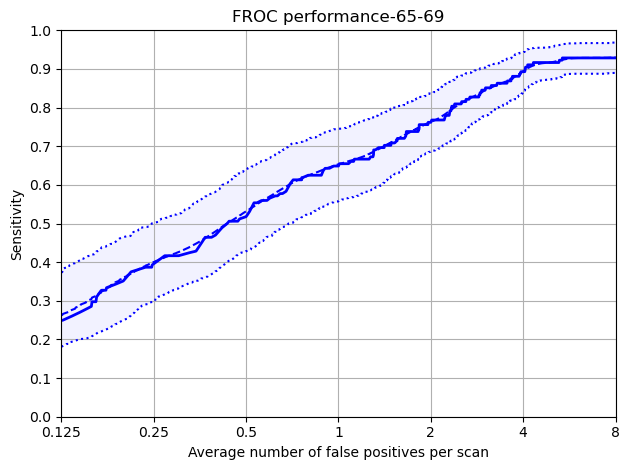

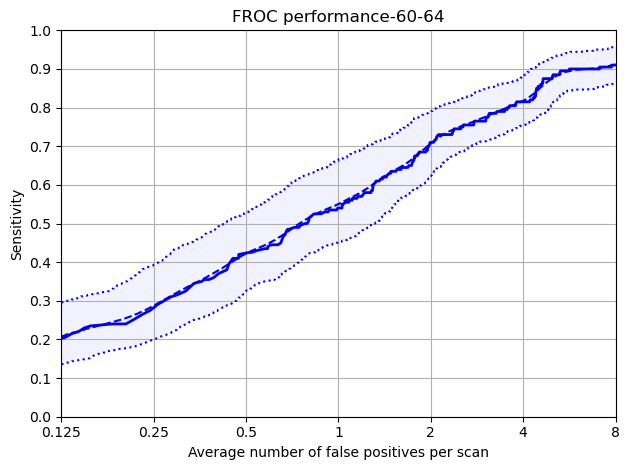

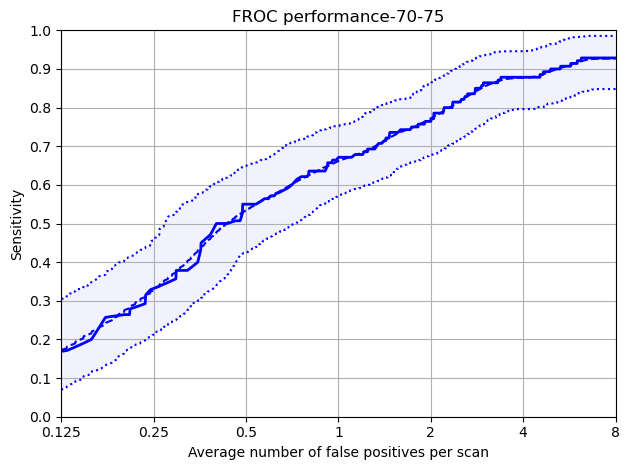

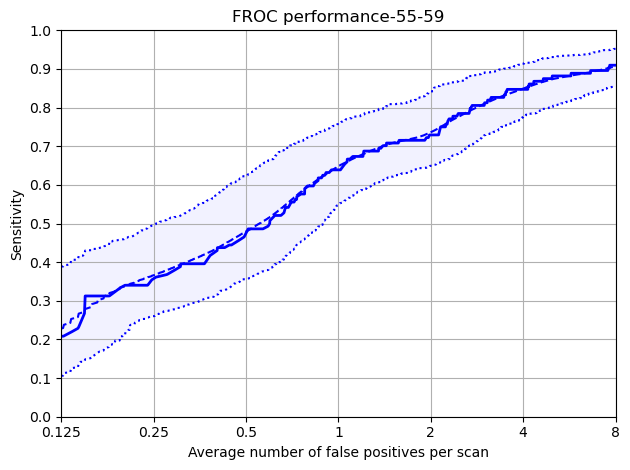

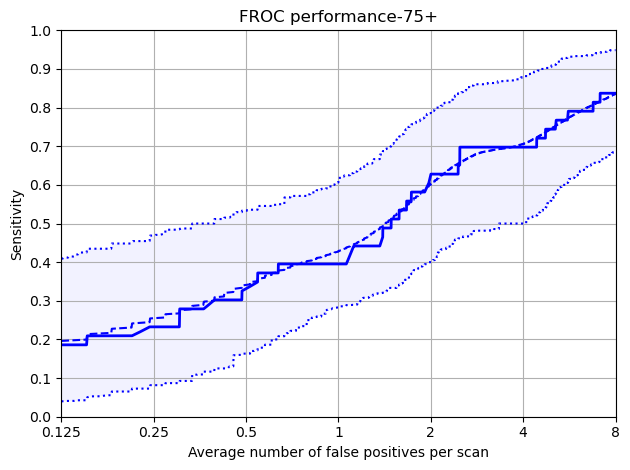

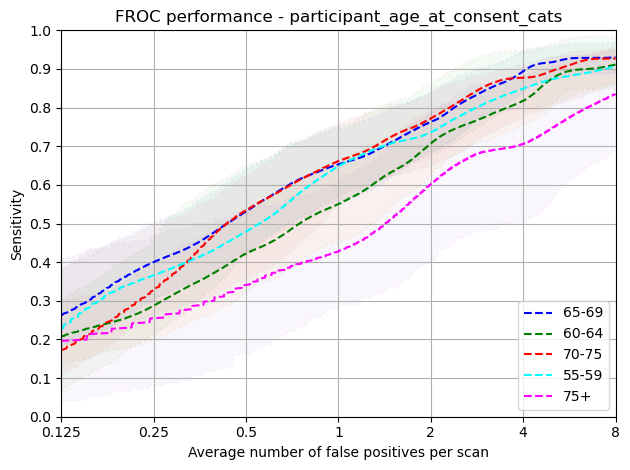

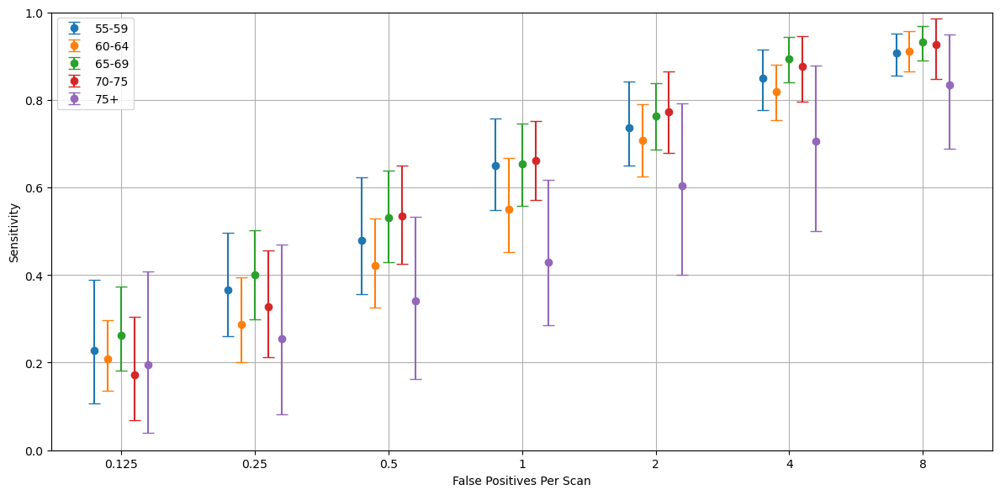

In [ ]:
protected_group = 'participant_age_at_consent_cats'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour, 'Age', data_dict, ['55-59','60-64','65-69','70-75','75+'])

### Ethnicity Analysis

Protected Group: Black


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,26.0,63.0,2.0,5.0,4.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp3uiv1yz1/annotations.csv
Total number of included nodule annotations: 250
Total number of nodule annotations: 250
Cases: 199


100%|██████████| 1000/1000 [00:07<00:00, 131.27it/s]


,0,159,476,1111,2381,4920,9999
0,0.27 (0.18 - 0.362),0.331 (0.244 - 0.428),0.465 (0.384 - 0.555),0.592 (0.504 - 0.685),0.734 (0.663 - 0.814),0.845 (0.793 - 0.897),0.918 (0.882 - 0.954)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.270,0.180,0.362
159,0.250,0.331,0.244,0.428
476,0.500,0.465,0.384,0.555
1111,1.000,0.592,0.504,0.685
2381,2.000,0.734,0.663,0.814
4920,4.000,0.845,0.793,0.897
9999,8.000,0.918,0.882,0.954


Mean Sensitivity: 0.59 Low Sensitivity: 0.52 High Sensitivity: 0.671


,True positives,241
0,False positives,7539.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,7993.000
4,Total number of nodules,250.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,213.000
7,Sensitivity,0.964
8,Average number of candidates per scan,40.166


Protected Group: Asian or Asian British


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,52.0,3.0,10.0,5.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmppgq82g8r/annotations.csv
Total number of included nodule annotations: 203
Total number of nodule annotations: 203
Cases: 196
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:07<00:00, 132.53it/s]


,0,159,476,1111,2381,4920,9999
0,0.178 (0.101 - 0.268),0.302 (0.182 - 0.45),0.474 (0.378 - 0.574),0.606 (0.516 - 0.695),0.7 (0.622 - 0.782),0.829 (0.753 - 0.894),0.897 (0.838 - 0.947)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.178,0.101,0.268
159,0.250,0.302,0.182,0.450
476,0.500,0.474,0.378,0.574
1111,1.000,0.606,0.516,0.695
2381,2.000,0.700,0.622,0.782
4920,4.000,0.829,0.753,0.894
9999,8.000,0.897,0.838,0.947


Mean Sensitivity: 0.57 Low Sensitivity: 0.48 High Sensitivity: 0.659


,True positives,191
0,False positives,7604.000
1,False negatives,12.000
2,True negatives,0.000
3,Total number of candidates,7963.000
4,Total number of nodules,203.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,170.000
7,Sensitivity,0.941
8,Average number of candidates per scan,40.628


Protected Group: White


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,32.0,47.0,6.0,6.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpwufuph9e/annotations.csv
Total number of included nodule annotations: 242
Total number of nodule annotations: 242
Cases: 199
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:08<00:00, 121.61it/s]


,0,159,476,1111,2381,4920,9999
0,0.219 (0.145 - 0.328),0.349 (0.28 - 0.432),0.478 (0.393 - 0.561),0.628 (0.553 - 0.704),0.758 (0.696 - 0.82),0.863 (0.82 - 0.905),0.926 (0.89 - 0.959)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.219,0.145,0.328
159,0.250,0.349,0.280,0.432
476,0.500,0.478,0.393,0.561
1111,1.000,0.628,0.553,0.704
2381,2.000,0.758,0.696,0.820
4920,4.000,0.863,0.820,0.905
9999,8.000,0.926,0.890,0.959


Mean Sensitivity: 0.6 Low Sensitivity: 0.54 High Sensitivity: 0.673


,True positives,236
0,False positives,8191.000
1,False negatives,6.000
2,True negatives,0.000
3,Total number of candidates,8736.000
4,Total number of nodules,242.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,312.000
7,Sensitivity,0.975
8,Average number of candidates per scan,43.899


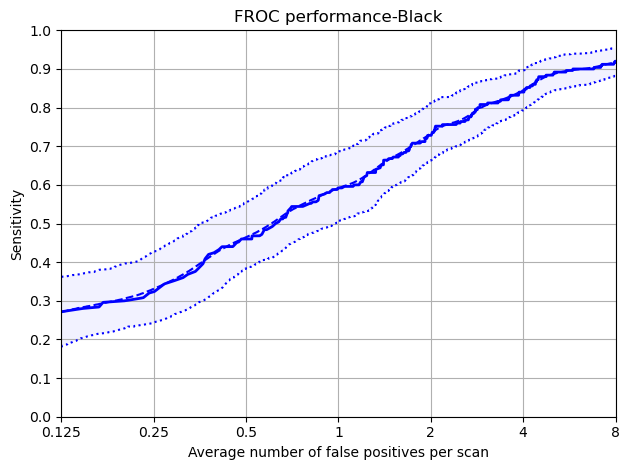

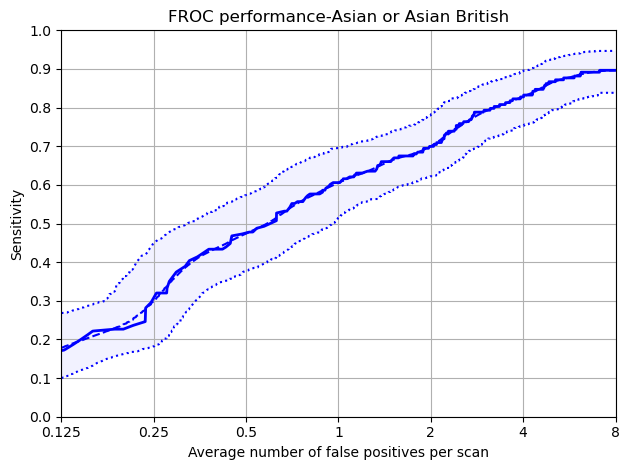

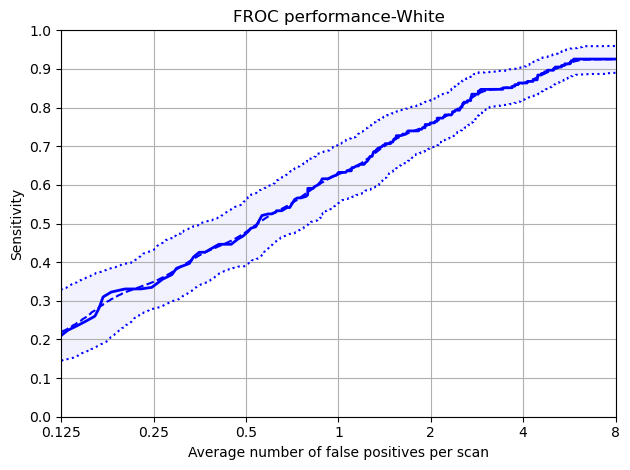

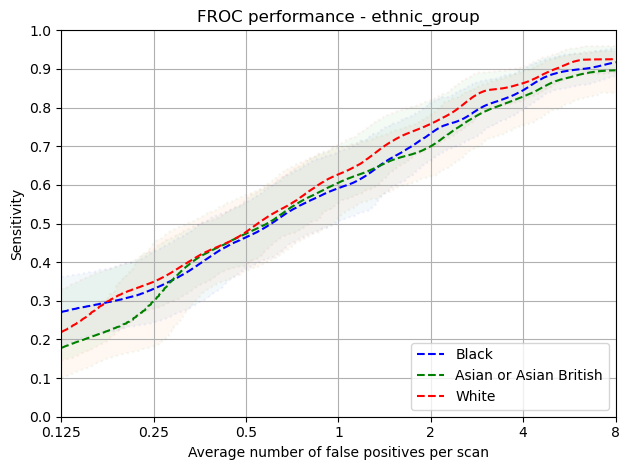

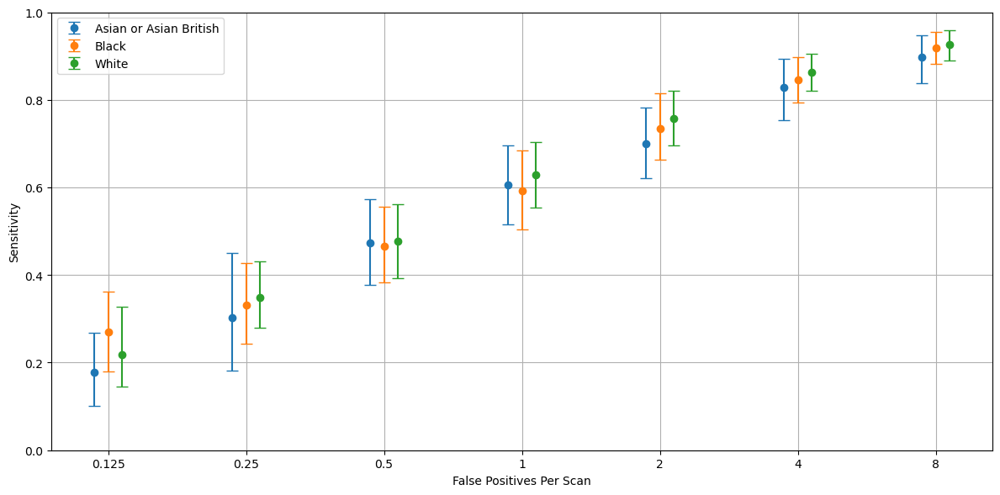

In [ ]:
protected_group = 'ethnic_group'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour,'Ethnic Group', data_dict, order=['Asian or Asian British','Black','White'])

### IMDRank_tertile

Protected Group: Medium


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,24.0,63.0,3.0,7.0,3.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpvfda5yd8/annotations.csv
Total number of included nodule annotations: 235
Total number of nodule annotations: 235
Cases: 192
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:07<00:00, 134.96it/s]


,0,159,476,1111,2381,4920,9999
0,0.197 (0.124 - 0.297),0.323 (0.246 - 0.426),0.49 (0.397 - 0.595),0.64 (0.567 - 0.721),0.761 (0.7 - 0.83),0.893 (0.847 - 0.938),0.956 (0.923 - 0.983)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.197,0.124,0.297
159,0.250,0.323,0.246,0.426
476,0.500,0.490,0.397,0.595
1111,1.000,0.640,0.567,0.721
2381,2.000,0.761,0.700,0.830
4920,4.000,0.893,0.847,0.938
9999,8.000,0.956,0.923,0.983


Mean Sensitivity: 0.61 Low Sensitivity: 0.54 High Sensitivity: 0.684


,True positives,230
0,False positives,7446.000
1,False negatives,5.000
2,True negatives,0.000
3,Total number of candidates,7902.000
4,Total number of nodules,235.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,229.000
7,Sensitivity,0.979
8,Average number of candidates per scan,41.156


Protected Group: Low


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,55.0,4.0,5.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpdvx07xjr/annotations.csv
Total number of included nodule annotations: 281
Total number of nodule annotations: 281
Cases: 246


100%|██████████| 1000/1000 [00:10<00:00, 95.99it/s]


,0,159,476,1111,2381,4920,9999
0,0.237 (0.157 - 0.328),0.339 (0.264 - 0.431),0.453 (0.375 - 0.545),0.59 (0.504 - 0.689),0.749 (0.682 - 0.815),0.838 (0.786 - 0.889),0.906 (0.868 - 0.94)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.237,0.157,0.328
159,0.250,0.339,0.264,0.431
476,0.500,0.453,0.375,0.545
1111,1.000,0.590,0.504,0.689
2381,2.000,0.749,0.682,0.815
4920,4.000,0.838,0.786,0.889
9999,8.000,0.906,0.868,0.940


Mean Sensitivity: 0.59 Low Sensitivity: 0.52 High Sensitivity: 0.662


,True positives,268
0,False positives,9514.000
1,False negatives,13.000
2,True negatives,0.000
3,Total number of candidates,10063.000
4,Total number of nodules,281.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,281.000
7,Sensitivity,0.954
8,Average number of candidates per scan,40.907


Protected Group: High


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,34.0,43.0,3.0,10.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp_5hahkll/annotations.csv
Total number of included nodule annotations: 175
Total number of nodule annotations: 175
Cases: 150
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:06<00:00, 160.23it/s]


,0,159,476,1111,2381,4920,9999
0,0.224 (0.135 - 0.322),0.359 (0.244 - 0.466),0.486 (0.387 - 0.587),0.602 (0.507 - 0.691),0.678 (0.583 - 0.767),0.798 (0.719 - 0.874),0.886 (0.819 - 0.942)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.224,0.135,0.322
159,0.250,0.359,0.244,0.466
476,0.500,0.486,0.387,0.587
1111,1.000,0.602,0.507,0.691
2381,2.000,0.678,0.583,0.767
4920,4.000,0.798,0.719,0.874
9999,8.000,0.886,0.819,0.942


Mean Sensitivity: 0.58 Low Sensitivity: 0.48 High Sensitivity: 0.664


,True positives,168
0,False positives,6235.000
1,False negatives,7.000
2,True negatives,0.000
3,Total number of candidates,6583.000
4,Total number of nodules,175.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,182.000
7,Sensitivity,0.960
8,Average number of candidates per scan,43.887


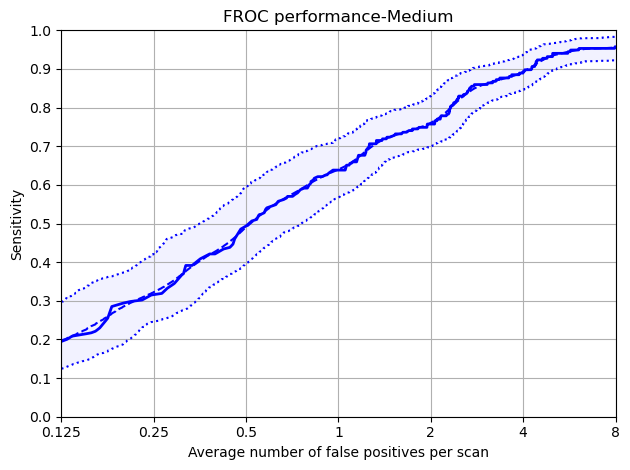

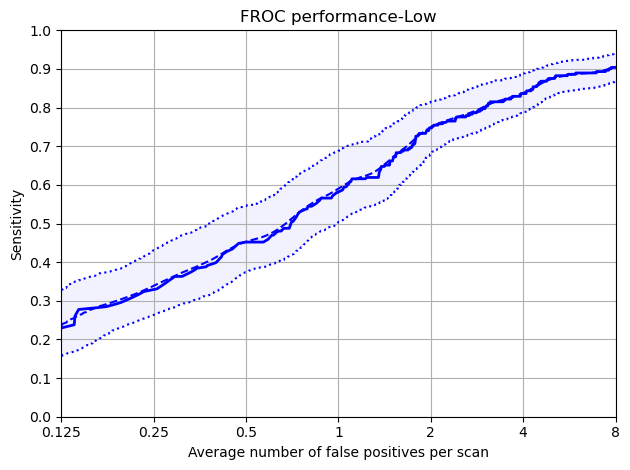

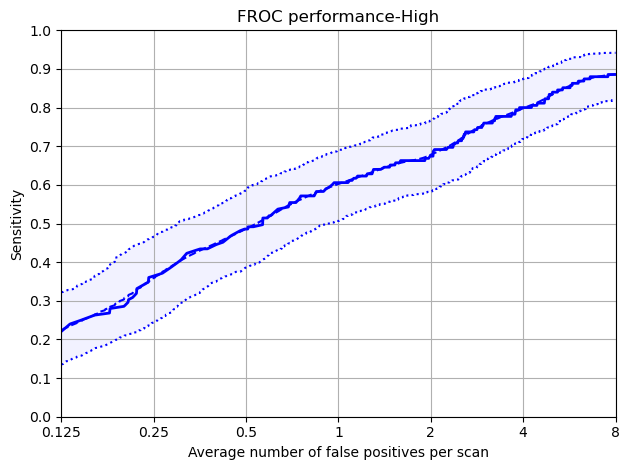

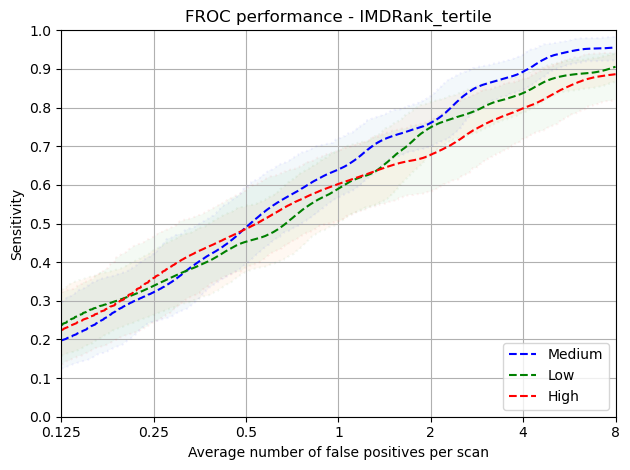

In [ ]:
protected_group = 'IMDRank_tertile'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Smoking Pack Years


Protected Group: Low (15-35)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,54.0,2.0,6.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmptz_vq3a6/annotations.csv
Total number of included nodule annotations: 291
Total number of nodule annotations: 291
Cases: 250
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:09<00:00, 102.89it/s]


,0,159,476,1111,2381,4920,9999
0,0.238 (0.158 - 0.324),0.354 (0.261 - 0.453),0.5 (0.426 - 0.586),0.615 (0.541 - 0.704),0.745 (0.676 - 0.812),0.855 (0.8 - 0.904),0.918 (0.87 - 0.955)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.238,0.158,0.324
159,0.250,0.354,0.261,0.453
476,0.500,0.500,0.426,0.586
1111,1.000,0.615,0.541,0.704
2381,2.000,0.745,0.676,0.812
4920,4.000,0.855,0.800,0.904
9999,8.000,0.918,0.870,0.955


Mean Sensitivity: 0.6 Low Sensitivity: 0.53 High Sensitivity: 0.677


,True positives,279
0,False positives,9691.000
1,False negatives,12.000
2,True negatives,0.000
3,Total number of candidates,10257.000
4,Total number of nodules,291.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,289.000
7,Sensitivity,0.959
8,Average number of candidates per scan,41.028


Protected Group: Medium (35-50)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,29.0,55.0,3.0,6.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp47jwzh9j/annotations.csv
Total number of included nodule annotations: 217
Total number of nodule annotations: 217
Cases: 193
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:07<00:00, 132.48it/s]


,0,159,476,1111,2381,4920,9999
0,0.205 (0.123 - 0.281),0.34 (0.241 - 0.437),0.475 (0.388 - 0.571),0.623 (0.551 - 0.696),0.733 (0.659 - 0.805),0.824 (0.762 - 0.882),0.913 (0.874 - 0.947)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.205,0.123,0.281
159,0.250,0.340,0.241,0.437
476,0.500,0.475,0.388,0.571
1111,1.000,0.623,0.551,0.696
2381,2.000,0.733,0.659,0.805
4920,4.000,0.824,0.762,0.882
9999,8.000,0.913,0.874,0.947


Mean Sensitivity: 0.59 Low Sensitivity: 0.51 High Sensitivity: 0.66


,True positives,210
0,False positives,7549.000
1,False negatives,7.000
2,True negatives,0.000
3,Total number of candidates,8014.000
4,Total number of nodules,217.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,258.000
7,Sensitivity,0.968
8,Average number of candidates per scan,41.523


Protected Group: High (50+)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,28.0,53.0,6.0,9.0,4.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpqoin6qd0/annotations.csv
Total number of included nodule annotations: 187
Total number of nodule annotations: 187
Cases: 151


100%|██████████| 1000/1000 [00:06<00:00, 164.16it/s]


,0,159,476,1111,2381,4920,9999
0,0.215 (0.13 - 0.325),0.332 (0.234 - 0.426),0.436 (0.342 - 0.544),0.59 (0.482 - 0.698),0.718 (0.631 - 0.805),0.862 (0.808 - 0.916),0.91 (0.862 - 0.952)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.215,0.130,0.325
159,0.250,0.332,0.234,0.426
476,0.500,0.436,0.342,0.544
1111,1.000,0.590,0.482,0.698
2381,2.000,0.718,0.631,0.805
4920,4.000,0.862,0.808,0.916
9999,8.000,0.910,0.862,0.952


Mean Sensitivity: 0.58 Low Sensitivity: 0.5 High Sensitivity: 0.667


,True positives,179
0,False positives,6094.000
1,False negatives,8.000
2,True negatives,0.000
3,Total number of candidates,6421.000
4,Total number of nodules,187.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,148.000
7,Sensitivity,0.957
8,Average number of candidates per scan,42.523


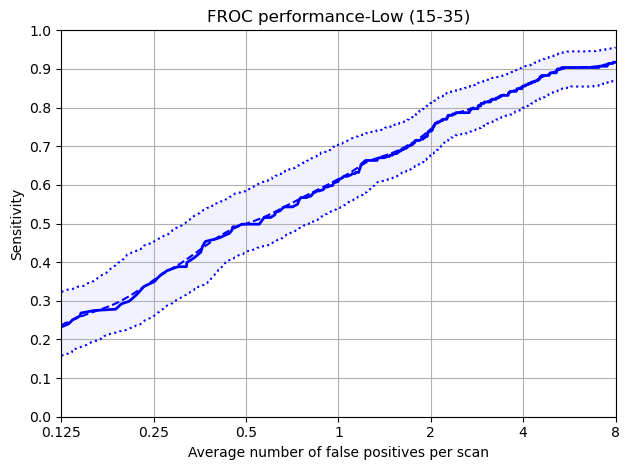

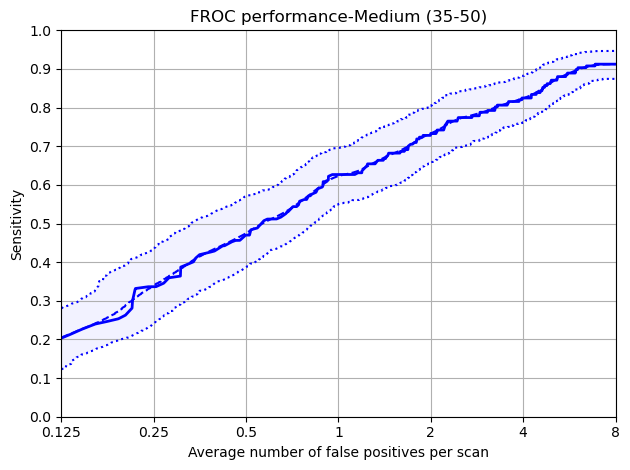

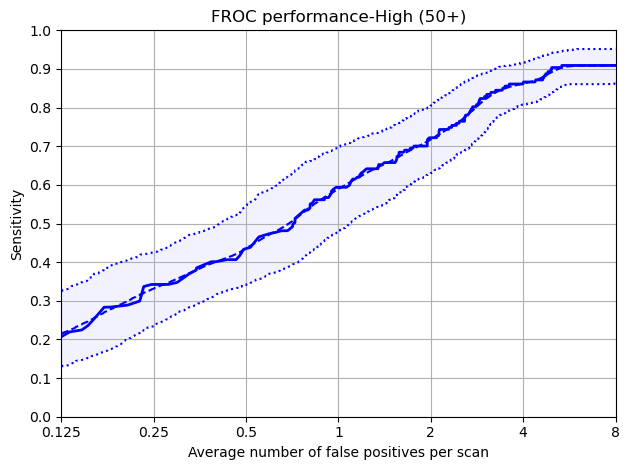

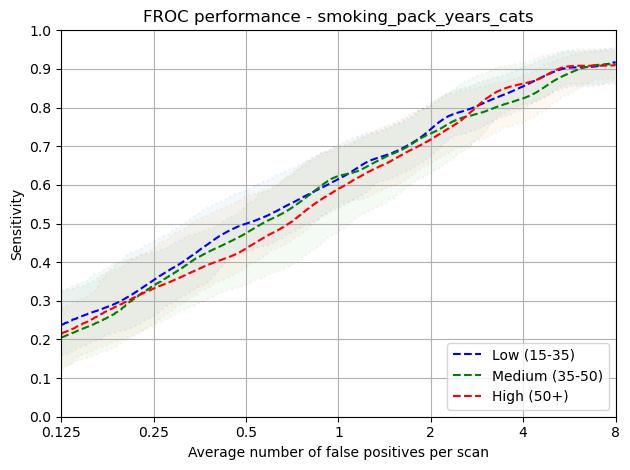

In [ ]:
protected_group = 'smoking_pack_years_cats'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Vs Non-Actionable

Protected Group: Non-Actionable


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,17.0,81.0,2.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpy26huw6x/annotations.csv
Total number of included nodule annotations: 254
Total number of nodule annotations: 254
Cases: 421
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:16<00:00, 61.11it/s]


,0,159,476,1111,2381,4920,9999
0,0.277 (0.204 - 0.349),0.403 (0.328 - 0.491),0.583 (0.519 - 0.65),0.725 (0.668 - 0.782),0.852 (0.801 - 0.904),0.937 (0.906 - 0.969),0.966 (0.941 - 0.988)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.277,0.204,0.349
159,0.250,0.403,0.328,0.491
476,0.500,0.583,0.519,0.650
1111,1.000,0.725,0.668,0.782
2381,2.000,0.852,0.801,0.904
4920,4.000,0.937,0.906,0.969
9999,8.000,0.966,0.941,0.988


Mean Sensitivity: 0.68 Low Sensitivity: 0.62 High Sensitivity: 0.733


,True positives,250
0,False positives,14961.000
1,False negatives,4.000
2,True negatives,0.000
3,Total number of candidates,15358.000
4,Total number of nodules,254.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,150.000
7,Sensitivity,0.984
8,Average number of candidates per scan,36.480


Protected Group: Actonable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,36.0,39.0,6.0,10.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpybj6zhb4/annotations.csv
Total number of included nodule annotations: 441
Total number of nodule annotations: 441
Cases: 172
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:08<00:00, 122.87it/s]


,0,159,476,1111,2381,4920,9999
0,0.185 (0.131 - 0.275),0.296 (0.233 - 0.373),0.393 (0.32 - 0.468),0.527 (0.453 - 0.596),0.645 (0.581 - 0.707),0.768 (0.715 - 0.817),0.873 (0.834 - 0.91)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.185,0.131,0.275
159,0.250,0.296,0.233,0.373
476,0.500,0.393,0.320,0.468
1111,1.000,0.527,0.453,0.596
2381,2.000,0.645,0.581,0.707
4920,4.000,0.768,0.715,0.817
9999,8.000,0.873,0.834,0.910


Mean Sensitivity: 0.53 Low Sensitivity: 0.47 High Sensitivity: 0.592


,True positives,418
0,False positives,8373.000
1,False negatives,23.000
2,True negatives,0.000
3,Total number of candidates,9334.000
4,Total number of nodules,441.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,545.000
7,Sensitivity,0.948
8,Average number of candidates per scan,54.267


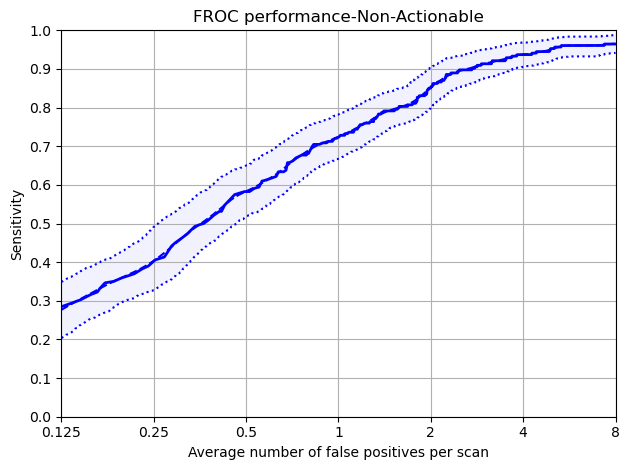

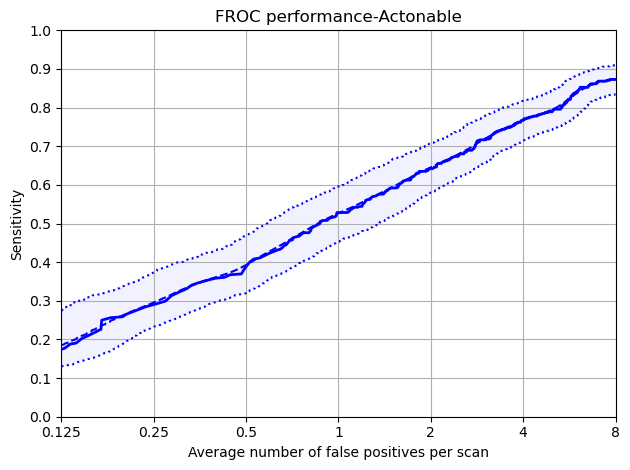

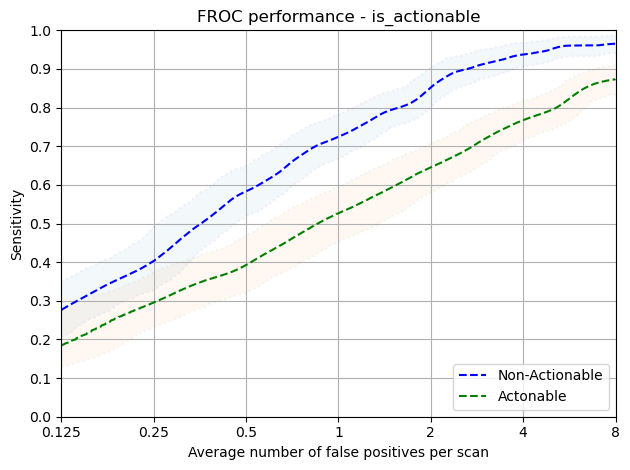

In [ ]:
protected_group = 'is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Gender

Protected Group: Male


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,37.0,43.0,3.0,10.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpgxr9hhbh/annotations.csv
Total number of included nodule annotations: 263
Total number of nodule annotations: 263
Cases: 92
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:04<00:00, 206.49it/s]


,0,159,476,1111,2381,4920,9999
0,0.146 (0.064 - 0.249),0.246 (0.157 - 0.348),0.357 (0.266 - 0.47),0.493 (0.399 - 0.592),0.617 (0.531 - 0.696),0.738 (0.657 - 0.815),0.868 (0.803 - 0.919)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.146,0.064,0.249
159,0.250,0.246,0.157,0.348
476,0.500,0.357,0.266,0.470
1111,1.000,0.493,0.399,0.592
2381,2.000,0.617,0.531,0.696
4920,4.000,0.738,0.657,0.815
9999,8.000,0.868,0.803,0.919


Mean Sensitivity: 0.5 Low Sensitivity: 0.41 High Sensitivity: 0.584


,True positives,252
0,False positives,4667.000
1,False negatives,11.000
2,True negatives,0.000
3,Total number of candidates,5195.000
4,Total number of nodules,263.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,278.000
7,Sensitivity,0.958
8,Average number of candidates per scan,56.467


Protected Group: Female


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,35.0,32.0,9.0,10.0,14.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpqzumn36r/annotations.csv
Total number of included nodule annotations: 178
Total number of nodule annotations: 178
Cases: 81


100%|██████████| 1000/1000 [00:03<00:00, 269.68it/s]


,0,159,476,1111,2381,4920,9999
0,0.257 (0.158 - 0.384),0.37 (0.281 - 0.46),0.44 (0.348 - 0.55),0.575 (0.488 - 0.669),0.685 (0.606 - 0.766),0.787 (0.725 - 0.849),0.869 (0.822 - 0.916)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.257,0.158,0.384
159,0.250,0.370,0.281,0.460
476,0.500,0.440,0.348,0.550
1111,1.000,0.575,0.488,0.669
2381,2.000,0.685,0.606,0.766
4920,4.000,0.787,0.725,0.849
9999,8.000,0.869,0.822,0.916


Mean Sensitivity: 0.57 Low Sensitivity: 0.49 High Sensitivity: 0.656


,True positives,166
0,False positives,3706.000
1,False negatives,12.000
2,True negatives,0.000
3,Total number of candidates,4139.000
4,Total number of nodules,178.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,267.000
7,Sensitivity,0.933
8,Average number of candidates per scan,51.099


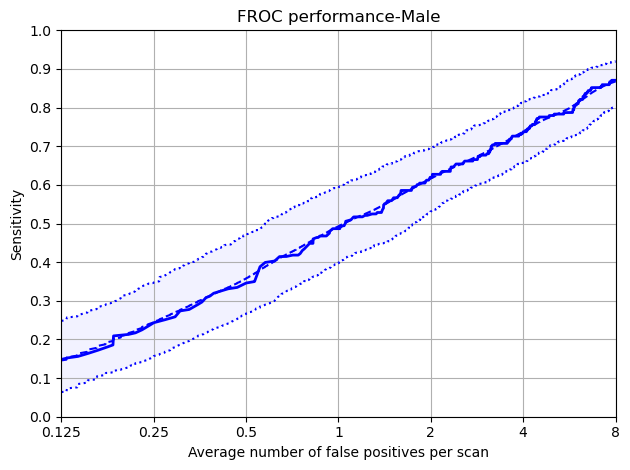

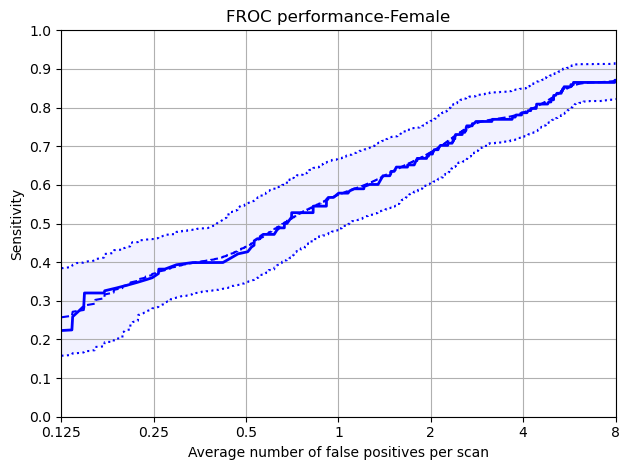

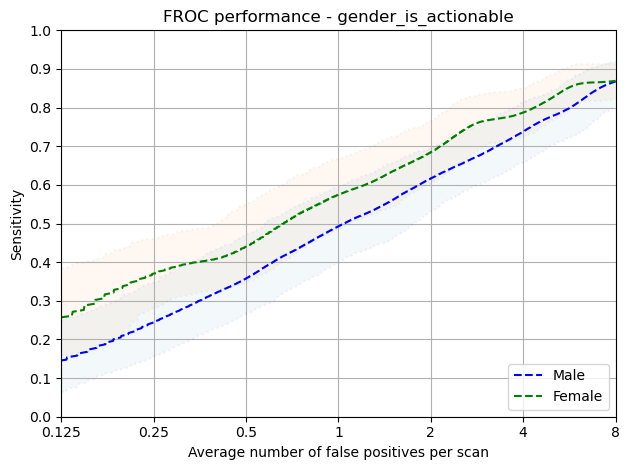

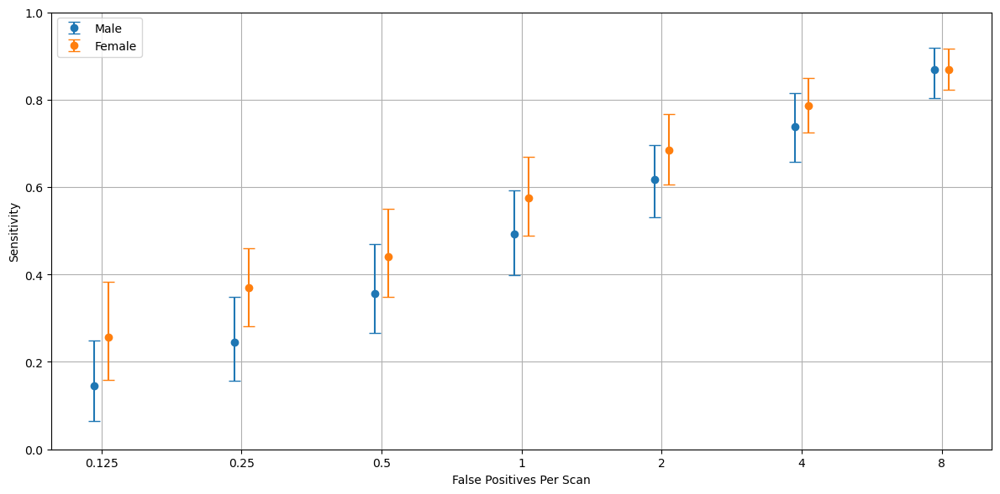

In [ ]:
protected_group = 'gender_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour,'Actionable, Gender', data_dict)

### Non-Actionable Gender

Protected Group: Male


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,18.0,81.0,1.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp58_u3mwc/annotations.csv
Total number of included nodule annotations: 133
Total number of nodule annotations: 133
Cases: 251


100%|██████████| 1000/1000 [00:09<00:00, 110.23it/s]


,0,159,476,1111,2381,4920,9999
0,0.29 (0.176 - 0.408),0.439 (0.342 - 0.556),0.59 (0.506 - 0.675),0.759 (0.677 - 0.831),0.871 (0.793 - 0.939),0.948 (0.907 - 0.984),0.969 (0.935 - 0.993)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.290,0.176,0.408
159,0.250,0.439,0.342,0.556
476,0.500,0.590,0.506,0.675
1111,1.000,0.759,0.677,0.831
2381,2.000,0.871,0.793,0.939
4920,4.000,0.948,0.907,0.984
9999,8.000,0.969,0.935,0.993


Mean Sensitivity: 0.7 Low Sensitivity: 0.62 High Sensitivity: 0.769


,True positives,131
0,False positives,9060.000
1,False negatives,2.000
2,True negatives,0.000
3,Total number of candidates,9271.000
4,Total number of nodules,133.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,80.000
7,Sensitivity,0.985
8,Average number of candidates per scan,36.936


Protected Group: Female


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,16.0,82.0,2.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp4nf6y15d/annotations.csv
Total number of included nodule annotations: 121
Total number of nodule annotations: 121
Cases: 171
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:06<00:00, 165.95it/s]


,0,159,476,1111,2381,4920,9999
0,0.255 (0.164 - 0.359),0.368 (0.266 - 0.485),0.568 (0.449 - 0.679),0.685 (0.596 - 0.772),0.827 (0.745 - 0.908),0.923 (0.876 - 0.967),0.961 (0.922 - 0.991)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.255,0.164,0.359
159,0.250,0.368,0.266,0.485
476,0.500,0.568,0.449,0.679
1111,1.000,0.685,0.596,0.772
2381,2.000,0.827,0.745,0.908
4920,4.000,0.923,0.876,0.967
9999,8.000,0.961,0.922,0.991


Mean Sensitivity: 0.66 Low Sensitivity: 0.57 High Sensitivity: 0.737


,True positives,119
0,False positives,5901.000
1,False negatives,2.000
2,True negatives,0.000
3,Total number of candidates,6087.000
4,Total number of nodules,121.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,70.000
7,Sensitivity,0.983
8,Average number of candidates per scan,35.596


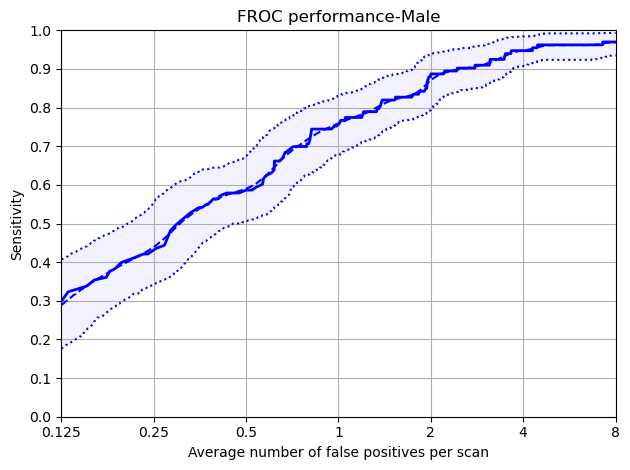

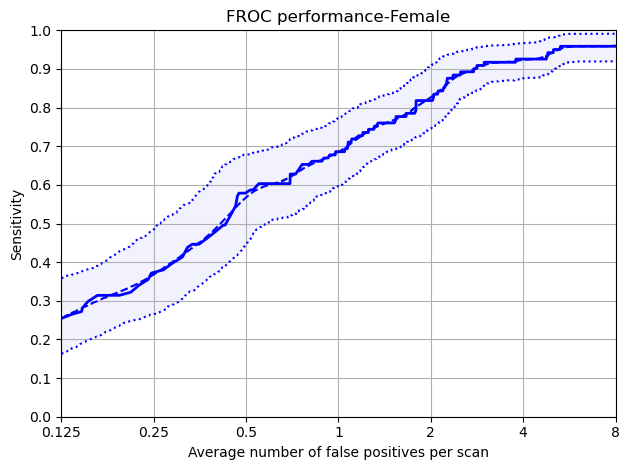

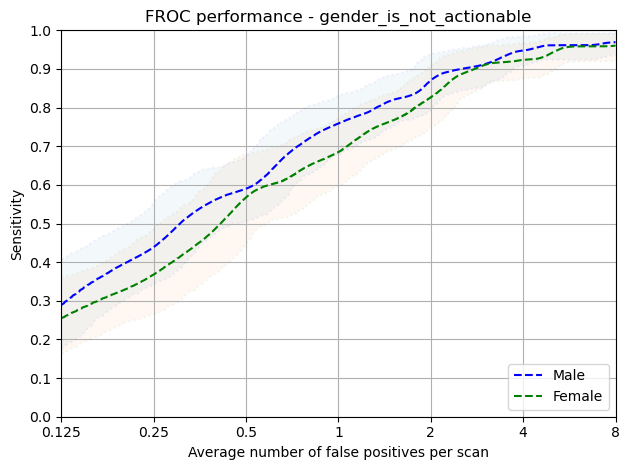

In [ ]:
protected_group = 'gender_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)


### Actionable Ethnic Group

Protected Group: Asian or Asian British


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,33.0,39.0,5.0,15.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp7lx9dvsy/annotations.csv
Total number of included nodule annotations: 130
Total number of nodule annotations: 130
Cases: 59
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:03<00:00, 330.78it/s]


,0,159,476,1111,2381,4920,9999
0,0.129 (0.041 - 0.238),0.219 (0.128 - 0.377),0.371 (0.272 - 0.496),0.494 (0.377 - 0.626),0.584 (0.483 - 0.681),0.689 (0.567 - 0.808),0.819 (0.706 - 0.911)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.129,0.041,0.238
159,0.250,0.219,0.128,0.377
476,0.500,0.371,0.272,0.496
1111,1.000,0.494,0.377,0.626
2381,2.000,0.584,0.483,0.681
4920,4.000,0.689,0.567,0.808
9999,8.000,0.819,0.706,0.911


Mean Sensitivity: 0.47 Low Sensitivity: 0.37 High Sensitivity: 0.591


,True positives,118
0,False positives,2804.000
1,False negatives,12.000
2,True negatives,0.000
3,Total number of candidates,3038.000
4,Total number of nodules,130.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,118.000
7,Sensitivity,0.908
8,Average number of candidates per scan,51.492


Protected Group: Black


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,34.0,50.0,2.0,7.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpon8_b6_q/annotations.csv
Total number of included nodule annotations: 161
Total number of nodule annotations: 161
Cases: 52


100%|██████████| 1000/1000 [00:02<00:00, 382.33it/s]


,0,159,476,1111,2381,4920,9999
0,0.194 (0.089 - 0.313),0.241 (0.149 - 0.373),0.336 (0.212 - 0.496),0.524 (0.384 - 0.657),0.665 (0.566 - 0.783),0.79 (0.71 - 0.876),0.896 (0.841 - 0.947)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.194,0.089,0.313
159,0.250,0.241,0.149,0.373
476,0.500,0.336,0.212,0.496
1111,1.000,0.524,0.384,0.657
2381,2.000,0.665,0.566,0.783
4920,4.000,0.790,0.710,0.876
9999,8.000,0.896,0.841,0.947


Mean Sensitivity: 0.52 Low Sensitivity: 0.42 High Sensitivity: 0.635


,True positives,155
0,False positives,2339.000
1,False negatives,6.000
2,True negatives,0.000
3,Total number of candidates,2663.000
4,Total number of nodules,161.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,169.000
7,Sensitivity,0.963
8,Average number of candidates per scan,51.212


Protected Group: White


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,42.0,25.0,10.0,9.0,14.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpkguiprom/annotations.csv
Total number of included nodule annotations: 150
Total number of nodule annotations: 150
Cases: 63


100%|██████████| 1000/1000 [00:03<00:00, 312.08it/s]


,0,159,476,1111,2381,4920,9999
0,0.299 (0.13 - 0.437),0.41 (0.308 - 0.514),0.491 (0.385 - 0.598),0.579 (0.486 - 0.669),0.708 (0.623 - 0.792),0.803 (0.741 - 0.862),0.898 (0.85 - 0.947)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.299,0.130,0.437
159,0.250,0.410,0.308,0.514
476,0.500,0.491,0.385,0.598
1111,1.000,0.579,0.486,0.669
2381,2.000,0.708,0.623,0.792
4920,4.000,0.803,0.741,0.862
9999,8.000,0.898,0.850,0.947


Mean Sensitivity: 0.6 Low Sensitivity: 0.5 High Sensitivity: 0.688


,True positives,145
0,False positives,3230.000
1,False negatives,5.000
2,True negatives,0.000
3,Total number of candidates,3633.000
4,Total number of nodules,150.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,258.000
7,Sensitivity,0.967
8,Average number of candidates per scan,57.667


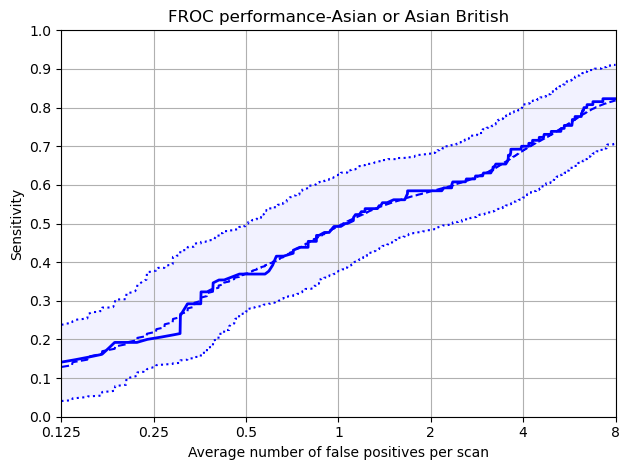

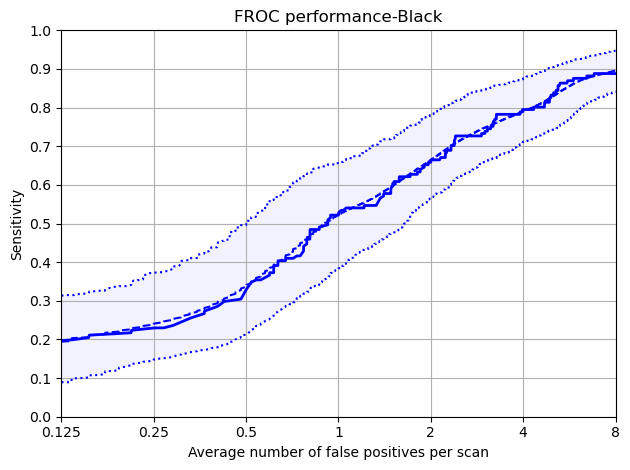

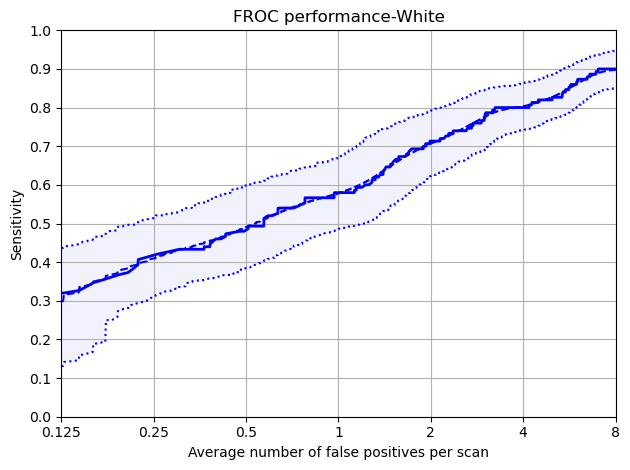

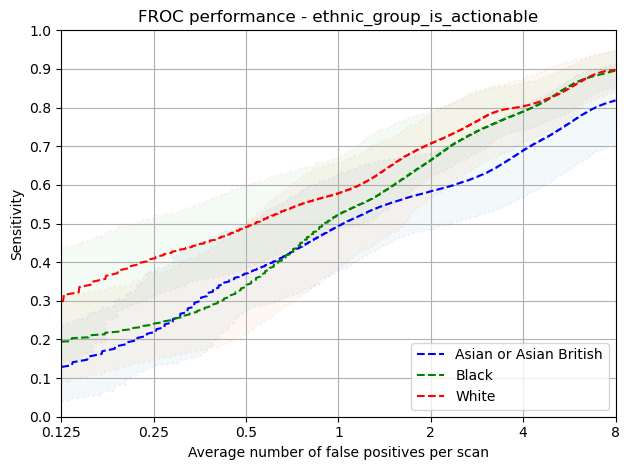

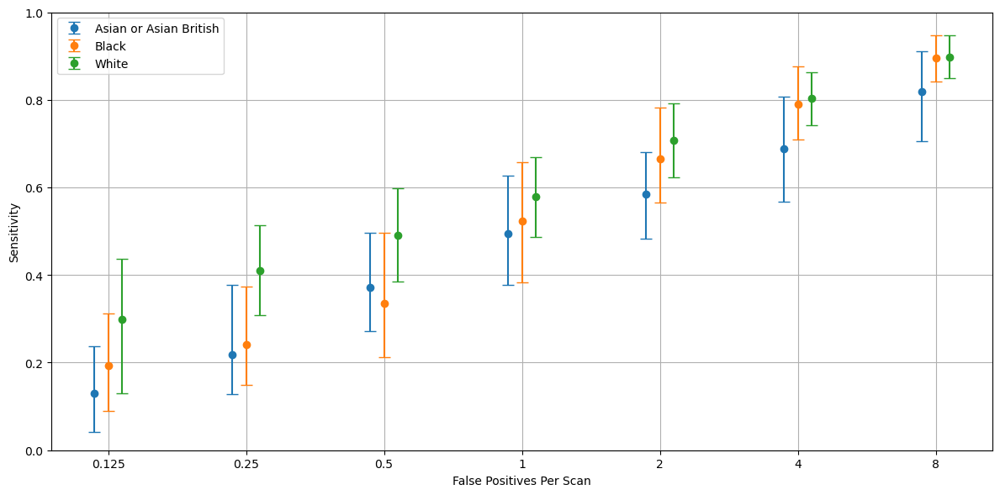

In [ ]:
protected_group = 'ethnic_group_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)
display_plots_with_error_bars('detection', flavour,'Actionable, Ethnic Group', data_dict, order=['Asian or Asian British','Black','White'])

### NonActionable - Ethnic Group

Protected Group: Black


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,13.0,85.0,1.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmphrj5uxoh/annotations.csv
Total number of included nodule annotations: 89
Total number of nodule annotations: 89
Cases: 148


100%|██████████| 1000/1000 [00:05<00:00, 194.10it/s]


,0,159,476,1111,2381,4920,9999
0,0.395 (0.266 - 0.513),0.482 (0.36 - 0.6),0.589 (0.486 - 0.69),0.694 (0.607 - 0.778),0.801 (0.716 - 0.886),0.894 (0.826 - 0.952),0.929 (0.865 - 0.978)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.395,0.266,0.513
159,0.250,0.482,0.360,0.600
476,0.500,0.589,0.486,0.690
1111,1.000,0.694,0.607,0.778
2381,2.000,0.801,0.716,0.886
4920,4.000,0.894,0.826,0.952
9999,8.000,0.929,0.865,0.978


Mean Sensitivity: 0.68 Low Sensitivity: 0.59 High Sensitivity: 0.771


,True positives,86
0,False positives,5200.000
1,False negatives,3.000
2,True negatives,0.000
3,Total number of candidates,5330.000
4,Total number of nodules,89.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,44.000
7,Sensitivity,0.966
8,Average number of candidates per scan,36.014


Protected Group: Asian or Asian British


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,23.0,75.0,1.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpws_1gqbf/annotations.csv
Total number of included nodule annotations: 73
Total number of nodule annotations: 73
Cases: 138


100%|██████████| 1000/1000 [00:04<00:00, 203.67it/s]


,0,159,476,1111,2381,4920,9999
0,0.243 (0.122 - 0.383),0.424 (0.241 - 0.604),0.612 (0.482 - 0.744),0.764 (0.671 - 0.859),0.922 (0.831 - 0.986),0.974 (0.932 - 1.0),1.0 (1.0 - 1.0)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.243,0.122,0.383
159,0.250,0.424,0.241,0.604
476,0.500,0.612,0.482,0.744
1111,1.000,0.764,0.671,0.859
2381,2.000,0.922,0.831,0.986
4920,4.000,0.974,0.932,1.000
9999,8.000,1.000,1.000,1.000


Mean Sensitivity: 0.71 Low Sensitivity: 0.61 High Sensitivity: 0.797


,True positives,73
0,False positives,4800.000
1,False negatives,0.000
2,True negatives,0.000
3,Total number of candidates,4925.000
4,Total number of nodules,73.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,52.000
7,Sensitivity,1.000
8,Average number of candidates per scan,35.688


Protected Group: White


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,15.0,83.0,2.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpjtojwbmq/annotations.csv
Total number of included nodule annotations: 92
Total number of nodule annotations: 92
Cases: 137
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-6683-wks_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:04<00:00, 201.05it/s]


,0,159,476,1111,2381,4920,9999
0,0.225 (0.127 - 0.343),0.349 (0.253 - 0.458),0.498 (0.375 - 0.631),0.716 (0.598 - 0.821),0.834 (0.745 - 0.92),0.946 (0.891 - 0.989),0.973 (0.933 - 1.0)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.225,0.127,0.343
159,0.250,0.349,0.253,0.458
476,0.500,0.498,0.375,0.631
1111,1.000,0.716,0.598,0.821
2381,2.000,0.834,0.745,0.920
4920,4.000,0.946,0.891,0.989
9999,8.000,0.973,0.933,1.000


Mean Sensitivity: 0.65 Low Sensitivity: 0.56 High Sensitivity: 0.737


,True positives,91
0,False positives,4961.000
1,False negatives,1.000
2,True negatives,0.000
3,Total number of candidates,5103.000
4,Total number of nodules,92.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,54.000
7,Sensitivity,0.989
8,Average number of candidates per scan,37.248


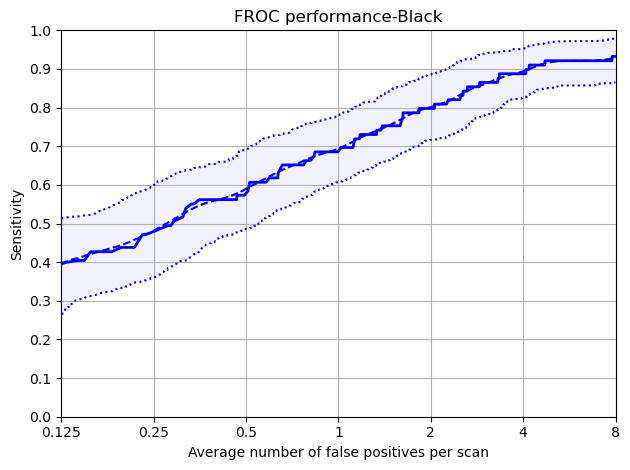

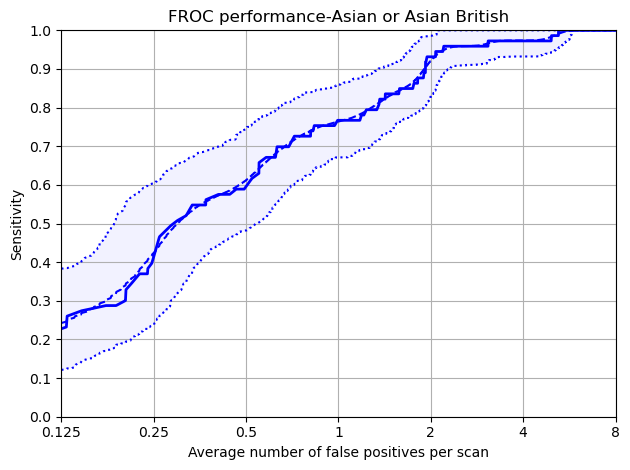

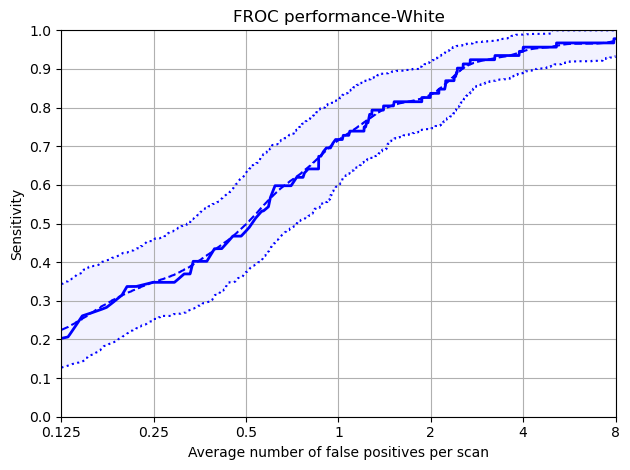

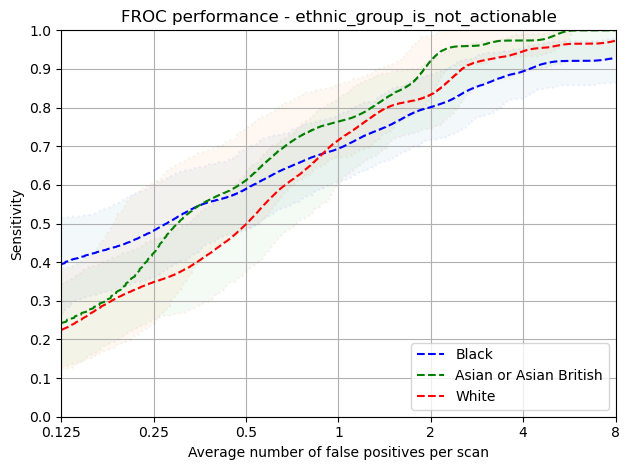

In [ ]:
protected_group = 'ethnic_group_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable IMDRank

Protected Group: High_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,43.0,22.0,5.0,15.0,14.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmptll1zrmd/annotations.csv
Total number of included nodule annotations: 111
Total number of nodule annotations: 111
Cases: 54
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:02<00:00, 351.88it/s]


,0,159,476,1111,2381,4920,9999
0,0.267 (0.175 - 0.385),0.343 (0.237 - 0.459),0.427 (0.301 - 0.571),0.538 (0.418 - 0.651),0.596 (0.469 - 0.717),0.695 (0.574 - 0.798),0.8 (0.695 - 0.887)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.267,0.175,0.385
159,0.250,0.343,0.237,0.459
476,0.500,0.427,0.301,0.571
1111,1.000,0.538,0.418,0.651
2381,2.000,0.596,0.469,0.717
4920,4.000,0.695,0.574,0.798
9999,8.000,0.800,0.695,0.887


Mean Sensitivity: 0.52 Low Sensitivity: 0.41 High Sensitivity: 0.638


,True positives,104
0,False positives,2640.000
1,False negatives,7.000
2,True negatives,0.000
3,Total number of candidates,2890.000
4,Total number of nodules,111.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,148.000
7,Sensitivity,0.937
8,Average number of candidates per scan,53.519


Protected Group: Medium_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,32.0,43.0,7.0,12.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpktjetrbh/annotations.csv
Total number of included nodule annotations: 121
Total number of nodule annotations: 121
Cases: 49


100%|██████████| 1000/1000 [00:02<00:00, 392.85it/s]


,0,159,476,1111,2381,4920,9999
0,0.172 (0.055 - 0.388),0.29 (0.128 - 0.438),0.393 (0.263 - 0.528),0.496 (0.386 - 0.632),0.673 (0.585 - 0.767),0.804 (0.714 - 0.886),0.923 (0.857 - 0.974)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.172,0.055,0.388
159,0.250,0.290,0.128,0.438
476,0.500,0.393,0.263,0.528
1111,1.000,0.496,0.386,0.632
2381,2.000,0.673,0.585,0.767
4920,4.000,0.804,0.714,0.886
9999,8.000,0.923,0.857,0.974


Mean Sensitivity: 0.54 Low Sensitivity: 0.43 High Sensitivity: 0.659


,True positives,116
0,False positives,2438.000
1,False negatives,5.000
2,True negatives,0.000
3,Total number of candidates,2710.000
4,Total number of nodules,121.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,156.000
7,Sensitivity,0.959
8,Average number of candidates per scan,55.306


Protected Group: Low_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,35.0,46.0,5.0,5.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmph_pxd0fg/annotations.csv
Total number of included nodule annotations: 206
Total number of nodule annotations: 206
Cases: 69


100%|██████████| 1000/1000 [00:03<00:00, 288.78it/s]


,0,159,476,1111,2381,4920,9999
0,0.174 (0.06 - 0.307),0.291 (0.181 - 0.418),0.405 (0.288 - 0.536),0.543 (0.425 - 0.661),0.671 (0.561 - 0.767),0.791 (0.721 - 0.855),0.889 (0.844 - 0.933)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.174,0.060,0.307
159,0.250,0.291,0.181,0.418
476,0.500,0.405,0.288,0.536
1111,1.000,0.543,0.425,0.661
2381,2.000,0.671,0.561,0.767
4920,4.000,0.791,0.721,0.855
9999,8.000,0.889,0.844,0.933


Mean Sensitivity: 0.54 Low Sensitivity: 0.44 High Sensitivity: 0.64


,True positives,197
0,False positives,3234.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,3670.000
4,Total number of nodules,206.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,239.000
7,Sensitivity,0.956
8,Average number of candidates per scan,53.188


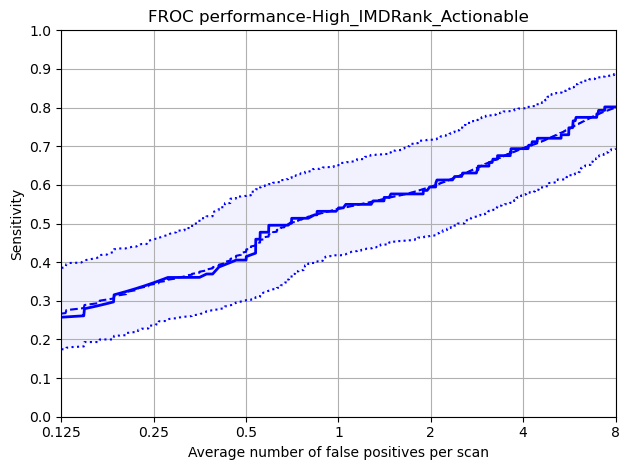

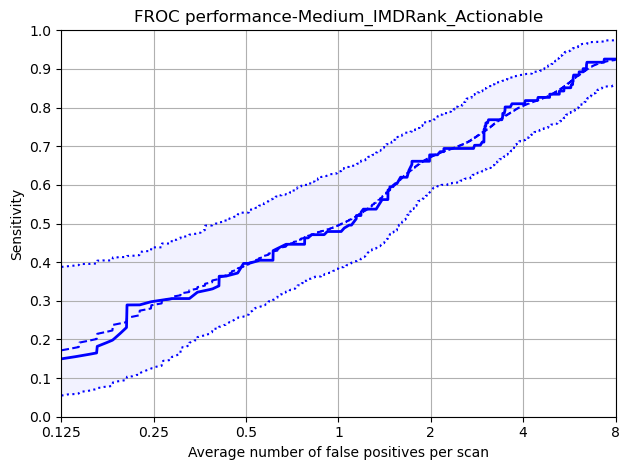

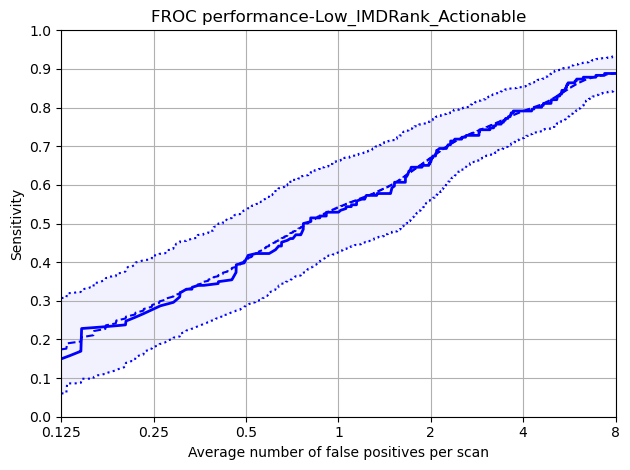

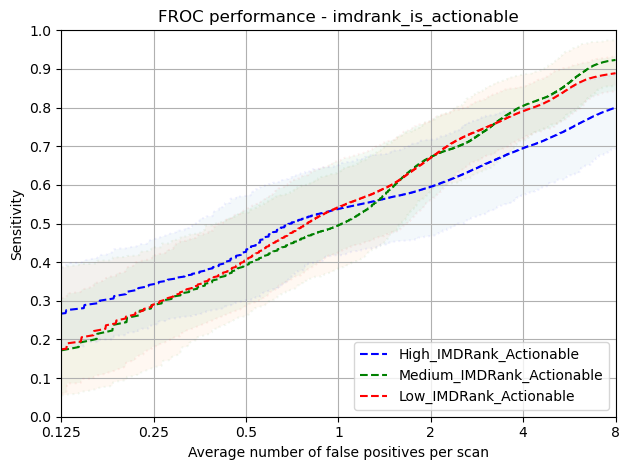

In [ ]:
protected_group = 'imdrank_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)

### Actionable Smoking Status

Protected Group: Low_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,38.0,38.0,4.0,9.0,11.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp86ca_b1x/annotations.csv
Total number of included nodule annotations: 181
Total number of nodule annotations: 181
Cases: 71
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None
This is strange: CAD mark None detected two nodules! Check for overlapping nodule annotations, SeriesUID: summit-2323-kha_Y0_BASELINE_A, nodule Annot ID: None


100%|██████████| 1000/1000 [00:03<00:00, 263.78it/s]


,0,159,476,1111,2381,4920,9999
0,0.179 (0.094 - 0.292),0.273 (0.162 - 0.43),0.409 (0.282 - 0.542),0.529 (0.421 - 0.647),0.638 (0.546 - 0.73),0.762 (0.671 - 0.85),0.87 (0.788 - 0.93)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.179,0.094,0.292
159,0.250,0.273,0.162,0.430
476,0.500,0.409,0.282,0.542
1111,1.000,0.529,0.421,0.647
2381,2.000,0.638,0.546,0.730
4920,4.000,0.762,0.671,0.850
9999,8.000,0.870,0.788,0.930


Mean Sensitivity: 0.52 Low Sensitivity: 0.42 High Sensitivity: 0.632


,True positives,171
0,False positives,3576.000
1,False negatives,10.000
2,True negatives,0.000
3,Total number of candidates,3968.000
4,Total number of nodules,181.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,223.000
7,Sensitivity,0.945
8,Average number of candidates per scan,55.887


Protected Group: High_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,34.0,39.0,9.0,13.0,6.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpvog5tru1/annotations.csv
Total number of included nodule annotations: 127
Total number of nodule annotations: 127
Cases: 50


100%|██████████| 1000/1000 [00:02<00:00, 375.48it/s]


,0,159,476,1111,2381,4920,9999
0,0.233 (0.109 - 0.407),0.337 (0.193 - 0.464),0.387 (0.287 - 0.515),0.517 (0.386 - 0.657),0.661 (0.559 - 0.77),0.793 (0.704 - 0.871),0.862 (0.784 - 0.922)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.233,0.109,0.407
159,0.250,0.337,0.193,0.464
476,0.500,0.387,0.287,0.515
1111,1.000,0.517,0.386,0.657
2381,2.000,0.661,0.559,0.770
4920,4.000,0.793,0.704,0.871
9999,8.000,0.862,0.784,0.922


Mean Sensitivity: 0.54 Low Sensitivity: 0.43 High Sensitivity: 0.658


,True positives,119
0,False positives,2470.000
1,False negatives,8.000
2,True negatives,0.000
3,Total number of candidates,2705.000
4,Total number of nodules,127.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,116.000
7,Sensitivity,0.937
8,Average number of candidates per scan,54.100


Protected Group: Medium_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,36.0,38.0,5.0,10.0,11.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmparc2et7s/annotations.csv
Total number of included nodule annotations: 133
Total number of nodule annotations: 133
Cases: 53


100%|██████████| 1000/1000 [00:02<00:00, 384.77it/s]


,0,159,476,1111,2381,4920,9999
0,0.134 (0.005 - 0.308),0.299 (0.159 - 0.435),0.402 (0.298 - 0.529),0.541 (0.419 - 0.667),0.645 (0.535 - 0.766),0.745 (0.655 - 0.836),0.888 (0.833 - 0.938)


,fps,mean_sens,low_sens,high_sens
0,0.125,0.134,0.005,0.308
159,0.250,0.299,0.159,0.435
476,0.500,0.402,0.298,0.529
1111,1.000,0.541,0.419,0.667
2381,2.000,0.645,0.535,0.766
4920,4.000,0.745,0.655,0.836
9999,8.000,0.888,0.833,0.938


Mean Sensitivity: 0.52 Low Sensitivity: 0.41 High Sensitivity: 0.64


,True positives,128
0,False positives,2327.000
1,False negatives,5.000
2,True negatives,0.000
3,Total number of candidates,2661.000
4,Total number of nodules,133.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,206.000
7,Sensitivity,0.962
8,Average number of candidates per scan,50.208


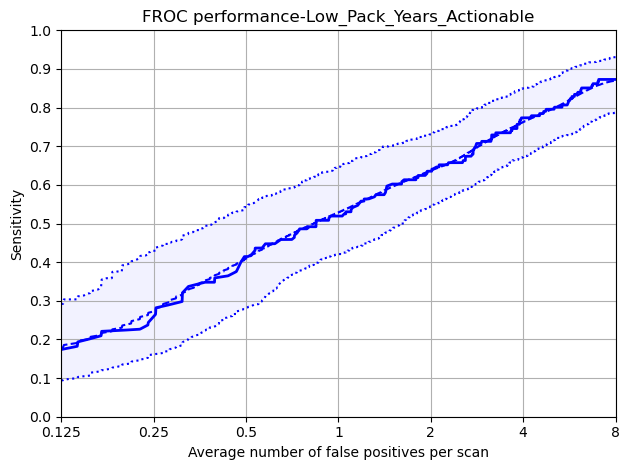

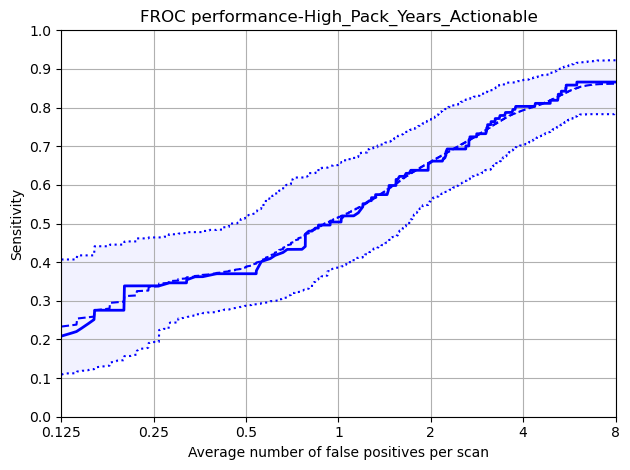

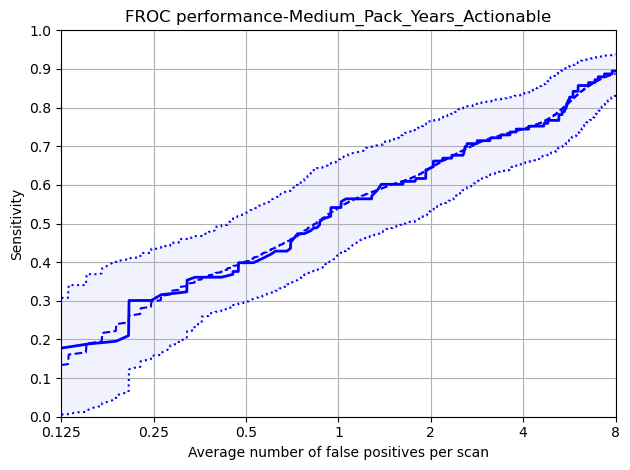

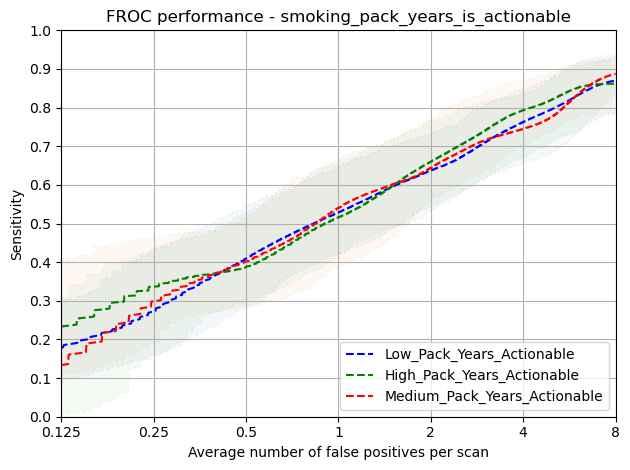

In [ ]:
protected_group = 'smoking_pack_years_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/{flavour}/{protected_group}'
)


### False Positive and Miss Analysis


In [ ]:
thresholds = utils.get_thresholds(detection_summit_summit)
print(thresholds)
missed_metadata = utils.miss_anaysis_at_fpps(
    model='detection',
    scans_metadata=scan_metadata,
    scans_path=f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv',
    annotations_path=f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv',
    exclusions_path=f'{workspace_path}/data/summit/metadata/annotations_excluded_empty.csv',
    predictions_path=detection_predictions_path,
    thresholds=thresholds
)

[0.994140625, 0.9892578125, 0.9814453125, 0.9638671875, 0.9189453125, 0.7685546875, 0.42529296875]
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/test_balanced/annotations.csv
Total number of included nodule annotations: 699
Total number of nodule annotations: 699
Cases: 595
Missed Annotations at 0.994140625 FPPs: 562
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/test_balanced/annotations.csv
Total number of included nodule annotations: 699
Total number of nodule annotations: 699
Cases: 595
Missed Annotations at 0.9892578125 FPPs: 475
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/test_balanced/annotations.csv
Total number of included nodule annotations: 699
Total number of nodule annotations: 699
Cases: 595
Missed Annotations at 0.9814453125 FPPs: 373
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_sum

In [ ]:
hit_and_miss_dict = utils.get_protected_group_by_nodule_type(missed_metadata)

#### Incremental FROC Scores - Gender/ Ethnic Group / Nodule Type

In [ ]:

# display(hit_and_miss_dict[0])
recode_dict = {}
for idx in range(7):
    hmm = {}
    for slice in ['all','actionable']:
        for protected_group in ['MALE','FEMALE','All', 'Asian or Asian British', 'Black', 'White']:
            for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:
            
                try:

                    group = 'gender' if protected_group in ['MALE','FEMALE','All'] else 'ethnic_group'

                    total = hit_and_miss_dict[idx][slice][group][(True,type)][protected_group] + hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    hits = hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    perc_hits = round(100 * (hits/total),0)

                    hmm[f'{slice}_{protected_group}_{type}_Hits%'] = perc_hits
                except:
                    print(f'Error: {idx}, {slice}, {protected_group}, {type}')
                    hmm[f'{slice}_{protected_group}_{type}_Hits%'] = 100
                    

    recode_dict[idx] = hmm

pd.DataFrame.from_dict(recode_dict, orient='index').head(7)

df = pd.DataFrame.from_dict(recode_dict, orient='index').head(7)

# Remove ".0" from each value in the dataframe
df = df.applymap(lambda x: str(x).replace('.0', ''))

# Collapse each column into comma-delimited values
collapsed_df = df.apply(lambda x: ', '.join(x), axis=0)

display(collapsed_df)

from scipy.stats import shapiro, ttest_ind, mannwhitneyu

def calculate_significant_differences(df, group1_name, group2_name):

    group1 = df[group1_name].astype(int).values
    group2 = df[group2_name].astype(int).values

    shapiro_group1 = shapiro(group1)
    shapiro_group2 = shapiro(group2)

    print('*'*50)
    if shapiro_group1[1] > 0.05 and shapiro_group2[1] > 0.05:
        t_test = ttest_ind(group1, group2)
        print(f'Independent T-Test: {round(t_test.statistic,3)}, {round(t_test.pvalue,3)}')
    else:
        manwhitney = mannwhitneyu(group1, group2)
        print(f'Mann-Whitney U Test: {round(manwhitney.statistic,3)}, {round(manwhitney.pvalue,3)}')

a='White'
b='Black'

for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:

    print(f'*** all {type} ***')
    group1 = f'all_{a}_{type}_Hits%'
    group2 = f'all_{b}_{type}_Hits%'
    calculate_significant_differences(df, group1, group2)

for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:

    print(f'*** actionable {type} ***')
    group1 = f'actionable_{a}_{type}_Hits%'
    group2 = f'actionable_{b}_{type}_Hits%'
    calculate_significant_differences(df, group1, group2)

Error: 6, all, MALE, PART_SOLID
Error: 6, all, FEMALE, PART_SOLID
Error: 6, all, All, PART_SOLID
Error: 6, all, Asian or Asian British, PART_SOLID
Error: 6, all, Black, PART_SOLID
Error: 6, all, White, PART_SOLID
Error: 6, actionable, MALE, PART_SOLID
Error: 6, actionable, FEMALE, PART_SOLID
Error: 6, actionable, All, PART_SOLID
Error: 6, actionable, Asian or Asian British, PART_SOLID
Error: 6, actionable, Black, PART_SOLID
Error: 6, actionable, White, PART_SOLID


all_MALE_SOLID_Hits%                                     27, 45, 60, 69, 80, 86, 95
all_MALE_NON_SOLID_Hits%                                   4, 7, 14, 14, 21, 32, 54
all_MALE_PART_SOLID_Hits%                               0, 22, 33, 56, 78, 100, 100
all_MALE_PERIFISSURAL_Hits%                              17, 28, 46, 64, 77, 92, 97
all_MALE_CALCIFIED_Hits%                                    0, 0, 6, 12, 25, 31, 56
all_FEMALE_SOLID_Hits%                                   35, 46, 56, 69, 80, 84, 89
all_FEMALE_NON_SOLID_Hits%                                  0, 0, 0, 10, 24, 52, 62
all_FEMALE_PART_SOLID_Hits%                              6, 25, 25, 56, 69, 81, 100
all_FEMALE_PERIFISSURAL_Hits%                            22, 36, 54, 66, 82, 92, 96
all_FEMALE_CALCIFIED_Hits%                                4, 20, 32, 48, 52, 80, 80
all_All_SOLID_Hits%                                      30, 45, 58, 69, 80, 85, 93
all_All_NON_SOLID_Hits%                                     2, 4, 8, 12, 22,

*** all SOLID ***
**************************************************
Independent T-Test: -0.166, 0.871
*** all NON_SOLID ***
**************************************************
Mann-Whitney U Test: 17.0, 0.365
*** all PART_SOLID ***
**************************************************
Independent T-Test: -0.423, 0.68
*** all PERIFISSURAL ***
**************************************************
Independent T-Test: 0.786, 0.447
*** all CALCIFIED ***
**************************************************
Mann-Whitney U Test: 38.0, 0.095
*** actionable SOLID ***
**************************************************
Independent T-Test: -0.032, 0.975
*** actionable NON_SOLID ***
**************************************************
Mann-Whitney U Test: 17.0, 0.365
*** actionable PART_SOLID ***
**************************************************
Independent T-Test: -0.423, 0.68
*** actionable PERIFISSURAL ***
**************************************************
Independent T-Test: 1.25, 0.235
*** actionable CA

#### Nodule Characteristic Analysis

,0-4mm,4-8mm,8-15mm,15-20mm,20-30mm,30-40mm,40+mm
0.125,0.03,0.24,0.20,0.08,0.05,0.00,0.0
0.25,0.08,0.38,0.34,0.19,0.14,0.29,0.0
0.5,0.14,0.54,0.48,0.35,0.14,0.29,0.5
1,0.30,0.69,0.58,0.46,0.27,0.57,0.5
2,0.55,0.79,0.72,0.62,0.45,0.71,0.5
4,0.79,0.89,0.83,0.65,0.68,0.71,0.5
8,0.88,0.94,0.91,0.85,0.82,1.00,0.5
Total Annotations,5.00,66.00,100.00,26.00,22.00,7.00,2.0


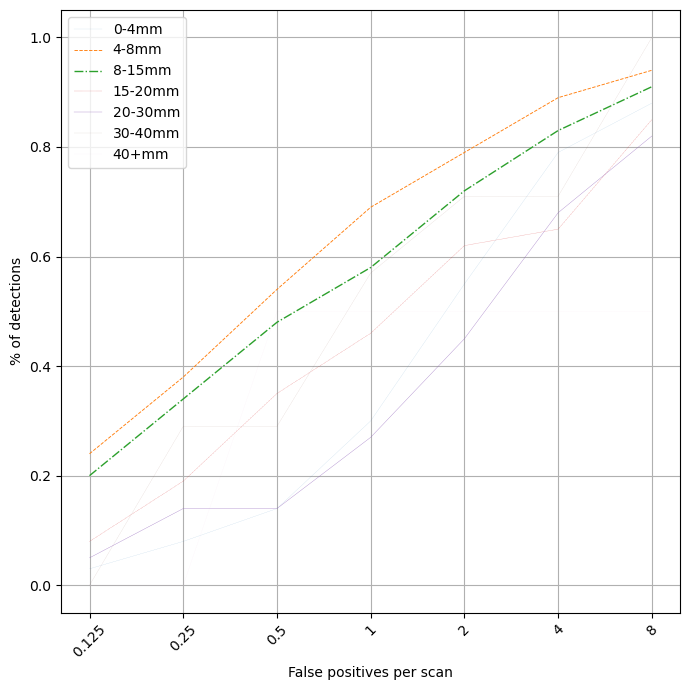

,SOLID,NON_SOLID,PART_SOLID,CALCIFIED
0.125,0.30,0.02,0.04,0.02
0.25,0.45,0.04,0.24,0.12
0.5,0.58,0.08,0.28,0.22
1,0.69,0.12,0.56,0.34
2,0.80,0.22,0.72,0.41
4,0.85,0.41,0.88,0.61
8,0.93,0.57,1.00,0.71
Total Annotations,121.00,43.00,25.00,41.00


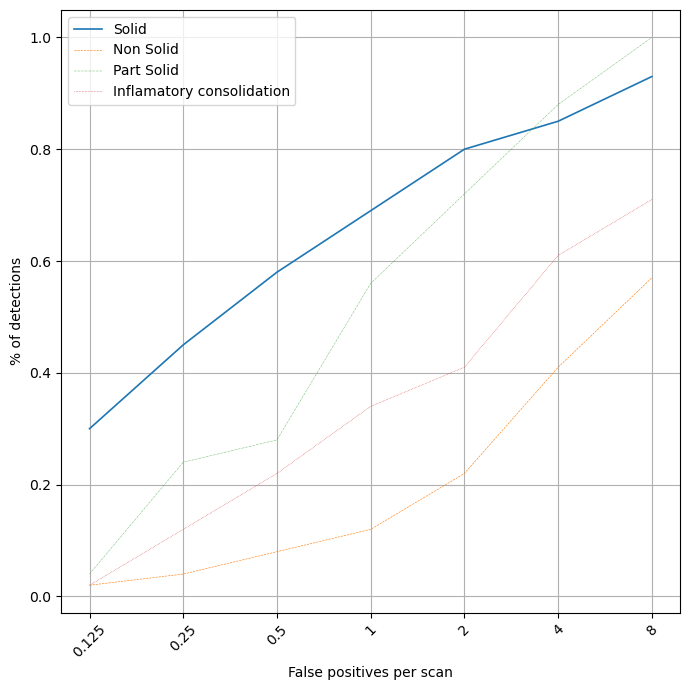

,LEFT_LOWER_LOBE,LEFT_UPPER_LOBE,RIGHT_UPPER_LOBE,RIGHT_LOWER_LOBE
0.125,0.24,0.20,0.18,0.17
0.25,0.35,0.32,0.27,0.31
0.5,0.53,0.45,0.38,0.46
1,0.63,0.50,0.61,0.60
2,0.72,0.68,0.71,0.75
4,0.82,0.82,0.80,0.84
8,0.89,0.92,0.90,0.91
Total Annotations,29.00,46.00,71.00,46.00


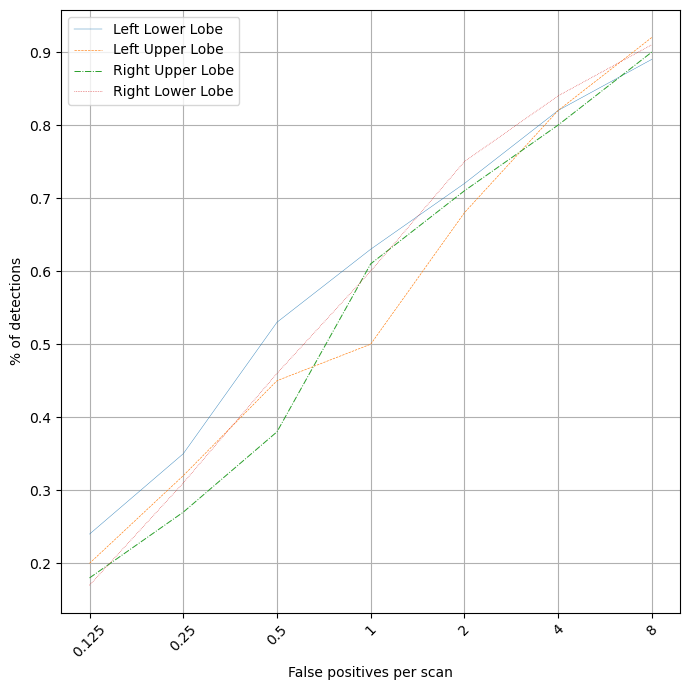

In [ ]:

def cleanup(s):
    if s == 'CALCIFIED':
         return 'Inflamatory consolidation'
    
    s = s.replace('_', ' ')
    s = ' '.join(word.capitalize() for word in s.split())
    return s



nodule_characteristics = {
    'diameter_cats': diameter_lbs,
    'nodule_type': ['SOLID', 'NON_SOLID', 'PART_SOLID', 'CALCIFIED'],
    'nodule_site': [ 'LEFT_LOWER_LOBE', 'LEFT_MIDDLE_LOBE', 'LEFT_UPPER_LOBE', 'RIGHT_UPPER_LOBE', 'RIGHT_LOWER_LOBE']
}

for ivx, (var, order) in enumerate(nodule_characteristics.items()):
    annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/{flavour}/{flavour}_metadata.csv')
    annotations = annotations[annotations['management_plan'] != 'RANDOMISATION_AT_YEAR_1']

    total_vc = annotations[var].value_counts().sort_index().rename('Total Annotations')

    operating_points = ['0.125', '0.25', '0.5', '1', '2', '4', '8']

    results = []

    for idx, metadata in enumerate(missed_metadata):
        results.append(
            pd.crosstab(
                metadata[var], 
                metadata['miss'],
                normalize='index'
            )[False]
            .rename(f'{operating_points[idx]}')
            .reindex(order)
            
        )

    df = pd.concat(results, axis=1).fillna(0).round(2).merge(total_vc.to_frame(), left_index=True, right_index=True)

    display(df.T)

    fig, ax = plt.subplots(1, 1, figsize=(7, 7))
    line_styles = ['-', '--', '-.', ':', '-', '--', '-.']
    weights = df.pop('Total Annotations')

    for isx, column in enumerate(df.T):    
            ax.plot(df.T[column], label=cleanup(column), linestyle=line_styles[isx], linewidth=weights[isx]/100)
    
    ax.set_xticklabels(labels=df.columns, rotation=45)
    ax.legend()
    ax.set_xlabel('False positives per scan')
    ax.set_ylabel('% of detections')
    ax.grid(visible=True, which='both')

    plt.tight_layout()
    plt.savefig(f'{workspace_path}/miccai_fair_ai/detection_detected_nodule_characteristics_{column}.png')
    plt.show()

,FEMALE,MALE,Total
"(CALCIFIED, 3_MONTH_FOLLOW_UP_SCAN)",25 (8.4%),16 (4.0%),41 (5.9%)
"(NON_SOLID, ALWAYS_SCAN_AT_YEAR_1)",18 (6.0%),25 (6.2%),43 (6.2%)
"(NON_SOLID, RANDOMISATION_AT_YEAR_1)",3 (1.0%),3 (0.8%),6 (0.9%)
"(PART_SOLID, 3_MONTH_FOLLOW_UP_SCAN)",16 (5.4%),9 (2.2%),25 (3.6%)
"(PERIFISSURAL, RANDOMISATION_AT_YEAR_1)",156 (52.2%),225 (56.2%),381 (54.5%)
"(SOLID, 3_MONTH_FOLLOW_UP_SCAN)",35 (11.7%),56 (14.0%),91 (13.0%)
"(SOLID, RANDOMISATION_AT_YEAR_1)",30 (10.0%),52 (13.0%),82 (11.7%)
"(SOLID, URGENT_REFERRAL)",16 (5.4%),14 (3.5%),30 (4.3%)
Total,299,400,699


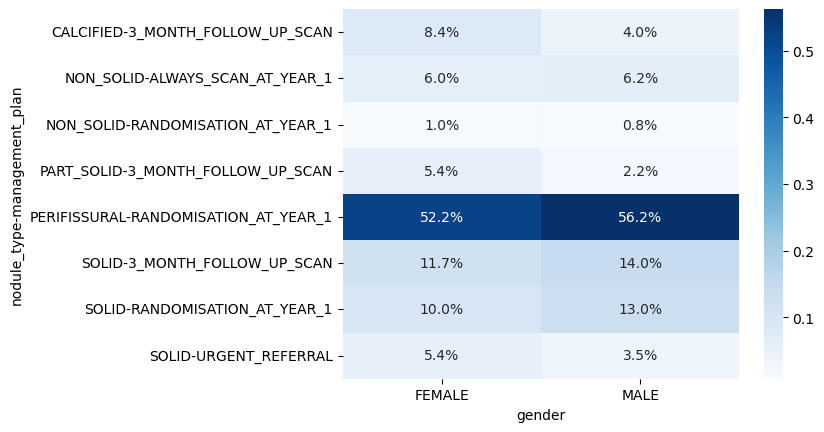

In [ ]:
# Check what nodules have been missed by gender


missed_metadata_at_2fpps = missed_metadata[4]

def crosstab_with_percentages(rows, columns, x_order=None, y_order=None, table=False, heatmap=False):
    # Create the crosstab with absolutes
    cols = [c.astype(str) for c in columns]
    rows = [r.astype(str) for r in rows]

    xabs = pd.crosstab(rows, cols).fillna(0)
    xperc = pd.crosstab(rows, cols, normalize='columns').fillna(0)

    if x_order:
        xabs = xabs.reindex(x_order, axis=1)
        xperc = xperc.reindex(x_order, axis=1)

    if y_order:
        xabs = xabs.reindex(y_order)
        xperc = xperc.reindex(y_order)

    combined_data = {}

    for (adx, rabs), (pdx, rperc) in zip(xabs.iterrows(), xperc.iterrows()):

        row_data = {}
        row_total = 0

        for col in xabs.columns:
            row_data[col] = f"{rabs[col]} ({rperc[col]:.1%})"
            row_total += rabs[col]

        row_data['Total'] = f'{row_total} ({row_total / xabs.sum().sum():.1%})'
        combined_data[adx] = row_data

    row_data = {}
    row_total = 0
    for col in xabs.columns:
        row_data[col] = f'{sum(xabs[col])}'
        row_total += xabs[col].sum()

    row_data['Total'] = row_total
    combined_data['Total'] = row_data

    if table:
        display(pd.DataFrame.from_dict(combined_data).T)
        
    
    if heatmap:
        sns.heatmap(xperc, annot=True, fmt=".1%", cmap='Blues')
        plt.show()

    return xperc, pd.DataFrame.from_dict(combined_data)

_ = crosstab_with_percentages(
    [missed_metadata_at_2fpps['nodule_type'], missed_metadata_at_2fpps['management_plan']],
    [missed_metadata_at_2fpps['gender']],
    table=True,
    heatmap=True)

In [ ]:
scans = pd.read_csv(f'{workspace_path}/metadata/summit/{flavour}/test_scans.csv')
predictions = pd.read_csv(detection_predictions_path)
annotations = pd.read_csv(f'{workspace_path}/models/detection/result/trained_summit/summit/{flavour}/annotations.csv')

false_positives_fpps = false_positive_analysis(
    thresholds=thresholds,    
    predictions=predictions,
    annotations=annotations
)

predictions: 204 at threshold: 0.994140625
distance false positives: 67 at threshold: 0.994140625
predictions: 360 at threshold: 0.9892578125
distance false positives: 136 at threshold: 0.9892578125
predictions: 608 at threshold: 0.9814453125
distance false positives: 282 at threshold: 0.9814453125
predictions: 1010 at threshold: 0.9638671875
distance false positives: 588 at threshold: 0.9638671875
predictions: 1698 at threshold: 0.9189453125
distance false positives: 1185 at threshold: 0.9189453125
predictions: 2982 at threshold: 0.7685546875
distance false positives: 2375 at threshold: 0.7685546875
predictions: 5470 at threshold: 0.42529296875
distance false positives: 4757 at threshold: 0.42529296875


#### Examples of False Positives

summit-9294-yyy_Y0_BASELINE_A already exists
summit-9294-yyy_Y0_BASELINE_A - 281 232 97 7.20703125
False Positive: True
IoU False Positive: nan


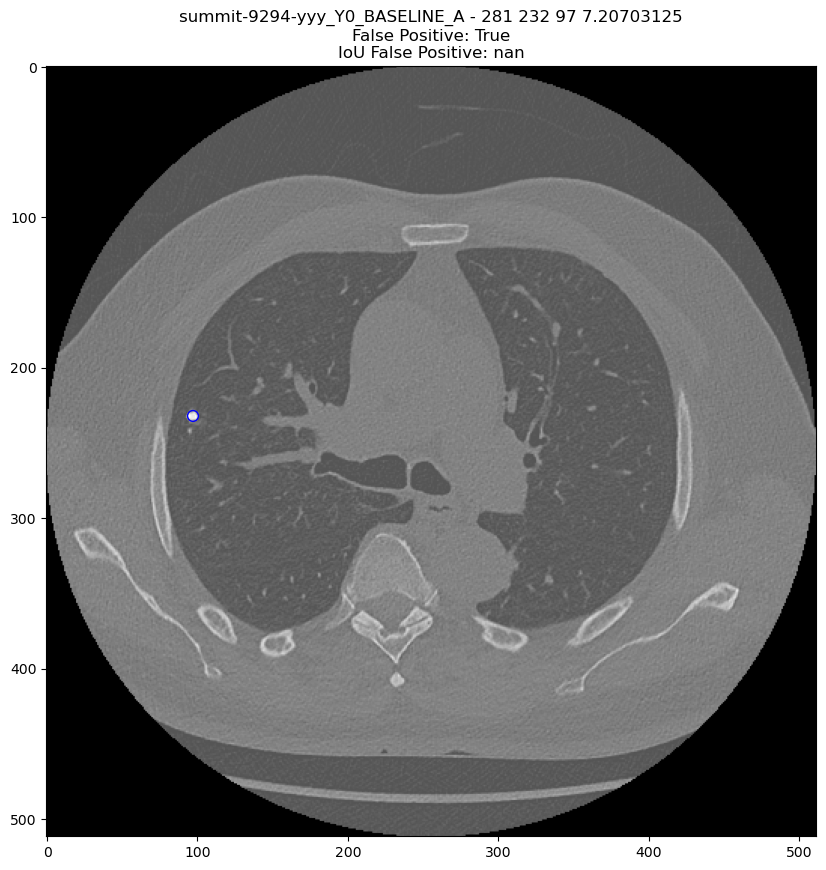

summit-4884-kgm_Y0_BASELINE_A already exists
summit-4884-kgm_Y0_BASELINE_A - 193 361 406 6.15234375
False Positive: True
IoU False Positive: nan


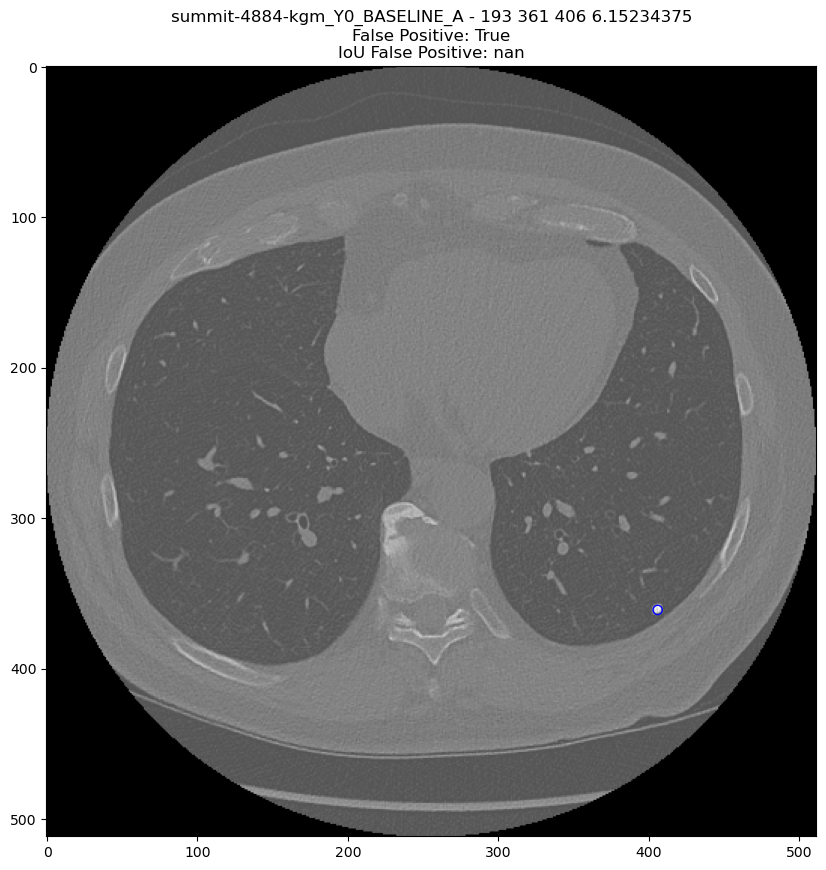

summit-7653-wpy_Y0_BASELINE_A already exists
summit-7653-wpy_Y0_BASELINE_A - 356 300 86 6.328125
False Positive: True
IoU False Positive: 0.0


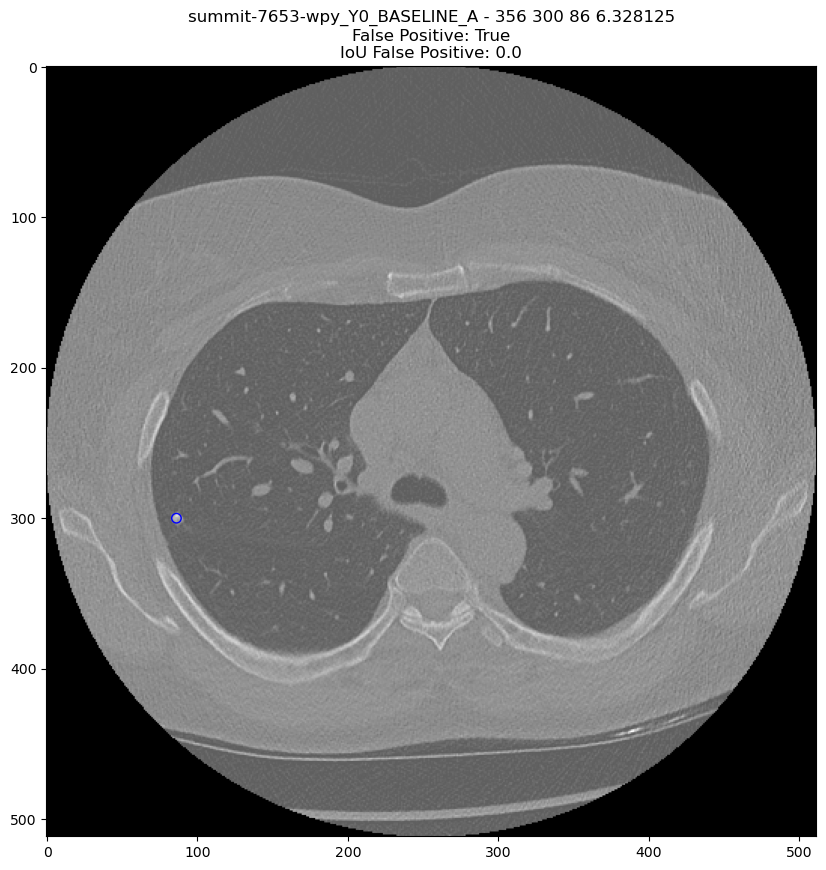

summit-3288-gfs_Y0_BASELINE_A already exists
summit-3288-gfs_Y0_BASELINE_A - 233 408 206 13.359375
False Positive: True
IoU False Positive: nan


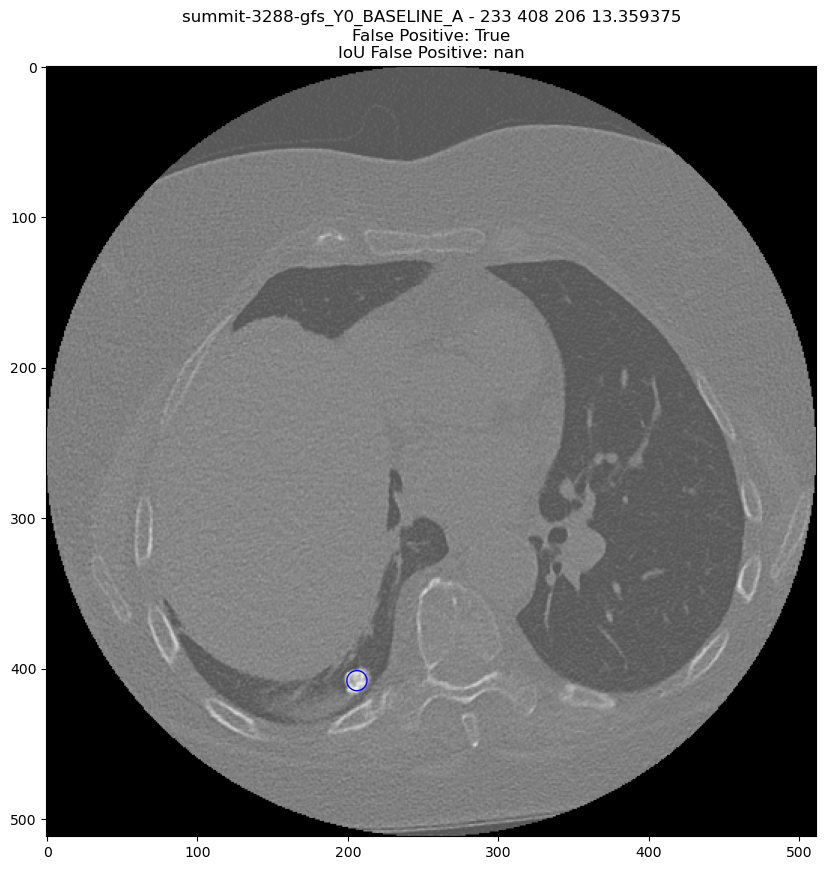

summit-3768-mgu_Y0_BASELINE_A already exists
summit-3768-mgu_Y0_BASELINE_A - 454 297 240 6.85546875
False Positive: True
IoU False Positive: 0.0


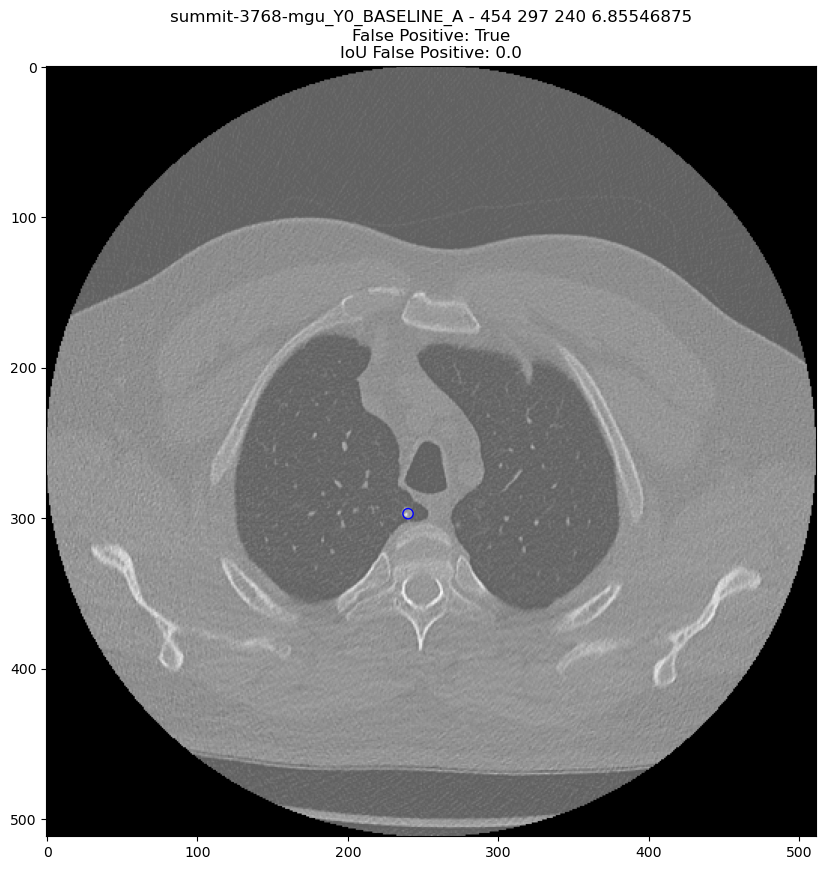

summit-8769-uas_Y0_BASELINE_A already exists
summit-8769-uas_Y0_BASELINE_A - 350 388 362 6.767578125
False Positive: True
IoU False Positive: nan


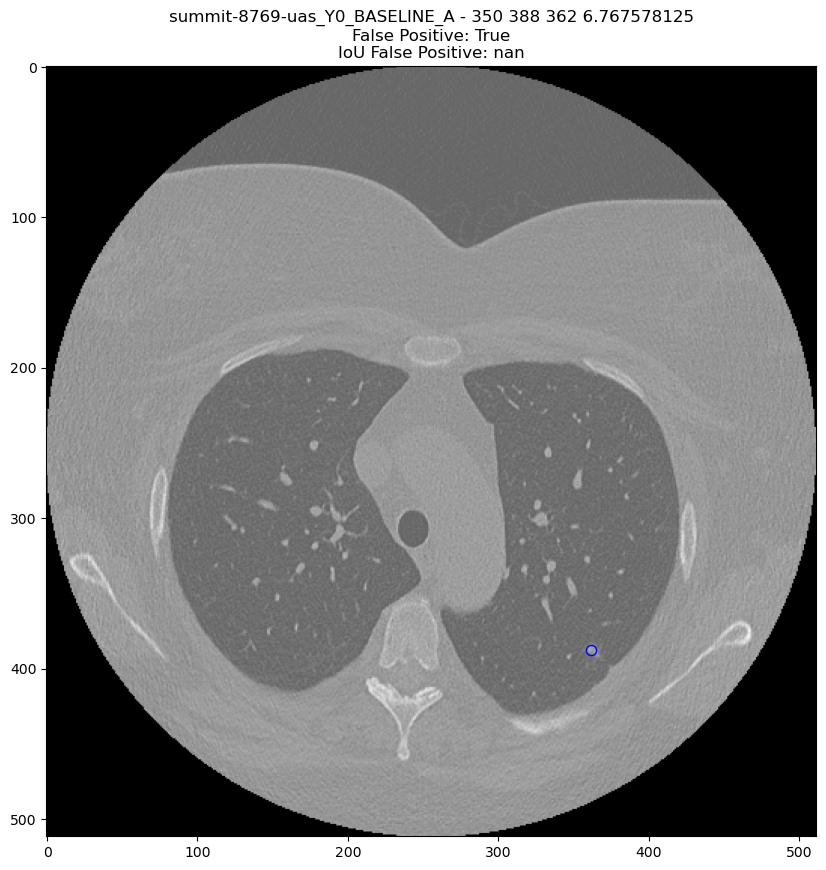

summit-8492-mxn_Y0_BASELINE_A already exists
summit-8492-mxn_Y0_BASELINE_A - 276 344 291 8.173828125
False Positive: True
IoU False Positive: 0.0


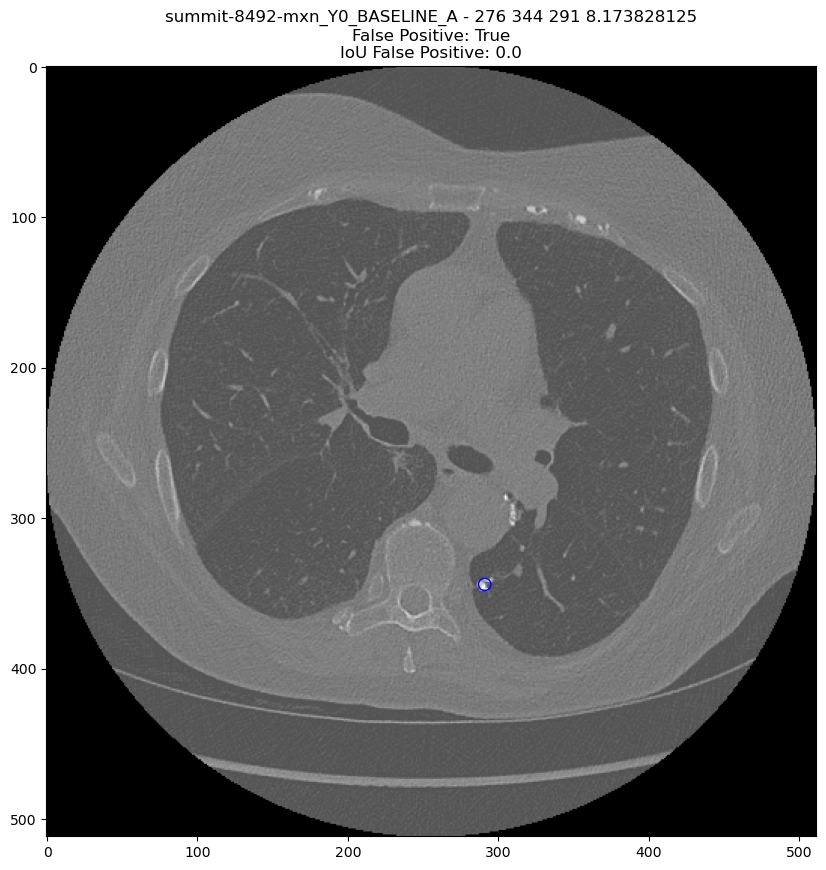

summit-3785-pcd_Y0_BASELINE_A already exists
summit-3785-pcd_Y0_BASELINE_A - 296 377 199 6.09375
False Positive: True
IoU False Positive: 0.0


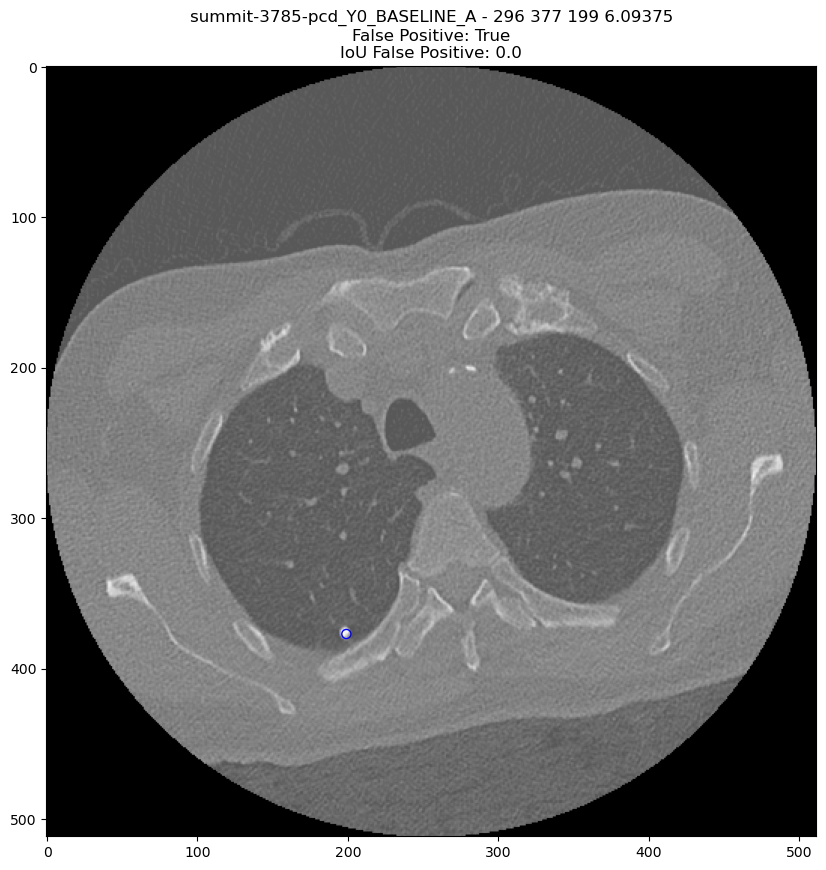

summit-3638-yab_Y0_BASELINE_A already exists
summit-3638-yab_Y0_BASELINE_A - 230 113 156 6.15234375
False Positive: True
IoU False Positive: nan


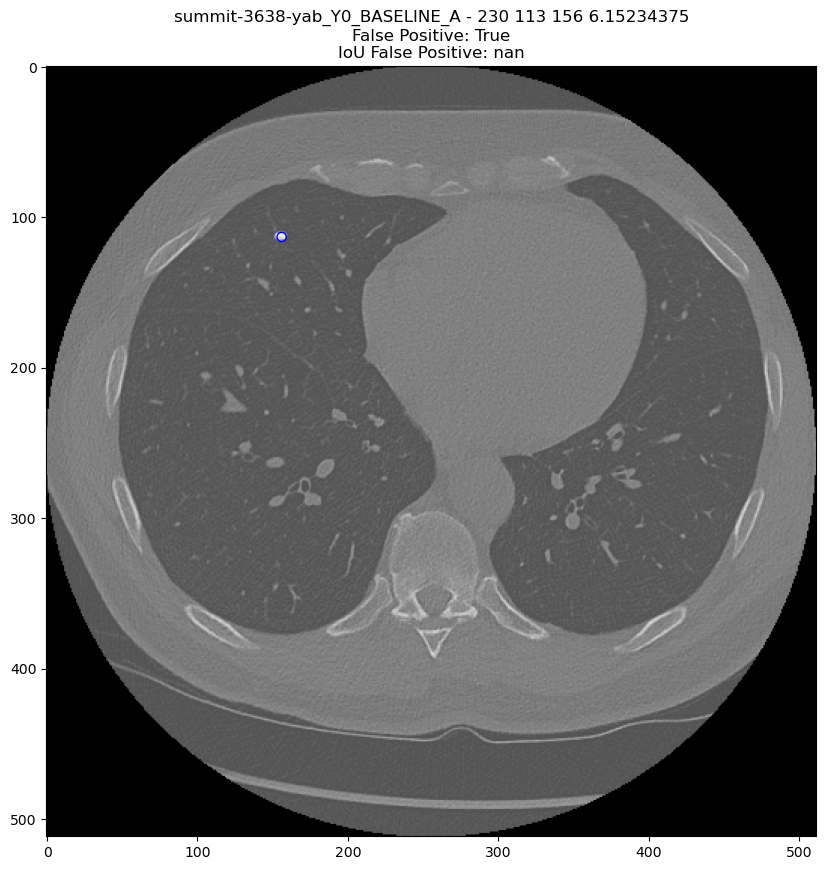

summit-6387-eye_Y0_BASELINE_A already exists
summit-6387-eye_Y0_BASELINE_A - 308 344 363 7.55859375
False Positive: True
IoU False Positive: nan


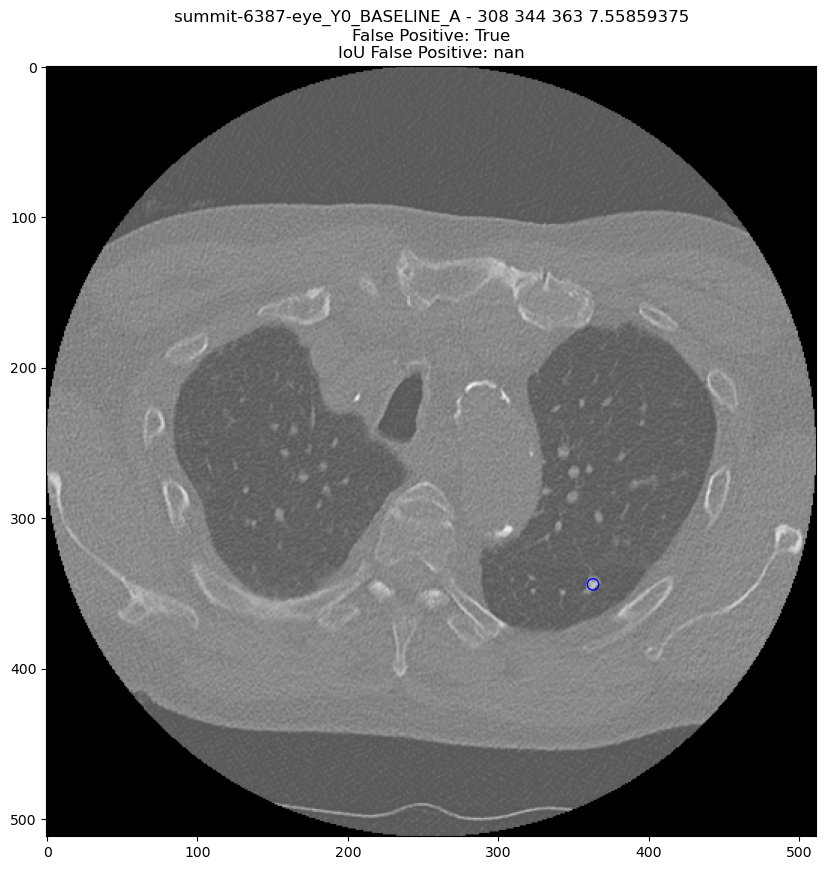

summit-6525-cdt_Y0_BASELINE_A already exists
summit-6525-cdt_Y0_BASELINE_A - 364 276 137 6.15234375
False Positive: True
IoU False Positive: nan


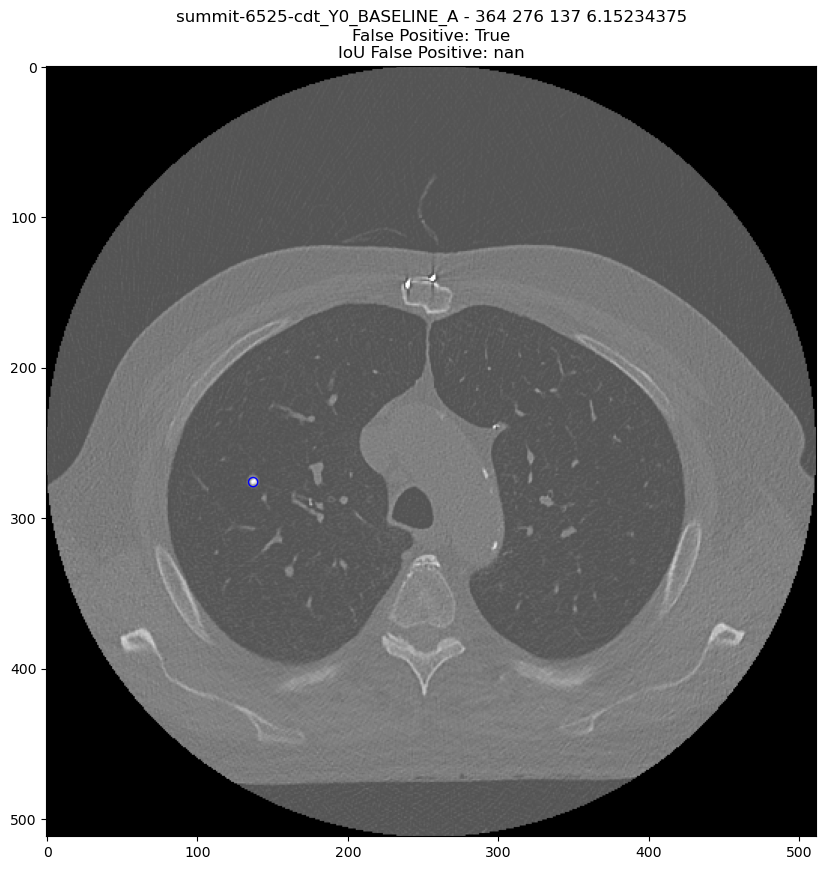

summit-9777-rvm_Y0_BASELINE_A already exists
summit-9777-rvm_Y0_BASELINE_A - 204 86 347 7.03125
False Positive: True
IoU False Positive: 0.0


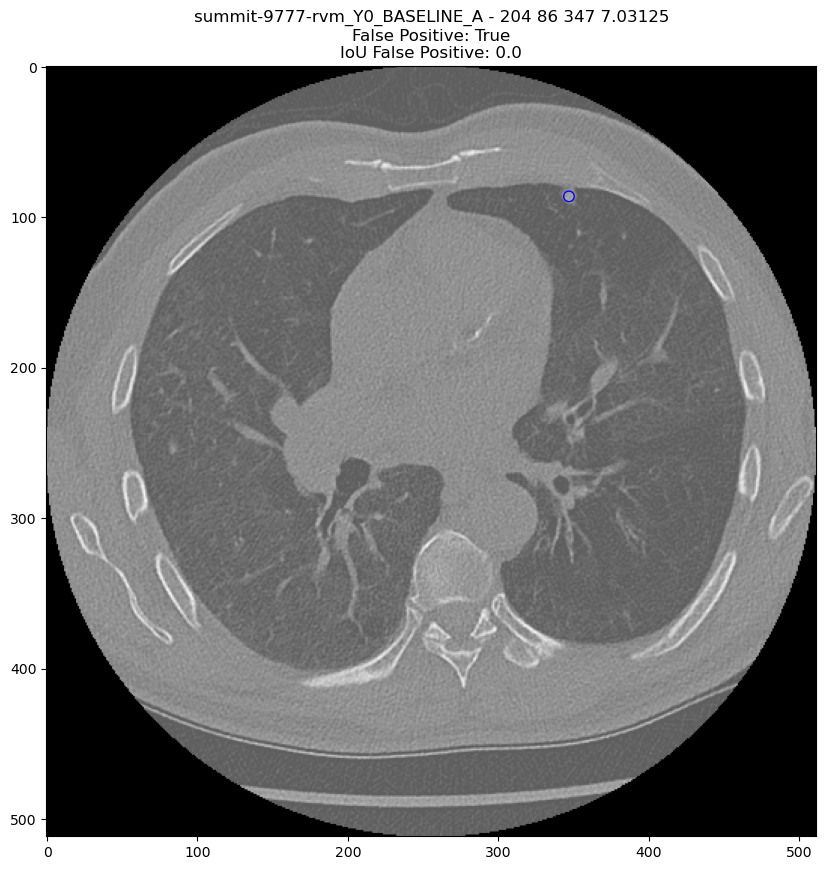

In [ ]:
df = false_positives_fpps['0.125']

cnt = 0
for idx, row in df[df.distance_false_positive].sort_values(by='threshold', ascending=False).iterrows():
    scan_id = row['name']
    study_id = scan_id.split('_')[0]
    x = row['row']
    y = row['col']
    z = row['index']
    diameter = row['diameter']
    

    copy_scan_from_cluster(scan_id)
    
    scan = SummitScan.load_scan(f'{workspace_path}/data/summit/scans/{study_id}/{scan_id}.mhd')
    irc = xyz2irc([x, y, z], scan.origin, scan.voxel_size, scan.orientation)


    show_mhd_candidate_location(scan_id, scan.image, irc.row, irc.col, irc.index, diameter, row.distance_false_positive, row.iou_false_positive)
    cnt+=1
    if cnt == 12:
        break